(0.3, 3)

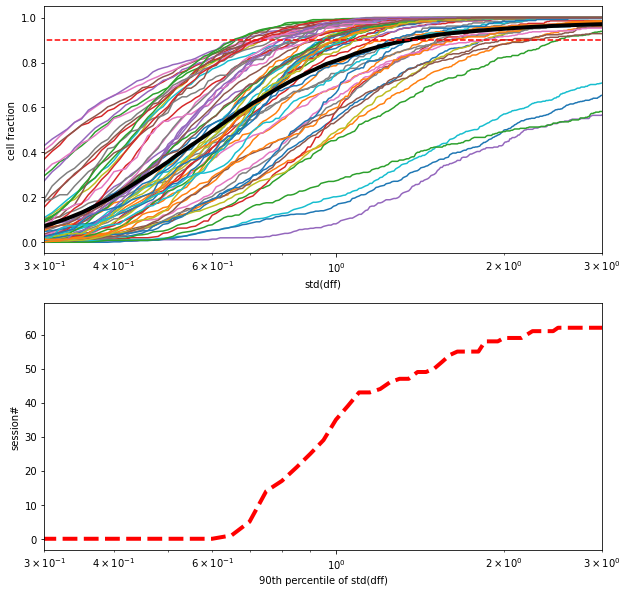

In [35]:
mins = []
maxes = []
ys = []
xrange = np.arange(0,200,.01)
multi_session_dict['ninetieth_std'] = []
for session_i in np.arange(len(multi_session_dict['sd_dff_closed_loop'])):
    sd_now = multi_session_dict['sd_dff_closed_loop'][session_i]
    sd_now= sd_now[np.isnan(sd_now)==False]
    sd_now= sd_now[np.isinf(sd_now)==False]
    sd_now= sd_now[sd_now<200]
    
    mins.append(np.min(sd_now))
    maxes.append(np.max(sd_now))
    y,x = np.histogram(sd_now,xrange)
    ys.append(y)
    if np.max(sd_now)>200:
        print(np.max(sd_now))
        asd
fig = plt.figure(figsize = [10,10])
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2,sharex = ax1)
x = xrange[1:]
ys_norm = []
ninetieth_perc = []
for y in ys:
    y = np.cumsum(y)/sum(y)
    ax1.plot(x,y)
    ys_norm.append(y)
    ninetieth_perc.append(x[np.argmin(np.abs(y-.9))])
ys_norm = np.asarray(ys_norm)
ax1.plot(x,np.nanmean(ys_norm,0),'k-',linewidth=4)
ax1.set_xscale('log')
ax1.set_xlabel('std(dff)')
ax1.set_ylabel('cell fraction')
ax1.plot([.1,50],[.9,.9],'r--')
y,x = np.histogram(ninetieth_perc,np.arange(.1,50,.05))
x = x[1:]
ax2.plot(x,np.cumsum(y),'r--',linewidth = 4)
ax2.set_xscale('log')
ax2.set_xlabel('90th percentile of std(dff)')
ax2.set_ylabel('session#')
multi_session_dict['ninetieth_std'] = ninetieth_perc
ax2.set_xlim([0.3,3])

In [29]:
np

<module 'numpy' from '/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/__init__.py'>

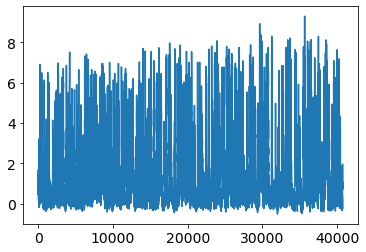

In [159]:
plt.plot(multi_session_dict['dFF_closed_loop'][session_i][np.nanargmax(multi_session_dict['sd_dff_closed_loop'][session_i]),:])

221

''

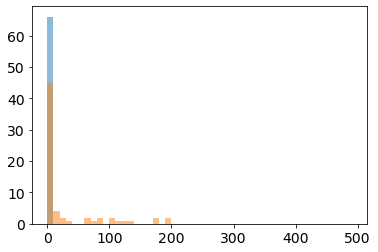

In [160]:
plt.hist(mins,np.arange(0,500,10),alpha = .5)
plt.hist(maxes,np.arange(0,500,10),alpha = .5)
''

/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **pa

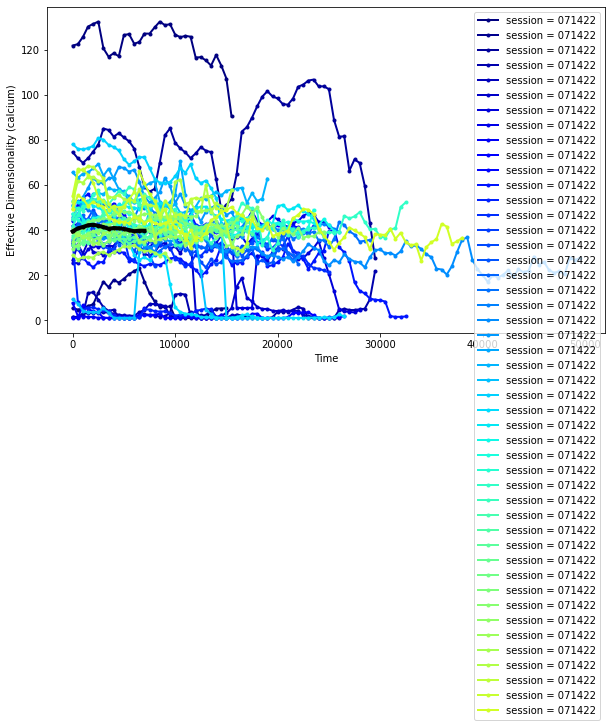

In [ ]:
# Matt Bull's dimensionality estimation
from sklearn.decomposition import PCA
import matplotlib.cm as cm

windowsize = 2000
windowstep = 500
PCAcomponents = 300
filt_win  =1
fig = plt.figure(figsize=[10,6])
ax = fig.add_subplot(1,1,1)
#sessionstostudy = multi_session_dict['mat_idx']#np.where(np.array(multi_session_behavior_data['session']).ravel() != None)[0]
sessionct=0
traces_calcium =[]
t_ = []
ii = 0
max_starting_hit_rate = .9
min_starting_hit_rate = .1
min_lickport_r = .3


plot_type = 'all ctrl'
#plot_type = 'high ctrl'
#plot_type = 'low light'

cmap = cm.jet(np.linspace(0,1,len(multi_session_dict['session'])))
cmap = cm.jet(np.linspace(0,1,77))


for session_i in np.arange(len(multi_session_dict['session'])):
#     if 'ctrl' in plot_type.lower():
#         if (multi_session_dict['light_session'][session_i] == True) or ( multi_session_dict['post_light_session'][session_i] == True):
#             continue
#     elif 'post light' in plot_type.lower():
#         if  multi_session_dict['post_light_session'][session_i] == False:
#             continue
#     elif 'light' in plot_type.lower():
#         if  multi_session_dict['light_session'][session_i] == False:#
#             continue
        
#     if 'low' in plot_type.lower():
#         if multi_session_dict['mouse'][session_i] not in lowexpressing_mice:#lowexpressing_mice:
#             continue
#     elif 'high' in plot_type.lower():
#         if multi_session_dict['mouse'][session_i] not in highexpressing_mice:#lowexpressing_mice:
#             continue
    
    # if multi_session_dict['threshold_dict'][session_i]['lickport_F_pearsonR']<min_lickport_r:
    #     #print('skipped')
    #     continue  
    
    ii+=1
    
    df =multi_session_dict['dFF_closed_loop'][session_i].T#*multi_session_dict['F0_closed_loop'][session_i]+multi_session_dict['F0_closed_loop'][session_i]).T# data_dict_big[subject][fov][session]['dff_closed_loop'].T
    df = df[np.isnan(df[:,0])==False,:] # remove NaNs
    df = df[:,np.isnan(df[0,:])==False] # remove NaNs
    df = df[np.isinf(df[:,0])==False,:] # remove NaNs
    df = df[:,np.isinf(df[0,:])==False] # remove NaNs
    if filt_win>1:
        df_filt = []
        for f in df.T:
            df_filt.append(BCI_analysis.plot_utils.rollingfun(f,filt_win,'mean'))
        df=np.asarray(df_filt).T
    numwindow = int((df.shape[0]-windowsize)/windowstep)
    dimovertime = np.zeros([numwindow,1])
    pca = PCA(n_components=PCAcomponents, svd_solver='full')
    try:
        for i in range(numwindow):

            pca.fit(df[i*windowstep:i*windowstep+windowsize,:])
            dimovertime[i] = np.sum(pca.explained_variance_)**2/(np.sum(pca.explained_variance_**2))
    except:
        continue
    ax.plot(np.arange(numwindow)*windowstep, dimovertime.ravel(),'.-', color=cmap[sessionct,:], lw = 2, label='session = ' + str(session))
    traces_calcium.append(dimovertime.ravel())
    sessionct += 1
    # if sessionct==10:
    #     break
    #break

l_ = []
for t in traces_calcium:
    l_.append(len(t))
l_ = np.min(l_)
dim_ca_matrix = np.zeros([len(traces_calcium),l_])
dim_dlc_matrix = np.zeros([len(traces_calcium),l_])
for i,c in enumerate(traces_calcium):
    dim_ca_matrix[i,:] = c[:l_]
ax.plot(np.arange(l_)*windowstep,np.mean(dim_ca_matrix,0),'k.-',linewidth = 4)    
   
    
ax.set_ylabel('Effective Dimensionality (calcium)')
plt.xlabel('Time')
ax.legend(loc='upper right')
plt.show()



<ErrorbarContainer object of 3 artists>

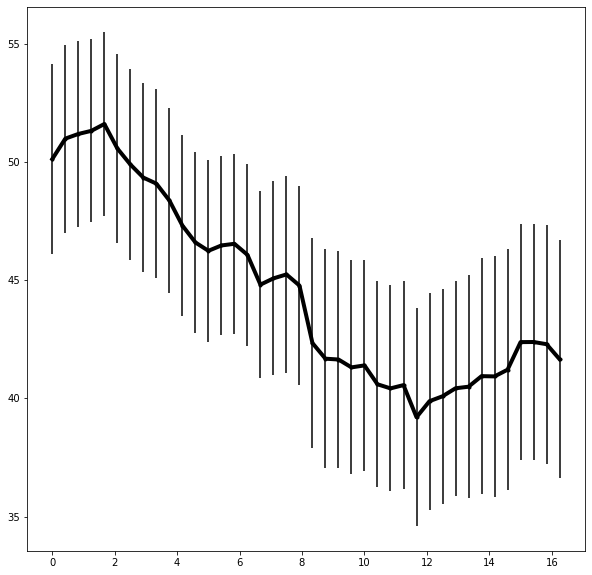

In [62]:
fig = plt.figure(figsize = [10,10])
ax = fig.add_subplot(111)
l_=40
dim_ca_matrix = np.zeros([len(traces_calcium),l_])*np.nan
for i,c in enumerate(traces_calcium):
    try:
        dim_ca_matrix[i,:l_] = c[:l_]
    except:
        pass
ax.plot(np.arange(l_)*windowstep/1200,np.nanmean(dim_ca_matrix,0),'k.-',linewidth = 4)   
ax.errorbar(np.arange(l_)*windowstep/1200,np.nanmean(dim_ca_matrix,0),np.nanstd(dim_ca_matrix,0)/np.sqrt(sum(np.isnan(dim_ca_matrix[:,0])==False)),color= 'black')

In [2]:
#Import necessary libraries - should work mostly from BCI_analysis + matplotlib + numpy
import BCI_analysis
from BCI_analysis.pipeline import pipeline_regression
import importlib
importlib.reload(pipeline_regression)
importlib.reload(BCI_analysis)
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import scipy

No module named 'cellpose'
cannot use anatomical mode, but otherwise suite2p will run normally


/tmp/ipykernel_9340/1234625925.py:1: RuntimeWarning: Mean of empty slice
  trial_amplitudes= np.nanmean(dff_trial_locked[frames_before:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)


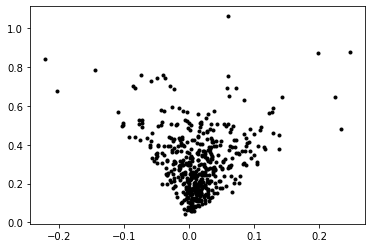

In [212]:
trial_amplitudes= np.nanmean(dff_trial_locked[frames_before:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
plt.plot(np.nanmean(trial_amplitudes,1),np.nanstd(trial_amplitudes,1),'k.')

10

In [5]:
rollingfun = BCI_analysis.plot_utils.rollingfun

def calculate_F0(F_raw):
    
    F = F_raw
    F0 = np.zeros_like(F)
    Dff = np.zeros_like(F)
    Fvar = np.zeros_like(F)
    print('calculating f0 for {}'.format(session))
    f0_offsets = []
    for cell_idx in range(F.shape[0]):
        #%
        #cell_idx =460
        f = F[cell_idx,:]
        sample_rate = 20
        window_t = 1 #s
        window = int(sample_rate*window_t)
        step=int(window/2)
        starts = np.arange(0,len(f)-window,step)
        stds = list()
        means = list()
        for start in starts:
            stds.append(np.var(f[start:start+window]))
            means.append(np.mean(f[start:start+window]))
        stds_roll = rollingfun(stds,100,'min')
        stds_roll = rollingfun(stds_roll,500,'median')

        means_roll = rollingfun(means,100,'min')
        means_roll = rollingfun(means_roll,500,'median')

        #%
        #f_scaled = np.copy(f)
        f0 = np.ones(len(f))
        fvar = np.ones(len(f))
        for start,var,fzero in zip(starts,stds_roll,means_roll):
            f0[start:start+window]=fzero
            fvar[start:start+window]=var
        f0[start:]=fzero
        fvar[start:]=var
        F0[cell_idx,:] = f0
        Fvar[cell_idx,:] = fvar
        dff = (f-f0)/f0
        Dff[cell_idx,:] =dff
        #%
#         try:
#             f_ = []
#             f0_ = []
#             stds_nonnan = np.asarray(stds.copy())
#             stds_nonnan = stds_nonnan[np.isnan(stds_nonnan)==False]
#             percvalue = np.percentile(stds_nonnan[:int(len(stds_nonnan)/2)],20)
#             for i in np.where(stds[:int(len(stds)/2)]<percvalue)[0]: # polish dff on the lower 20 percent of F values
#                 f_.append(f[starts[i]:starts[i]+window])
#                 f0_.append(f0[starts[i]:starts[i]+window])
#             f_ = np.concatenate(f_)
#             f0_ = np.concatenate(f0_)
#             dff_ = (f_-f0_)/f0_

#             #%

#             c,b = np.histogram(dff_,np.arange(-2,2,.05))
#             b=np.mean([b[1:],b[:-1]],0)
#             needed = b>-.5
#             c = c[needed]
#             b=b[needed]
#             #%
#             f0_offsets.append(b[np.argmax(c)])
#         except:
#             print('f0 estimation could not be corrected for roi {}'.format(cell_idx))
#             f0_offsets.append(0)


        #%%
    #F0 = F0*(np.median(f0_offsets)+1)
    return F0,Dff
#plt.plot(np.nanmean(F_corrected,0))

In [26]:
f0_data = np.load(os.path.join(mat_file_F0_dir,'F0'+filename[10:-3]+'npy'),allow_pickle=True).tolist()
dff_closedloop = f0_data['dff_closedloop']
F0 = f0_data['F0_closedloop']


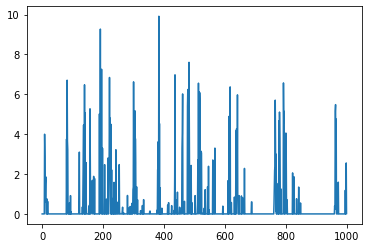

In [427]:
plt.plot(dff_now[:1000])

array([-0.87368643,  0.30307801])

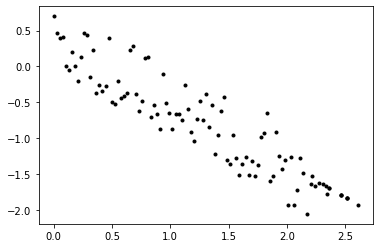

In [426]:
cell_i = 1
dff_now = data_raw['df_closedLoop'][:,cell_i]
baseline_now = BCI_analysis.plot_utils.rollingfun(dff_now,frames_before-border_frames)

#indices = np.argsort(baseline_now)[::stepsize]
baselines = []
peaks = []
# for i__ in np.asarray(indices-(frames_before-border_frames)/2,int):
#     if i__>data_raw['df_closedLoop'].shape[0]-frames_after or i__<0:
#         continue
minval = np.nanmin(baseline_now)
maxval = np.nanmax(baseline_now)
try:
    vals_needed = np.arange(minval,maxval,(maxval-minval)/100)
    for val_now in vals_needed:
        i__ = np.argmin(np.abs(baseline_now-val_now)) - int((frames_before-border_frames)/2)
        if i__>data_raw['df_closedLoop'].shape[0]-frames_after or i__<=0:
            continue
        baselines.append(np.nanmean(dff_now[i__:i__+frames_before-border_frames]))
        peaks.append(np.nanmean(dff_now[i__+frames_before:i__+frames_before+frames_after]))
    baselines = np.asarray(baselines)
    peaks = np.asarray(peaks)
    tunings = peaks-baselines

    nonnan = np.isnan(tunings) == False
    if sum(nonnan)>10:
        p_decay = np.polyfit(baselines[nonnan],tunings[nonnan],1)
    else:
        p_decay = [np.nan,np.nan]
except:
    p_decay = [np.nan,np.nan]
plt.plot(baselines,tunings,'k.')
p_decay

In [391]:
multi_session_dict['mean_activity_closed_loop'][session_i]

array([0.34315092, 0.65285382, 0.53992907, 1.24777311, 0.80108407,
       0.8727484 , 0.99666643, 1.40451268, 1.1424908 , 0.66425342,
       1.35440106, 0.82510143, 1.04008326, 0.85922547, 1.13619028,
       0.53045311, 1.34259715, 1.29919204, 0.81063255, 0.57996629,
       1.24101769, 0.77350307, 1.12326472, 0.74782643, 0.52817108,
       0.68948916, 0.57092419, 1.21328858, 0.66718917, 0.51131548,
       0.55960569, 0.71223855, 0.29328314, 0.89523875, 0.70365693,
       0.41570947, 1.02221053, 1.31550978, 0.32801532, 1.08776313,
       0.33155955, 0.36297888, 0.28077521, 0.41456182, 0.64819474,
       0.52294956, 0.72486207, 0.60215454, 0.79012325, 0.93803079,
       1.05368135, 0.85298945, 0.95833431, 0.74465647, 0.40747686,
       0.85056882, 0.7233822 , 1.07167726, 0.39941362, 0.93059262,
       0.35192434, 1.3240618 , 0.91138979, 0.59508533, 0.76854536,
       0.56068361, 0.78811763, 0.339119  , 0.74587783, 0.30348939,
       0.35412595, 0.96755249, 0.75981775, 0.31119647, 0.30806

In [1]:
data_raw.keys()

NameError: name 'data_raw' is not defined

data_behav_BCI29_042122.mat blacklisted, removed
data_behav_BCI29_051122.mat blacklisted, removed
data_behav_BCI29_051322_2.mat blacklisted, removed
data_behav_BCI29_051722.mat blacklisted, removed
data_behav_BCI29_052022.mat blacklisted, removed
data_behav_BCI29_052422.mat blacklisted, removed
data_behav_BCI30_050322.mat blacklisted, removed
data_behav_BCI31_051222.mat blacklisted, removed
data_behav_BCI31_051822.mat blacklisted, removed
data_behav_BCI31_051922.mat blacklisted, removed
data_behav_BCI31_052022.mat blacklisted, removed
data_behav_BCI31_052422.mat blacklisted, removed
data_behav_BCI31_052522.mat blacklisted, removed
data_behav_BCI34_070722.mat blacklisted, removed
data_behav_BCI35_063022.mat blacklisted, removed
data_behav_BCI38_071322.mat blacklisted, removed
data_behav_BCI38_071422.mat blacklisted, removed
data_behav_BCI38_071822.mat blacklisted, removed
data_behav_BCI38_071922.mat blacklisted, removed
data_behav_BCI39_070522.mat blacklisted, removed
F0 loaded


/tmp/ipykernel_27079/3151095794.py:202: RuntimeWarning: Mean of empty slice
  mean_traces = np.nanmean(dff_trial_locked_for_mean,2)
/tmp/ipykernel_27079/3151095794.py:208: RuntimeWarning: Mean of empty slice
  mean_amplitudes= np.nanmean(mean_traces[frames_before:,:],0)-np.nanmean(mean_traces[:frames_before-border_frames,:],0)
/tmp/ipykernel_27079/3151095794.py:209: RuntimeWarning: Mean of empty slice
  trial_amplitudes= np.nanmean(dff_trial_locked[frames_before:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
/tmp/ipykernel_27079/3151095794.py:210: RuntimeWarning: Mean of empty slice
  trial_baseline = np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
/home/jupyter/Scripts/BCI_analysis/BCI_analysis/plot/plot_utils.py:32: RuntimeWarning: Mean of empty slice
  out = np.nanmean(ys,0)[window:-window]
/tmp/ipykernel_27079/3151095794.py:225: RuntimeWarning: All-NaN slice encountered
  minval = np.nanmin(baseline_now)
/tmp/ipykernel_27079/3151095794.py

F0 loaded
F0 loaded
F0 loaded


/tmp/ipykernel_27079/3151095794.py:209: RuntimeWarning: invalid value encountered in subtract
  trial_amplitudes= np.nanmean(dff_trial_locked[frames_before:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
/tmp/ipykernel_27079/3151095794.py:228: RuntimeWarning: invalid value encountered in double_scalars
  vals_needed = np.arange(minval,maxval,(maxval-minval)/100)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1545: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


F0 loaded


/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded


/tmp/ipykernel_27079/3151095794.py:208: RuntimeWarning: invalid value encountered in subtract
  mean_amplitudes= np.nanmean(mean_traces[frames_before:,:],0)-np.nanmean(mean_traces[:frames_before-border_frames,:],0)


F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded


/tmp/ipykernel_27079/3151095794.py:293: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig= plt.figure()


F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
F0 loaded
done


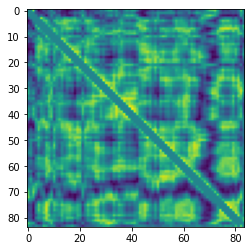

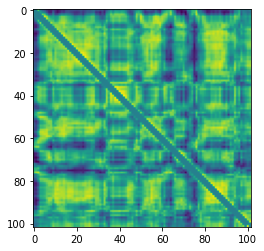

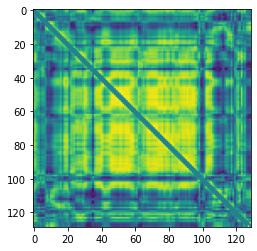

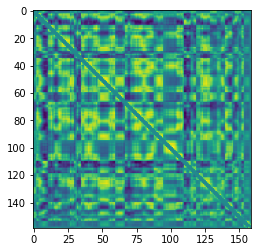

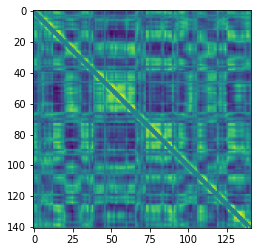

...

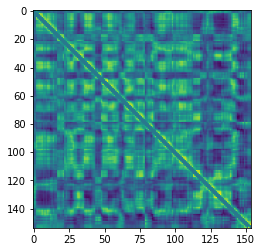

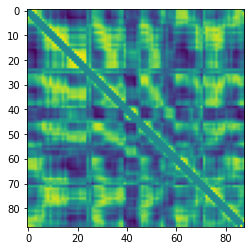

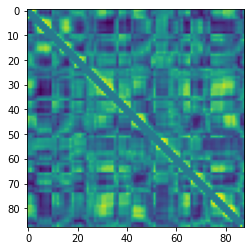

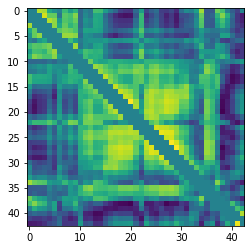

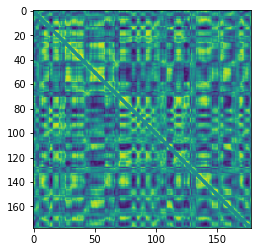

In [3]:
# using data from .mat file 
from oasis.functions import deconvolve
importlib.reload(BCI_analysis)

mat_file_dir = "/home/jupyter/bucket/Data/Calcium_imaging/multi_session_mat/"
mat_file_F0_dir = "/home/jupyter/bucket/Data/Calcium_imaging/multi_session_mat/F0_recalculated/"
dlc_base_dir = os.path.abspath("/home/jupyter/bucket/Data/Behavior_videos/DLC_output/Bergamo-2P-Photostim/")
bpod_path = os.path.abspath("/home/jupyter/bucket/Data/Behavior/BCI_exported/Bergamo-2P-Photostim/")
suite2p_path = os.path.abspath("/home/jupyter/bucket/Data/Calcium_imaging/suite2p/Bergamo-2P-Photostim/")
sessionwise_data_path = os.path.abspath("/home/jupyter/bucket/Data/Calcium_imaging/sessionwise_tba/")

plt_save_path = os.path.abspath("/home/jupyter/Plots/")
face_rhythm_base_dir = '/home/jupyter/bucket/Data/Behavior_videos/FaceRhythm/'
motion_energy_base_dir = os.path.abspath("/home/jupyter/bucket/Data/Behavior_videos/MotionEnergy/Bergamo-2P-Photostim/")
raw_video_path = os.path.abspath("/home/jupyter/bucket/Data/Behavior_videos/raw/Bergamo-2P-Photostim/")


frames_before = 40 #before go cue
border_frames = 10 #this is ignored BEFORE go CUE from baseline - it is going towards amplitude if it is deconvolved
frames_after  = 200#200 # for amplitude calculations
#first_trial_to_use = 10 # for amplitude calculation,
num_rew_to_start = 5 # amplitude calculation after this many rewarded trials
num_trials_to_use = 50
recalculate_F0 = True
use_scalar_f0 = False # median of running F0
calculate_decay_contribution =True

do_deconvolve = False

#last_trial_to_use = 50 # for amplitude calculation,
multi_session_dict = {'mouse':[],
                     'session':[],
                     'cn':[],
                      'rew':[],
                      'trial_start':[],
                      'vel':[],
                     'reward_indices':[],
                      'dFF_closed_loop':[],
                      'F0_closed_loop':[],
                     'trial_start_indices': [],
                     'lickport_move_indices':[],
                     'averaged_lickport_speed':[],
                     'hits':[],
                      'tuning':[],
                      'trialwise_tuning':[],
                      'trialwise_tuning_baseline':[],
                      'std_tuning':[],
                      'n_trials':[],
                      'sd_dff_closed_loop':[],
                      'F0':[],
                      'decay_p':[],
                      'mean_activity_closed_loop':[],
                      'mean_activity_closed_loop_selected':[]}
#needed_subject = 'BCI34'
sessions_with_errors = [] # sessions that are skipped collected in this list
no_cn_sessions = []
invalid_neurons = [] # with inf
blacklist = ['data_behav_BCI29_051122.mat',#only 18 trials
             'data_behav_BCI29_052422.mat', # no CN
             'data_behav_BCI30_050322.mat',# no CN
             'data_behav_BCI34_070722.mat',# no CN
             'data_behav_BCI31_051222.mat',#only 3 trials
             'data_behav_BCI35_063022.mat',# no CN
             'data_behav_BCI39_070522.mat', #no cn
             'data_behav_BCI29_042122.mat',# no video?
             # 'data_behav_BCI29_061022.mat',#next sessions CN is missing
             # 'data_behav_BCI29_050622.mat',#next sessions CN is missing
             # #'050422'
             #'data_behav_BCI29_051322_2.mat',# error during this extraction
             'data_behav_BCI29_051722.mat',# no video?
             'data_behav_BCI29_052022.mat',# no video?
             'data_behav_BCI31_051822.mat',# no video?
             'data_behav_BCI31_051922.mat',# no video?
             'data_behav_BCI31_052022.mat',# no video?
             'data_behav_BCI31_052422.mat',# no video?
             'data_behav_BCI31_052522.mat',# no video?
             'data_behav_BCI29_051322_2.mat',# no video?
             'data_behav_BCI38_071322.mat',# no video?
             'data_behav_BCI38_071422.mat',# no video?
             'data_behav_BCI38_071822.mat',# no video?
             'data_behav_BCI38_071922.mat',# no video?
            ]

mat_files_ = os.listdir(mat_file_dir)
mat_files = []
session_dates = {}
kept_files = []
files_thrown_away = []
for f in mat_files_:
    if f.startswith('data_behav'):
        if f in blacklist:
            print('{} blacklisted, removed'.format(f))
            files_thrown_away.append(f)
            continue
        mat_files.append(f)
        subject = f[11:16]
        session = f[17:23]
        if subject not in session_dates.keys():
            session_dates[subject] = {}
        session_dates[subject][datetime.strptime(session,'%m%d%y')]  = [session,f]
        kept_files.append(f)
for mouse in session_dates.keys():
    for session_date in np.sort(list(session_dates[mouse].keys())):
        session,filename = session_dates[mouse][session_date]
        data_raw = scipy.io.loadmat(os.path.join(mat_file_dir,filename))
        # check basic stuff
        if data_raw['session'][0] != session:
            print('invalid session!! {} vs {}, using the latter'.format(data_raw['session'][0], session))
        try:
            data_raw['conditioned_neuron'][0][0]
        except:
            print('no cn for {}, skipping'.format(filename))
            no_cn_sessions.append(filename)
            continue
        
        
        reward_indices = np.where(data_raw['rew'][0])[0]
        trial_start_indices = np.where(data_raw['trial_start'][0])[0]
        lickport_move_indices = np.where(BCI_analysis.plot_utils.rollingfun(data_raw['vel'][0],3)==1)[0]
        averaged_lickport_speed = BCI_analysis.plot_utils.rollingfun(data_raw['vel'][0],20)
        hits = []
        hit_rate_vector = np.zeros_like(data_raw['trial_start'][0])

        for i,ti in enumerate(trial_start_indices):
            if i<len(trial_start_indices)-1:
                tii = trial_start_indices[i+1]
            else:
                tii = len(data_raw['trial_start'][0])
            if any((reward_indices>ti) & (reward_indices<tii)):
                hits.append(True)
            else:
                hits.append(False)
        hits = np.asarray(hits) 
        #data_raw['df_closedLoop'].shape
        
        if recalculate_F0:
            
            try:
                f0_data = np.load(os.path.join(mat_file_F0_dir,'F0'+filename[10:-3]+'npy'),allow_pickle=True).tolist()
                dff_closedloop = f0_data['dff_closedloop']
                F0 = f0_data['F0_closedloop']

                print('F0 loaded')
            except:
                
                F0_list = []
                F_closedloop = []
                data_raw_2 = scipy.io.loadmat(os.path.join(mat_file_dir,'data'+filename[10:]))
                for cell in np.arange( data_raw_2['Fraw'].shape[1]):
                    F = data_raw_2['Fraw'][:,cell,:].flatten()
                    dFF = data_raw_2['F'][:,cell,:].flatten()
                    needed = np.isnan(dFF)  == False
                    p = np.polyfit(dFF[needed],F[needed],1)
                    F0 = np.polyval(p,0)
                    F0_list.append(F0)
                    F_closedloop.append((data_raw['df_closedLoop'][:,cell]*F0)+F0)
                F0_list = np.asarray(F0_list)
                F_closedloop = np.asarray(F_closedloop).T
                F0, dff_closedloop = calculate_F0(F_closedloop.T)
                data_to_save = {'dff_closedloop':dff_closedloop,
                               'F0_closedloop':F0}
                np.save(os.path.join(mat_file_F0_dir,'F0'+filename[10:-3]+'npy'),data_to_save)
            if use_scalar_f0:
                F0_scalar  = np.nanmedian(F0,1)[:,np.newaxis]
                F_closedloop = dff_closedloop*F0+F0
                dff_closedloop = (F_closedloop-F0_scalar)/F0_scalar
            data_raw['df_closedLoop'] = dff_closedloop.T
        else:
            F0_list = []
            F_closedloop = []
            data_raw_2 = scipy.io.loadmat(os.path.join(mat_file_dir,'data'+filename[10:]))
            for cell in np.arange( data_raw_2['Fraw'].shape[1]):
                F = data_raw_2['Fraw'][:,cell,:].flatten()
                dFF = data_raw_2['F'][:,cell,:].flatten()
                needed = np.isnan(dFF)  == False
                p = np.polyfit(dFF[needed],F[needed],1)
                F0 = np.polyval(p,0)
                F0_list.append(F0)
                F_closedloop.append((data_raw['df_closedLoop'][:,cell]*F0)+F0)
            F0 = np.asarray(F0_list)
        if do_deconvolve:
            spikes_matrix= []
            F_for_deconv =  data_raw['df_closedLoop']*10+10
            for F_trace in F_for_deconv.T:
                try:
                    c, s, b_, g_, lam = deconvolve(F_trace, penalty=1) 
                except:
                    s = np.zeros(len(F_trace))
                    print('could not deconvolve')
                spikes_matrix.append(s)
            data_raw['df_closedLoop'] = np.asarray(spikes_matrix).T
        
        dff_trial_locked  = BCI_analysis.pipeline_align.sessionwise_to_trialwise_simple(data_raw['df_closedLoop'].T,
                                                                                       data_raw['trial_start'][0],
                                                                                       frames_after=frames_after, 
                                                                                        frames_before=frames_before,
                                                                                        include_next_trial = False)
        first_trial_to_use = np.cumsum(data_raw['trial_start'][0])[np.argmax(np.cumsum(data_raw['rew'][0])==num_rew_to_start)]
        last_trial_to_use = int(num_trials_to_use+first_trial_to_use)
        #print([first_trial_to_use,last_trial_to_use])
        dff_trial_locked_for_mean = dff_trial_locked[:,:,first_trial_to_use:last_trial_to_use]
        mean_traces = np.nanmean(dff_trial_locked_for_mean,2)
        
        if do_deconvolve:
            mean_amplitudes= np.nanmean(mean_traces[frames_before-border_frames:,:],0)-np.nanmean(mean_traces[:frames_before-border_frames,:],0)
            trial_amplitudes= np.nanmean(dff_trial_locked[frames_before-border_frames:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
        else:
            mean_amplitudes= np.nanmean(mean_traces[frames_before:,:],0)-np.nanmean(mean_traces[:frames_before-border_frames,:],0)
            trial_amplitudes= np.nanmean(dff_trial_locked[frames_before:,:,:],0)-np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
        trial_baseline = np.nanmean(dff_trial_locked[:frames_before-border_frames,:,:],0)
        p_decay_list = []
        if calculate_decay_contribution:
            stepsize = int(data_raw['df_closedLoop'].shape[0]/100)
            
            for cell_i in np.arange(data_raw['df_closedLoop'].shape[1]):
                dff_now = data_raw['df_closedLoop'][:,cell_i]
                baseline_now = BCI_analysis.plot_utils.rollingfun(dff_now,frames_before-border_frames)

                #indices = np.argsort(baseline_now)[::stepsize]
                baselines = []
                peaks = []
                # for i__ in np.asarray(indices-(frames_before-border_frames)/2,int):
                #     if i__>data_raw['df_closedLoop'].shape[0]-frames_after or i__<0:
                #         continue
                minval = np.nanmin(baseline_now)
                maxval = np.nanmax(baseline_now)
                try:
                    vals_needed = np.arange(minval,maxval,(maxval-minval)/100)
                    for val_now in vals_needed:
                        i__ = np.argmin(np.abs(baseline_now-val_now)) - int((frames_before-border_frames)/2)
                        if i__>data_raw['df_closedLoop'].shape[0]-frames_after or i__<=0:
                            continue
                        baselines.append(np.nanmean(dff_now[i__:i__+frames_before-border_frames]))
                        peaks.append(np.nanmean(dff_now[i__+frames_before:i__+frames_before+frames_after]))
                    baselines = np.asarray(baselines)
                    peaks = np.asarray(peaks)
                    tunings = peaks-baselines

                    nonnan = np.isnan(tunings) == False
                    if sum(nonnan)>10:
                        p_decay = np.polyfit(baselines[nonnan],tunings[nonnan],1)
                    else:
                        p_decay = [np.nan,np.nan]
                except:
                    p_decay = [np.nan,np.nan]
                p_decay_list.append(p_decay)
                
                
                
        
        first_trial_to_use = np.cumsum(data_raw['trial_start'][0])[np.argmax(np.cumsum(data_raw['rew'][0])==num_rew_to_start)]
        first_frame = np.argmax(np.cumsum(data_raw['rew'][0])==num_rew_to_start)
        last_frame = np.argmax(np.cumsum(data_raw['trial_start'][0]) == int(num_trials_to_use+first_trial_to_use))
        multi_session_dict['mean_activity_closed_loop'].append(np.nanmean(data_raw['df_closedLoop'],0))
        multi_session_dict['mean_activity_closed_loop_selected'].append(np.nanmean(data_raw['df_closedLoop'][first_frame:last_frame,:],0))
        
        multi_session_dict['mouse'].append(mouse)
        multi_session_dict['session'].append(session)
        multi_session_dict['cn'].append(data_raw['conditioned_neuron'][0])
        multi_session_dict['reward_indices'].append(reward_indices)
        multi_session_dict['trial_start_indices'].append(trial_start_indices)
        multi_session_dict['lickport_move_indices'].append(lickport_move_indices)
        multi_session_dict['hits'].append(hits)
        multi_session_dict['averaged_lickport_speed'].append(averaged_lickport_speed)
        
        
        multi_session_dict['rew'].append(data_raw['rew'][0])
        multi_session_dict['trial_start'].append(data_raw['trial_start'][0])
        multi_session_dict['vel'].append(data_raw['vel'][0])
        multi_session_dict['tuning'].append(mean_amplitudes)
        
        multi_session_dict['trialwise_tuning'].append(trial_amplitudes)
        multi_session_dict['trialwise_tuning_baseline'].append(trial_baseline)
        multi_session_dict['std_tuning'].append(np.nanstd(trial_amplitudes,1))
        multi_session_dict['n_trials'].append(trial_amplitudes.shape[1])
        multi_session_dict['sd_dff_closed_loop'].append(np.nanstd(data_raw['df_closedLoop'],0))
        multi_session_dict['F0'].append(np.nanmean(F0,1))
        multi_session_dict['decay_p'].append(np.asarray(p_decay_list))
        
        multi_session_dict['dFF_closed_loop'].append(data_raw['df_closedLoop'].T)
        multi_session_dict['F0_closed_loop'].append(F0)
        cn_trial_locked = dff_trial_locked[:,data_raw['conditioned_neuron'][0][0]-1,:]
        cn_trial_locked[np.isnan(cn_trial_locked)] = 0
        cn_trial_locked = cn_trial_locked[:200,:]
        trial_averaging=5
        cn_trial_locked = scipy.ndimage.convolve(cn_trial_locked,np.ones([1,trial_averaging])/trial_averaging)
        p = np.corrcoef(cn_trial_locked.T)
        p[p>.99] = 0
        eye = np.zeros(p.shape)
        for e_ in np.arange(-int(trial_averaging/2),int(trial_averaging/2)):
             eye+= np.roll(np.eye(p.shape[0]),e_)
        p[eye ==1] = 0
        fig= plt.figure()
        plt.imshow(p)
print('done')

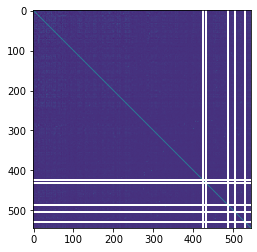

In [8]:
plt.imshow(multi_session_dict['task_correlation'][0])

In [6]:
## OTLET:
## Ha a korrelaciok nem valtoznak, akkor a sejtek, akik korrelalnak a CN-nel szinten megnovelik a task tuning-ot?
multi_session_dict['task_correlation'] = []
for session_i in np.arange(len(multi_session_dict['tuning'])):
    multi_session_dict['task_correlation'].append(np.corrcoef(multi_session_dict['dFF_closed_loop'][session_i]))



/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/_methods.py:179: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/lib/function_base.py:2536: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


(-0.1, 0.2)

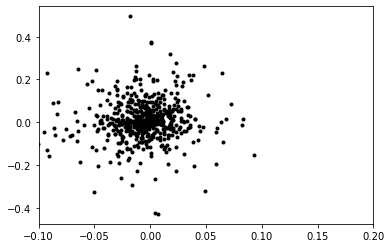

In [33]:
session_i = 1
cn = multi_session_dict['cn'][session_i][0]-1
delta_tuning = multi_session_dict['delta_tuning'][session_i]
corr = multi_session_dict['task_correlation'][session_i-1][cn,:]
plt.plot(corr,delta_tuning,'k.')
plt.xlim([-.1,.2])

In [361]:
for session_i in np.arange(len(multi_session_dict['sd_dff_closed_loop'])): 
    cn = multi_session_dict['cn'][session_i][0]-1
    multi_session_dict['sd_dff_closed_loop'][session_i][cn]

array([1.19304902, 1.29653522, 1.7432249 , 1.11476384, 1.07585045,
       0.86506117, 1.03342708, 0.60974977, 0.47928195, 0.28942364,
       0.57930934, 0.95761533, 0.79169895, 0.62994299, 0.97214611,
       0.97127227, 0.36088307, 0.93753289, 0.97739166, 0.46751707,
       0.42134589, 0.66306908, 0.5235397 , 1.64862396, 0.78795522,
       1.02151026, 0.36177953, 0.93504966, 0.89014794, 1.22464022,
       0.45636584, 0.63419033, 1.28268687, 0.96738767, 1.00898246,
       0.87120456, 0.77817407, 0.71036303, 0.5259106 , 1.24922802,
       0.87662879, 0.7531589 , 0.61020519, 0.95138994, 0.56888076,
       0.65060265, 0.73135455, 0.53298918, 0.69402847, 0.72717588,
       0.39721181, 0.57963408, 0.87143466, 0.63484815, 0.62678767,
       0.57944936, 1.01246882, 0.36734958, 1.15703947, 0.7909608 ,
       0.53264325, 0.43107654, 1.06907448, 1.11623298, 0.84454129,
       0.48268421, 0.92774891, 0.48497868, 1.40643184, 0.33150568,
       0.58516861, 0.72744789, 0.40293475, 0.78183664, 0.69586

(700.0, 1800.0)

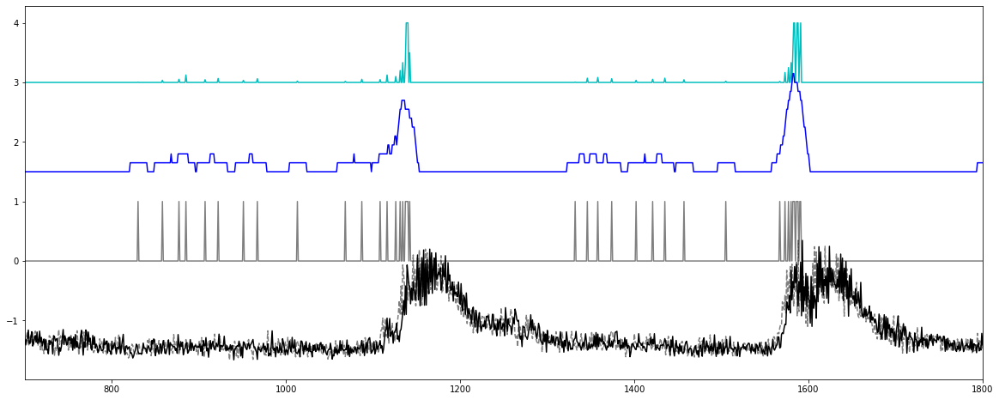

In [249]:
# show lickport speed measurement
dff = np.roll(multi_session_dict['dFF_closed_loop'][3][multi_session_dict['cn'][3][0]-1,:],15)
dff2 = np.roll(multi_session_dict['dFF_closed_loop'][3][multi_session_dict['cn'][3][0]-1,:],10)
vel = multi_session_dict['vel'][3]
vel_speed = np.zeros(len(vel))
step_indices = np.where(vel>0)[0]
previous_step = 0
for i in step_indices:
    vel_speed[i] = 1/(i-previous_step)
    previous_step = i

fig = plt.figure(figsize = [20,8])
ax= fig.add_subplot(1,1,1)
ax.plot(vel,'k-',alpha = .5)

#ax2 = ax.twinx()
ax.plot(vel_speed+3,'c-')
ax.plot(rollingfun(vel,20)*3+1.5,'b-')
ax.plot(dff/4-1.5,'k-')
#ax.plot(dff2/4-1.5,'k--',alpha = .5)
ax.set_xlim([700,1800])

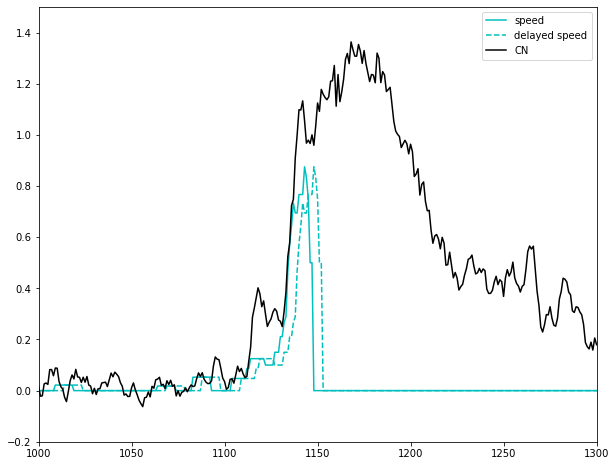

In [296]:
# show lickport speed measurement
dff = rollingfun(np.roll(multi_session_dict['dFF_closed_loop'][3][multi_session_dict['cn'][3][0]-1,:],15),5)

vel = multi_session_dict['vel'][3]
vel_speed = np.zeros(len(vel))
step_indices = np.where(vel>0)[0]
previous_step = 0
for i in step_indices:
    vel_speed[i] = 1/(i-previous_step)
    previous_step = i

fig = plt.figure(figsize = [10,8])
ax= fig.add_subplot(1,1,1)
#ax.plot(vel,'k-',alpha = .5)

#ax2 = ax.twinx()
#ax.plot(vel_speed,'c-')
vel_trace = vel_speed.copy()
vel_trace[vel_trace==0]=np.nan
vel_trace = rollingfun(vel_trace,10)
vel_trace[np.isnan(vel_trace)] = 0
ax.plot(vel_trace,'c-',label = 'speed')
ax.plot(np.roll(vel_trace,5),'c--',label = 'delayed speed')

#ax.plot(rollingfun(vel,20)*3+1.5,'b-')
ax.plot(dff/4,'k-',label = 'CN')

ax.set_xlim([1000,1300])
ax.set_ylim([-.2,1.5])
ax.legend()

In [4]:
# make fields so code won't break - also better velocity definition
max_frame_num_to_compute_speed = 40
multi_session_dict['light_session'] = [False]*len(multi_session_dict['session'])
multi_session_dict['post_light_session'] = [False]*len(multi_session_dict['session'])
multi_session_dict['masking_flash'] = [False]*len(multi_session_dict['session'])
multi_session_dict['FOV_mean_red_level'] = [0]*len(multi_session_dict['session'])
multi_session_dict['FOV_max_red_level'] = [0]*len(multi_session_dict['session'])
multi_session_dict['cn_red_level'] = [0]*len(multi_session_dict['session'])
multi_session_dict['vel_real'] = []
for session_idx in np.arange(len(multi_session_dict['session'])):
    vel = multi_session_dict['vel'][session_idx]
    vel_speed = np.zeros(len(vel))
    step_indices = np.where(vel>0)[0]
    previous_step = 0
    for i in step_indices:
        vel_speed[i] = 1/(i-previous_step)
        previous_step = i
    vel_speed[vel_speed<1/max_frame_num_to_compute_speed] = 0
    multi_session_dict['vel_real'].append(vel_speed)

(8000.0, 10000.0)

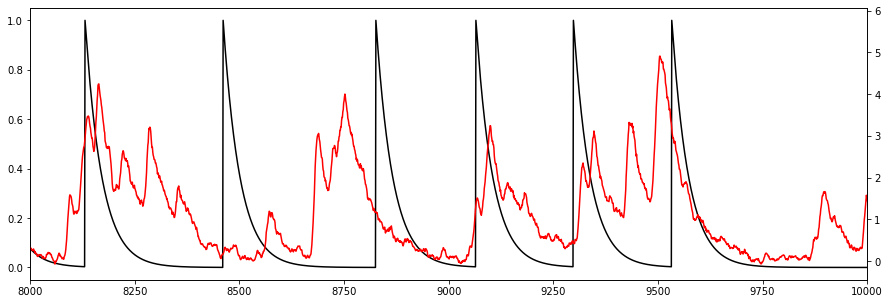

/tmp/ipykernel_13946/681991705.py:84: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  trialwise_sumvals = np.asarray(trialwise_sumvals)


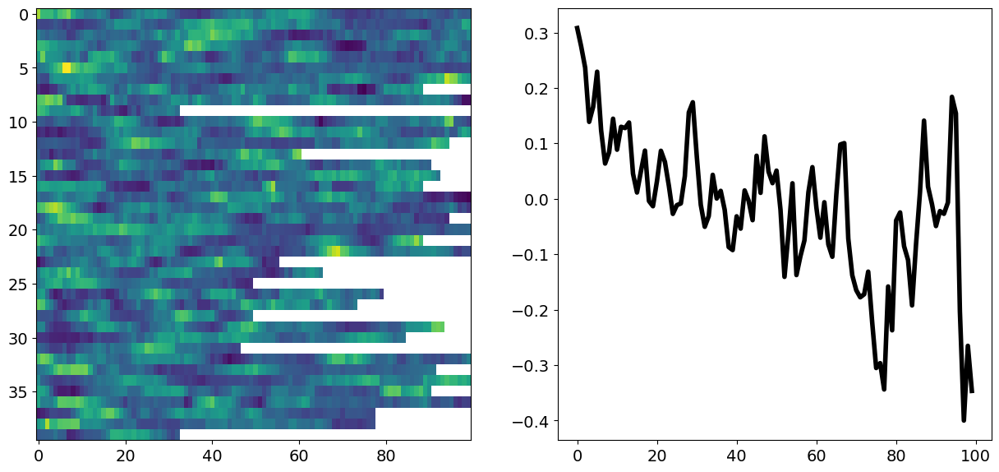

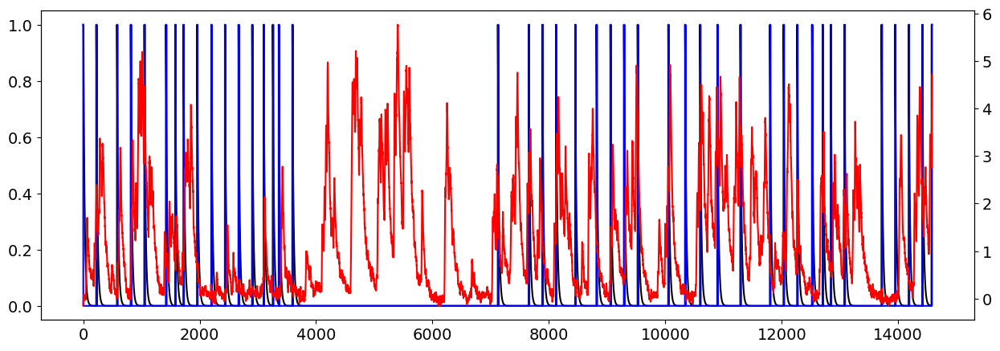

In [285]:
# DEAD END!!?
# Does CN activity become more aligned to trial start??
# to test this, try correlating Trial starts with the CN activity
session_i = 11
convolve_tau = 1
inverse_weight = False
trial_window=10
baseline_rs = []
peak_rs = []
trialwise_rs = []
trialwise_sumvals = []
plotit = False
max_starting_hit_rate = .85
trial_start_roll = -10
for session_i in np.arange(len(multi_session_dict['session'])):
    if np.nanmean(multi_session_dict['hits'][session_i][:10])>max_starting_hit_rate:
        continue
    cn = multi_session_dict['cn'][session_i][0]-1
    cn_dff = rollingfun(multi_session_dict['dFF_closed_loop'][session_i][cn,:],10)
    # cn_dff = np.concatenate([[0],np.diff(cn_dff)])
    # cn_dff[cn_dff<0] = 0
    trialstart = multi_session_dict['trial_start'][session_i]

    amplitude = 1
    calcium_transient_t = np.arange(0,50,.05)# ms 
    #rise = 1- np.exp(calcium_transient_t/tau_rise*-1)
    decay = np.exp(calcium_transient_t/-convolve_tau)
    # decay = decay*0
    # decay[:int(convolve_tau*20)]=1
    calcium_transient = decay #rise*decay
    calcium_transient = amplitude*calcium_transient/np.max(calcium_transient)
    calcium_transient = np.concatenate([np.zeros_like(calcium_transient),calcium_transient])

    trialstart_convolved = np.convolve(np.concatenate([trialstart,trialstart[::-1],trialstart,trialstart[::-1],trialstart]),calcium_transient,'same')
    trialstart_convolved = trialstart_convolved[len(cn_dff)*2:len(cn_dff)*2+len(cn_dff)]
    trialstart_convolved[trialstart_convolved>1] = 1
    trialstart_convolved = np.roll(trialstart_convolved,trial_start_roll)
    if inverse_weight:
        trialstart_convolved = np.abs(1-trialstart_convolved)

    trialstart_indices = np.where(trialstart==1)[0]
    r_baseline = scipy.stats.pearsonr(trialstart_convolved[:trialstart_indices[11]],cn_dff[:trialstart_indices[11]])
    r_steadystate = scipy.stats.pearsonr(trialstart_convolved[trialstart_indices[20]:trialstart_indices[38]],cn_dff[trialstart_indices[20]:trialstart_indices[38]])

    r = scipy.stats.pearsonr(trialstart_convolved,cn_dff)
    baseline_rs.append(r_baseline)
    peak_rs.append(r_steadystate)
    trialwise_r = []
    trialwise_sumval = []
    for ti in np.arange(len(trialstart_indices)-trial_window):
        ts = np.concatenate([trialstart_indices,[len(cn_dff)-1]])[ti]   
        te = np.concatenate([trialstart_indices,[len(cn_dff)-1]])[ti+trial_window]
        trialwise_r.append(scipy.stats.pearsonr(trialstart_convolved[ts:te],cn_dff[ts:te]))
        trialwise_sumval.append(np.dot(trialstart_convolved[ts:te],cn_dff[ts:te])/(te-ts))
    trialwise_r = np.asarray(trialwise_r)
    trialwise_rs.append(trialwise_r)
    trialwise_sumvals.append(trialwise_sumval)
    if plotit:
        fig = plt.figure(figsize = [15,10])
        ax = fig.add_subplot(4,1,1)
        ax.plot(cn_dff)
        ax2 = ax.twinx()
        ax2.plot(trialstart_convolved,'r-')
        ax2.plot(trialstart,'b-')
        plt.xlim([trialstart_indices[0],trialstart_indices[11]])
        ax = fig.add_subplot(4,1,2)
        ax.plot(cn_dff)
        ax2 = ax.twinx()
        ax2.plot(trialstart_convolved,'r-')
        ax2.plot(trialstart,'b-')
        plt.xlim([trialstart_indices[20],trialstart_indices[38]])
        ax2.set_title('PearsonR: {:.3f}, p: {:.3f}'.format(*r))
        
        print(r_baseline)
        print(r_steadystate)
        ax3 = fig.add_subplot(4,1,3)
        ax3.plot(trialwise_r[:,0])
        ax3 = fig.add_subplot(4,1,4)
        ax3.plot(trialwise_sumval)
        if session_i==10:
            asd
baseline_rs = np.asarray(baseline_rs)
peak_rs = np.asarray(peak_rs)
trialwise_sumvals = np.asarray(trialwise_sumvals)
##
trialnum = 100
rnows = []
sumvalnows= []
for rnow,sumvalnow_ in zip(trialwise_rs,trialwise_sumvals):
    #plt.plot(rnow[:,0]-np.nanmean(rnow[:3,0],0),alpha = .5)
    rnow_ = np.ones(trialnum)*np.nan
    lenrnow = min([len(rnow),trialnum])
    rnow_[:lenrnow] =rnow[:lenrnow,0]
    rnow_ = rnow_-np.nanmean(rnow_)
    rnow_ = rnow_/np.nanstd(rnow_)
    rnows.append(rnow_)
    
    sumvalnow = np.ones(trialnum)*np.nan
    sumvalnow[:lenrnow] =sumvalnow_[:lenrnow]
    sumvalnows.append(sumvalnow)#-sumvalnow[0])
    #plt.plot(sumvalnow-sumvalnow[0],alpha = .5)
rnows = np.asarray(rnows)
sumvalnows = np.asarray(sumvalnows)
fig = plt.figure(figsize = [15,15])
ax_im = fig.add_subplot(2,2,1)
ax_im.imshow(rnows,aspect='auto',interpolation = 'none')
ax1 = fig.add_subplot(2,2,2)
ax1.plot(np.nanmean(rnows,0),'k-',linewidth=4)


fig = plt.figure(figsize = [15,5])
ax = fig.add_subplot(1,1,1)
plt.plot(trialstart_convolved,'k-')
plt.plot(trialstart,'b-')

ax2  =ax.twinx()
plt.plot(cn_dff,'r-')
#plt.xlim([8000,10000])
#plt.xlim([0,1000])

/tmp/ipykernel_13946/2127784963.py:65: RuntimeWarning: Mean of empty slice
  mean_trace_diff = np.nanmean(steady_traces,1)-np.nanmean(baseline_traces,1)


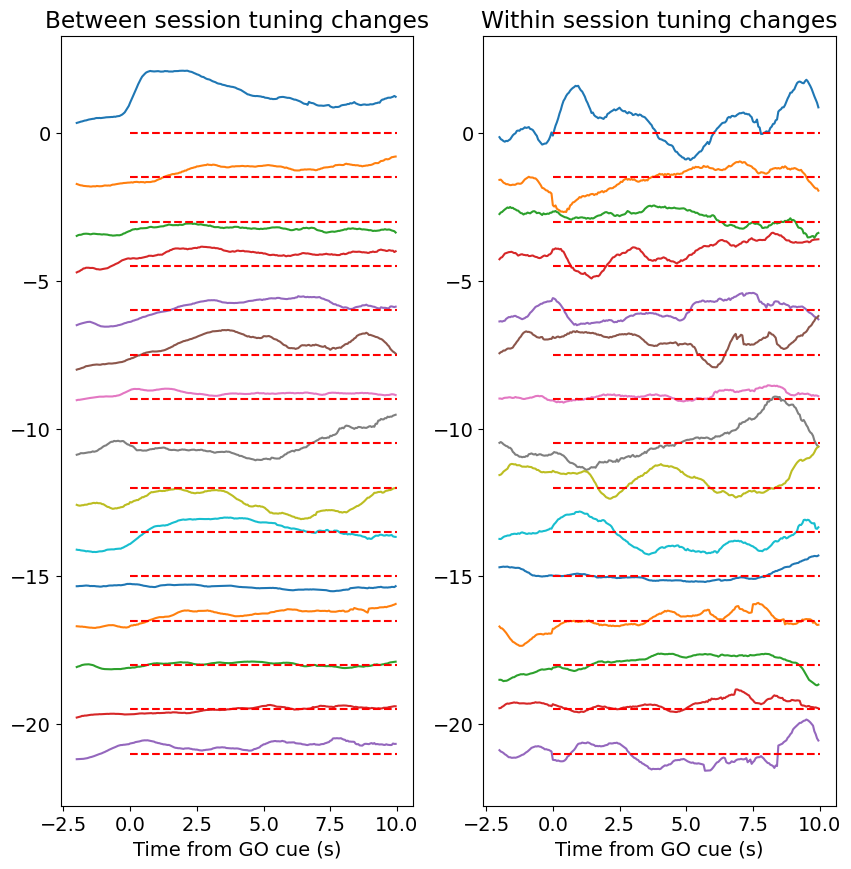

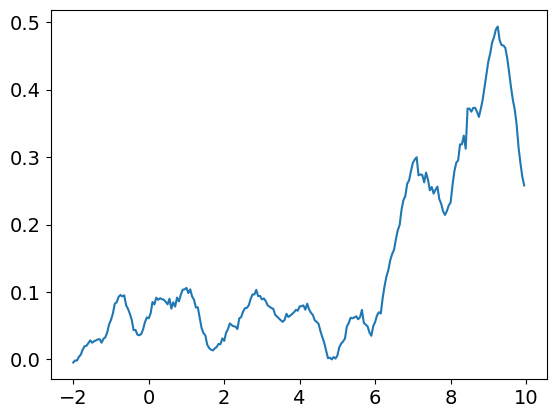

In [387]:
# DEAD END!!?
# Does CN activity become more aligned to trial start??
# to test this, try correlating Trial starts with the CN activity
fig = plt.figure(figsize = [10,10])
ax_within = fig.add_subplot(1,2,2)

ax_within.set_title('Within session tuning changes')
ax_within.set_xlabel('Time from GO cue (s)')
ax_between = fig.add_subplot(1,2,1,sharey = ax_within)
ax_between.set_title('Between session tuning changes')
ax_between.set_xlabel('Time from GO cue (s)')

ctrl_indices = np.arange(0,10)
steady_indices = np.arange(20,40)
all_indices = np.arange(0,160)
step_back = 40
step_forward = 200
timescale = np.arange(-step_back,step_forward)/20
offset = 0
max_starting_hit_rate = .9
mean_diff_traces = []
previous_mean = np.zeros(step_back+step_forward)*np.nan
prev_mouse = ''
prev_cellnum = 0
for session_i in np.arange(len(multi_session_dict['session']))[:30]:
    current_mouse = multi_session_dict['mouse'][session_i]
    current_cellnum = len( multi_session_dict['tuning'][session_i])
    # if np.nanmean(multi_session_dict['hits'][session_i][:10])>max_starting_hit_rate:
    #     continue
    cn = multi_session_dict['cn'][session_i][0]-1
    cn_dff = rollingfun(multi_session_dict['dFF_closed_loop'][session_i][cn,:],10)
    
    trialstart = multi_session_dict['trial_start'][session_i]

    
    trialstart_indices = np.where(trialstart==1)[0]
    baseline_traces = np.ones([step_forward+step_back,len(ctrl_indices)])*np.nan
    steady_traces = np.ones([step_forward+step_back,len(steady_indices)])*np.nan
    
    for ti in np.arange(len(ctrl_indices)):
        ts_now = trialstart_indices[ctrl_indices[ti]]
        try:
            ts_next = trialstart_indices[ctrl_indices[ti]+1]
        except:
            ts_next = len(cn_dff)
        ts =  ts_now- step_back
        te = ts_now+ step_forward
        start_offset = np.max([0,-1*ts])
        end_offset = np.max([0,te-ts_next])
        baseline_traces[start_offset:step_forward+step_back-end_offset,ti] = cn_dff[ts+start_offset:te-end_offset]
    for ti in np.arange(len(steady_indices)):
        try:
            ts_now = trialstart_indices[steady_indices[ti]]
        except:
            break
        try:
            ts_next = trialstart_indices[steady_indices[ti]+1]
        except:
            ts_next = len(cn_dff)
        ts =  ts_now- step_back
        te = ts_now+ step_forward
        start_offset = np.max([0,-1*ts])
        end_offset = np.max([0,te-ts_next])
        steady_traces[start_offset:step_forward+step_back-end_offset,ti] = cn_dff[ts+start_offset:te-end_offset]
    mean_trace_diff = np.nanmean(steady_traces,1)-np.nanmean(baseline_traces,1)
    
    if current_mouse == prev_mouse and current_cellnum == prev_cellnum:
        
        
        cn_dff_prev = rollingfun(multi_session_dict['dFF_closed_loop'][session_i-1][cn,:],10)

        trialstart_prev = multi_session_dict['trial_start'][session_i-1]


        trialstart_indices_prev = np.where(trialstart_prev==1)[0]
        
        all_traces = np.ones([step_forward+step_back,len(all_indices)])*np.nan
        all_traces_prev = np.ones([step_forward+step_back,len(all_indices)])*np.nan
        
        for ti in np.arange(len(all_indices)):
            try:
                ts_now = trialstart_indices[all_indices[ti]]
            except:
                break
            try:
                ts_next = trialstart_indices[all_indices[ti]+1]
            except:
                ts_next = len(cn_dff)
            ts =  ts_now- step_back
            te = ts_now+ step_forward
            start_offset = np.max([0,-1*ts])
            end_offset = np.max([0,te-ts_next])
            all_traces[start_offset:step_forward+step_back-end_offset,ti] = cn_dff[ts+start_offset:te-end_offset]
        current_mean = np.nanmean(all_traces,1)
        
        for ti in np.arange(len(all_indices)):
            try:
                ts_now = trialstart_indices_prev[all_indices[ti]]
            except:
                break
            try:
                ts_next = trialstart_indices_prev[all_indices[ti]+1]
            except:
                ts_next = len(cn_dff_prev)
            ts =  ts_now- step_back
            te = ts_now+ step_forward
            start_offset = np.max([0,-1*ts])
            end_offset = np.max([0,te-ts_next])
            all_traces_prev[start_offset:step_forward+step_back-end_offset,ti] = cn_dff_prev[ts+start_offset:te-end_offset]
        previous_mean = np.nanmean(all_traces_prev,1)
        
        if np.nanmean(multi_session_dict['hits'][session_i][:10])<=max_starting_hit_rate:
            
            ax_between.plot(timescale,current_mean-previous_mean-offset)
            ax_between.plot([0,step_forward/20],[-offset,-offset],'r--')
        # else:
        #     ax_between.plot(0,0)


            ax_within.plot(timescale,mean_trace_diff-offset)
            ax_within.plot([0,step_forward/20],[-offset,-offset],'r--')




            offset+=1.5#np.nanmax(mean_trace_diff)
            mean_diff_traces.append(mean_trace_diff)
    prev_mouse = current_mouse
    prev_cellnum = current_cellnum
    
mean_diff_traces = np.asarray(mean_diff_traces)
fig = plt.figure()
plt.plot(timescale,np.nanmean(mean_diff_traces,0))

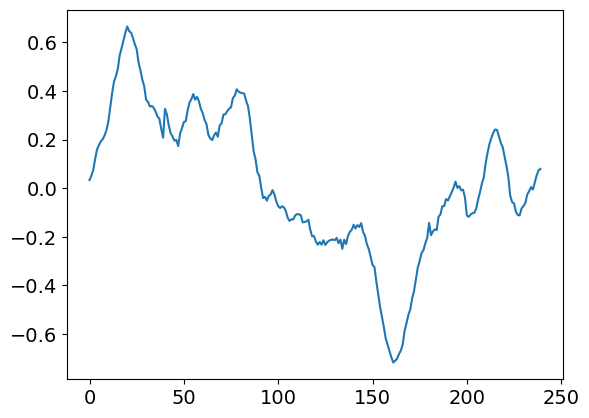

In [321]:
plt.plot(mean_trace_diff)

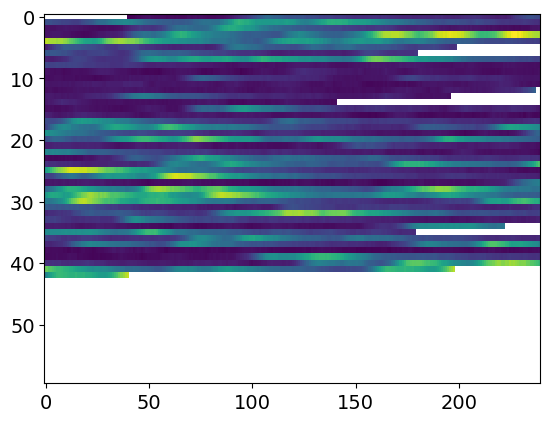

In [340]:
plt.imshow(all_traces.T,aspect = 'auto',interpolation = 'none')

In [ ]:
import warnings
warnings.simplefilter('ignore', np.RankWarning)
# recover threshold of CN
trial_start_offset = 0 # to account for lickport step home (500ms)

#session_i = 0
def bin_values(x,y,nbins):
    '''
    bin both x and y along x in nbins/2 bins
    '''
    nbins = int(nbins/2)
    indices__ = np.asarray(np.arange(0,1+(1/nbins+1)/2,1/(nbins+1))*(len(x)-1),int)
    indices__ = indices__[:nbins+1]
    bin_edges = np.sort(dff_now)[indices__]
    starts = bin_edges[:-1]
    ends = bin_edges[1:]
    x_mean = []
    x_std = []
    y_mean = []
    y_std = []
    for s,e in zip(starts,ends):
        needed = (x>=s) & (x<=e) & (y>0)
        x_mean.append(np.nanmean(x[needed]))
        x_std.append(np.nanstd(x[needed]))
        y_mean.append(np.nanmean(y[needed]))
        y_std.append(np.nanstd(y[needed]))
    x_mean = np.asarray(x_mean)
    x_std = np.asarray(x_std)
    y_mean = np.asarray(y_mean)
    y_std = np.asarray(y_std)
    return x_mean,x_std,y_mean,y_std 

def plot_session_difficulty(multi_session_dict,session_i):
    moving_average_window_lickport_speed = 1
    moving_average_F = 5
    max_trial_len_frames = 200
    extra_time_after_reward = 0 # how many frames are added to make sure the transient that made the CN get the reward is included - NEW STUFF!!
    numsegments = 4 # divide session into this amount of pieces and measure lickport delay in all
    reward_port_delay_window = 10 #estimate reward port delay in this many moving window for all trials
    min_pearsonR = .5 # for trialwise correlation of lickport speed and dF/F (or F) lower than this will not be analysed
    
    cn  = multi_session_dict['cn'][session_i][0] - 1
    dff_cn = rollingfun(multi_session_dict['dFF_closed_loop'][session_i][cn,:].flatten(),moving_average_F)
    f0_cn = multi_session_dict['F0_closed_loop'][session_i][cn,:].flatten()
    #vel = rollingfun(multi_session_dict['vel'][session_i],moving_average_window_lickport_speed)
    vel =  rollingfun(multi_session_dict['vel_real'][session_i],moving_average_window_lickport_speed)
    trial_starts = multi_session_dict['trial_start_indices'][session_i] - trial_start_offset ####################################
    rewards = multi_session_dict['reward_indices'][session_i] +extra_time_after_reward
    F_cn = dff_cn*f0_cn + f0_cn
    indices_to_use = []

    for ts in trial_starts:
        if any((rewards>ts)&(rewards<ts+max_trial_len_frames)):
            max_idx = rewards[(rewards>ts)&(rewards<ts+max_trial_len_frames)][0]
        else:
            max_idx = ts+max_trial_len_frames
        if max_idx>=len(F_cn):
            max_idx = len(F_cn)-1
        indices_to_use.append(np.arange(ts,max_idx))
    indices_to_use_list = indices_to_use.copy()
    indices_to_use = np.concatenate(indices_to_use)

    
    offset_vals = np.asarray(np.arange(-1,60,1),int)
    
    # first perform offset measurements in  segments in time (4 segments)
    trialnum_ = len(indices_to_use_list)
    tdiff = int(trialnum_/(numsegments))
    r_vals_all = []
    starts_all = []
    ends_all = []
    for start_t, end_t in zip(np.asarray(np.arange(0,trialnum_-tdiff/2,tdiff),int),np.asarray(np.arange(tdiff,trialnum_+tdiff/2,tdiff),int)):
        #print([trialnum_,start_t,end_t])
        starts_all.append(start_t)
        ends_all.append(end_t)
        r_vals = []
        for offset_now in offset_vals:
            x = []
            y = []
            for indices_now in np.asarray(indices_to_use_list)[start_t:end_t]:
                x.append(F_cn[indices_now])
                x.append(np.ones(100)*np.nan)
                y.append(vel[indices_now])
                y.append(np.ones(100)*np.nan)
            # x = F_cn[indices_to_use]
            # y = vel[indices_to_use]
            x = np.concatenate(x)
            y = np.concatenate(y)
            x = np.roll(x,offset_now)

            nan_indices = np.isnan(x) |np.isnan(y) | (y==0)

            r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
            r_vals.append(r[0])
        r_vals_all.append(r_vals)
    
    # perform offset measurement in a movig window so each trial can have a value
    r_vals_movingwindow = []
    for trial_i in np.arange(len(indices_to_use_list)):
        start_t = int(np.max([0,trial_i-reward_port_delay_window/2]))
        end_t = int(np.min([len(indices_to_use_list),trial_i+reward_port_delay_window/2]))
        
        
        r_vals = []
        for offset_now in offset_vals:
            x = []
            y = []
            for indices_now in np.asarray(indices_to_use_list)[start_t:end_t]:
                x.append(F_cn[indices_now])
                x.append(np.ones(100)*np.nan)
                y.append(vel[indices_now])
                y.append(np.ones(100)*np.nan)
            # x = F_cn[indices_to_use]
            # y = vel[indices_to_use]
            x = np.concatenate(x)
            y = np.concatenate(y)
            x = np.roll(x,offset_now)

            nan_indices = np.isnan(x) |np.isnan(y) | (y==0)
            try:
                r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
                r_vals.append(r[0])
            except:
                r_vals.append(0)
        r_vals_movingwindow.append(r_vals)
    
    
    # measure offset for the session as a whole
    r_vals = []
    for offset_now in offset_vals:
        x = []
        y = []
        for indices_now in indices_to_use_list:
            x.append(F_cn[indices_now])
            x.append(np.ones(100)*np.nan)
            y.append(vel[indices_now])
            y.append(np.ones(100)*np.nan)
        # x = F_cn[indices_to_use]
        # y = vel[indices_to_use]
        x = np.concatenate(x)
        y = np.concatenate(y)
        x = np.roll(x,offset_now)

        nan_indices = np.isnan(x) |np.isnan(y) | (y==0)

        r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
        r_vals.append(r[0])

    offset = offset_vals[np.argmax(r_vals)] #the whole session value is used in the future analysesd
    rval = np.max(r_vals)
    x = []
    dff = []
    f0 = []
    y = []
    indices = []
    for indices_now in indices_to_use_list:
        indices.append(indices_now)
        indices.append(np.ones(100)*np.nan)
        x.append(F_cn[indices_now])
        x.append(np.ones(100)*np.nan)
        dff.append(dff_cn[indices_now])
        dff.append(np.ones(100)*np.nan)
        f0.append(f0_cn[indices_now])
        f0.append(np.ones(100)*np.nan)
        y.append(vel[indices_now])
        y.append(np.ones(100)*np.nan)
    # x = F_cn[indices_to_use]
    # y = vel[indices_to_use]
    indices = np.concatenate(indices)
    x = np.concatenate(x)
    dff = np.concatenate(dff)
    f0 = np.concatenate(f0)
    y = np.concatenate(y)
    x = np.roll(x,offset)
    dff = np.roll(dff,offset)
    f0 = np.roll(f0,offset)

    

    

    fig = plt.figure(figsize = [15,10])
    ax = fig.add_subplot(2,3,1)
    for r_vals_now,start_t, end_t  in zip(r_vals_all,starts_all,ends_all):
        ax.plot(offset_vals,r_vals_now,'-',linewidth = 2,alpha = .5,label = 'trials {} to {}'.format(start_t,end_t))
    ax.plot(offset_vals,r_vals,'k-',linewidth = 4,label = 'all trials')
    ax.set_xlabel('frame offset')
    ax.set_ylabel('pearson R')
    ax.set_title('offset:{} frames'.format(offset))
    ax.legend()
    
    
    
    nbins = 50
    indices__ = np.asarray(np.arange(0,1+(1/nbins+1)/2,1/(nbins+1))*(len(x)-1),int)
    indices__ = indices__[:nbins+1]
    bin_edges = np.sort(x)[indices__]
    starts = bin_edges[:-1]
    ends = bin_edges[1:]
    x_mean = []
    x_std = []
    y_mean = []
    y_std = []
    for s,e in zip(starts,ends):
        needed = (x>=s) & (x<=e) & (y>0) #&(y>0)
        x_mean.append(np.nanmean(x[needed]))
        x_std.append(np.nanstd(x[needed]))
        y_mean.append(np.nanmean(y[needed]))
        y_std.append(np.nanstd(y[needed]))
        
    x_mean = np.asarray(x_mean)
    x_std = np.asarray(x_std)
    y_mean = np.asarray(y_mean)
    y_std = np.asarray(y_std)
    
    
    ax = fig.add_subplot(2,3,3)
    ax.errorbar(x_mean,y_mean,y_std,x_std,color = 'black')
    ax.set_xlabel('F')
    ax.set_ylabel('lickport speed')
    
    edge_speed_vals = [np.nanmin(y_mean)+.1*(np.nanmax(y_mean)-np.nanmin(y_mean)),np.nanmax(y_mean)-.1*(np.nanmax(y_mean)-np.nanmin(y_mean))]
    #edge_F_vals = [x_mean[np.argmax(y_mean>=edge_speed_vals[0])],x_mean[::-1][np.argmax(y_mean[::-1]<=edge_speed_vals[1])]]
    
    edge_F_idx_min = np.nanargmin(y_mean)
    while  y_mean[edge_F_idx_min]<=edge_speed_vals[0] and edge_F_idx_min<len(y_mean):
        edge_F_idx_min+=1
    edge_F_idx_max = np.nanargmax(y_mean)
    while  y_mean[edge_F_idx_max]<=edge_speed_vals[1] and edge_F_idx_max>0:
        edge_F_idx_max-=1
    #edge_dff_vals = [x_mean[::-1][np.argmax(y_mean[::-1]<=edge_speed_vals[0])],x_mean[np.argmax(y_mean>=edge_speed_vals[1])]]
    edge_F_vals  = [x_mean[edge_F_idx_min],x_mean[edge_F_idx_max]]
    
    
    yvals_plot = ax.get_ylim()
    ax.vlines(edge_F_vals,yvals_plot[0],yvals_plot[1],color= 'red')
    needed_binned_indices = (x_mean>=edge_F_vals[0]) &(x_mean<=edge_F_vals[1])
    if sum(needed_binned_indices)<3:
        needed_binned_indices = ((np.isnan(y_mean) | np.isnan(x_mean))==False) 
        
    p_f_inv_binned = np.polyfit(y_mean[needed_binned_indices],x_mean[needed_binned_indices],1)
    thresholds_f_binned = np.polyval(p_f_inv_binned,[0,1])
    ax.plot(np.polyval(p_f_inv_binned,[0,1]),[0,1],'r--',label = 'low th: {:.3f}, high th: {:.3f}'.format(*thresholds_f_binned))
    ax.legend()
    
    
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    needed_indices = (nan_indices==False) &(y>0) #&(y<1)#(x>=edge_F_vals[0]) &(x<=edge_F_vals[1])
    p_f = np.polyfit(x[needed_indices],y[needed_indices],1)
    p_f_inv = np.polyfit(y[needed_indices],x[needed_indices],1)
    ax = fig.add_subplot(2,3,2)
    ax.plot(x,y,'k.',alpha = .5)
    ax.plot(x[needed_indices],y[needed_indices],'r.',alpha = .5)
    
    
    thresholds_f_inv = np.polyval(p_f_inv,[0,1])
    xrange = [np.nanmin(x),np.nanmax(x)]
    ax.plot(np.polyval(p_f_inv,[0,1]),[0,1],'b--',label = 'low th: {:.3f}, high th: {:.3f}'.format(*thresholds_f_inv))
    
    
    
    
    xvals__ = np.arange(-50,np.nanmax(x)*2,1)
    yvals__ = np.polyval(p_f,xvals__)
    thresholds_f = [xvals__[np.argmin(np.abs(yvals__-0))],xvals__[np.argmin(np.abs(yvals__-1))]]
    ax.plot(xrange,np.polyval(p_f,xrange),'r--',label = 'low th: {:.3f}, high th: {:.3f}'.format(*thresholds_f))
    ax.legend()
    ax.set_xlabel('F')
    ax.set_ylabel('lickport speed')

    
    
    
    ax = fig.add_subplot(2,3,5)
    ax.plot(dff,y,'k.',alpha = .5)
    
    ax.plot(dff[needed_indices],y[needed_indices],'r.',alpha = .5)
    p_dff = np.polyfit(dff[needed_indices],y[needed_indices],1)
    p_dff_inv = np.polyfit(y[needed_indices],dff[needed_indices],1)
    
    
    thresholds_dff_inv = np.polyval(p_dff_inv,[0,1])
    ax.plot(np.polyval(p_dff_inv,[0,1]),[0,1],'b--',label = 'low th: {:.3f}, high th: {:.3f}'.format(*thresholds_dff_inv))
    
    
    xrange = [np.nanmin(dff),np.nanmax(dff)]
    xvals__ = np.arange(-1,20,.01)
    yvals__ = np.polyval(p_dff,xvals__)
    thresholds_dff = [xvals__[np.argmin(np.abs(yvals__-0))],xvals__[np.argmin(np.abs(yvals__-1))]]
    r_dff = scipy.stats.pearsonr(dff[needed_indices],y[needed_indices])
    ax.plot(xrange,np.polyval(p_dff,xrange),'r--',label = 'low th: {:.3f}, high th: {:.3f}\nPearsonR: {:.3f}, p={:.3f}'.format(*np.concatenate([thresholds_dff,r_dff])))
    
    
    
    
    
    ax.set_xlabel('dF/f')
    ax.set_ylabel('lickport speed')
    ax.legend()
    
    indices__ = np.asarray(np.arange(0,1+(1/nbins+1)/2,1/(nbins+1))*(len(dff)-1),int)
    indices__ = indices__[:nbins+1]
    bin_edges = np.sort(dff)[indices__]
    starts = bin_edges[:-1]
    ends = bin_edges[1:]
    x_mean = []
    x_std = []
    y_mean = []
    y_std = []
    for s,e in zip(starts,ends):
        needed = (dff>=s) & (dff<=e) & (y>0)
        x_mean.append(np.nanmean(dff[needed]))
        x_std.append(np.nanstd(dff[needed]))
        y_mean.append(np.nanmean(y[needed]))
        y_std.append(np.nanstd(y[needed]))
    x_mean = np.asarray(x_mean)
    x_std = np.asarray(x_std)
    y_mean = np.asarray(y_mean)
    y_std = np.asarray(y_std)
    ax = fig.add_subplot(2,3,6)
    ax.errorbar(x_mean,y_mean,y_std,x_std,color = 'black')
    ax.set_xlabel('dF/F')
    ax.set_ylabel('lickport speed')
    
    edge_speed_vals = [np.nanmin(y_mean)+.1*(np.nanmax(y_mean)-np.nanmin(y_mean)),np.nanmax(y_mean)-.1*(np.nanmax(y_mean)-np.nanmin(y_mean))]
    #edge_dff_vals = [x_mean[np.argmax(y_mean>=edge_speed_vals[0])],x_mean[::-1][np.argmax(y_mean[::-1]<=edge_speed_vals[1])]]
    edge_dff_idx_min = np.nanargmin(y_mean)
    while  (x_mean[edge_dff_idx_min]<1 or y_mean[edge_dff_idx_min]<=edge_speed_vals[0]) and edge_dff_idx_min<len(y_mean):
        edge_dff_idx_min+=1
    edge_dff_idx_max = np.nanargmax(y_mean)
    while  y_mean[edge_dff_idx_max]<=edge_speed_vals[1] and edge_dff_idx_max>0:
        edge_dff_idx_max-=1
    #edge_dff_vals = [x_mean[::-1][np.argmax(y_mean[::-1]<=edge_speed_vals[0])],x_mean[np.argmax(y_mean>=edge_speed_vals[1])]]
    edge_dff_vals  = [x_mean[edge_dff_idx_min+1],x_mean[edge_dff_idx_max-1]]
    yvals_plot = ax.get_ylim()
    ax.vlines(edge_dff_vals,yvals_plot[0],yvals_plot[1],color= 'red')
    needed_binned_indices = (x_mean>edge_dff_vals[0]) &(x_mean<edge_dff_vals[1])
    if sum(needed_binned_indices)<3:
        needed_binned_indices = (np.isnan(y_mean) | np.isnan(x_mean))==False
    
    p_dff_inv_binned = np.polyfit(y_mean[needed_binned_indices],x_mean[needed_binned_indices],1)
    thresholds_dff_binned_inv = np.polyval(p_dff_inv_binned,[0,1])
    ax.plot(np.polyval(p_dff_inv_binned,[0,1]),[0,1],'b--',label = 'low th: {:.3f}, high th: {:.3f}'.format(*thresholds_dff_binned_inv))
    
    
    p_dff_binned = np.polyfit(x_mean[needed_binned_indices],y_mean[needed_binned_indices],1)
    
    r_dff_binned = scipy.stats.pearsonr(dff[needed_indices],y[needed_indices])
    
    xvals__ = np.arange(-1,20,.01)
    yvals__ = np.polyval(p_dff_binned,xvals__)
    thresholds_dff_binned = [xvals__[np.argmin(np.abs(yvals__-0))],xvals__[np.argmin(np.abs(yvals__-1))]]
    xrange = [np.nanmin(x_mean[needed_binned_indices]),np.nanmax(x_mean[needed_binned_indices])]
    ax.plot(xrange,np.polyval(p_dff_binned,xrange),'r--',label = 'low th: {:.3f}, high th: {:.3f}\nPearsonR: {:.3f}, p={:.3f}'.format(*np.concatenate([thresholds_dff_binned,r_dff_binned])))
    ax.legend()
    
    
    
    
    
    

    ax = fig.add_subplot(2,3,4)
    ax.plot(F_cn,dff_cn,'k.',alpha = .5)
    ax.set_xlabel('F')
    ax.set_ylabel('dF/F')
    
    #asdsa
    th_list_F  =[]
    th_list_dff = []
    pearson_r_list_F = []
    pearson_r_list_dff = []
    integrated_F = []
    integrated_dff = []
    integrated_f0 = []
    
    integrated_F_above_threshold = []
    integrated_dff_above_threshold = []
    integrated_f0_above_threshold = []
    
    std_F = []
    std_dff = []
    trial_len = []
    for trial_start_idx_now in trial_starts:

        i_now = np.argmax(trial_start_idx_now==indices)
        next_nan = np.argmax(np.isnan(y[i_now:]))+offset
        y_now = y[i_now:i_now+next_nan]
        x_now = x[i_now:i_now+next_nan]
        dff_now = dff[i_now:i_now+next_nan]
        f0_now = f0[i_now:i_now+next_nan]
        
        #### binning
         
    
        #### binnning
        
        
        

        nan_indices = np.isnan(x_now) |np.isnan(y_now) |(y_now==0)
        if sum(nan_indices==False)<5 or np.nanmax(y_now[nan_indices == False])==0:
            th_list_F.append([np.nan,np.nan])
            th_list_dff.append([np.nan,np.nan])
            pearson_r_list_F.append([np.nan,np.nan])
            pearson_r_list_dff.append([np.nan,np.nan])
            integrated_F.append(np.nan)
            integrated_dff.append(np.nan)
            integrated_f0.append(np.nan)
            integrated_F_above_threshold.append(np.nan)
            integrated_dff_above_threshold.append(np.nan)
            integrated_f0_above_threshold.append(np.nan)
            std_F.append(np.nan)
            std_dff.append(np.nan)
            trial_len.append(len(dff_now))
            
            continue
        # x_mean,x_std,y_mean,y_std = bin_values(x_now[nan_indices == False],y_now[nan_indices == False],10)
        # print([x_mean,y_mean])
        
        p_f = np.polyfit(x_now[nan_indices == False],y_now[nan_indices == False],1)
        r_f = scipy.stats.pearsonr(x_now[nan_indices == False],y_now[nan_indices == False])
        p_f_inv = np.polyfit(y_now[nan_indices == False],x_now[nan_indices == False],1)
        r_f_inv = scipy.stats.pearsonr(y_now[nan_indices == False],x_now[nan_indices == False])
        p_dff = np.polyfit(dff_now[nan_indices == False],y_now[nan_indices == False],1)
        r_dff = scipy.stats.pearsonr(dff_now[nan_indices == False],y_now[nan_indices == False])
        p_dff_inv = np.polyfit(y_now[nan_indices == False],dff_now[nan_indices == False],1)
        r_dff_inv = scipy.stats.pearsonr(y_now[nan_indices == False],dff_now[nan_indices == False])
        
        xvals__ = np.arange(-1,20,.01)
        yvals__ = np.polyval(p_dff,xvals__)
        thresholds_dff_ = [xvals__[np.argmin(np.abs(yvals__-0))],xvals__[np.argmin(np.abs(yvals__-1))]]
        
        xvals__ = np.arange(-50,1000,1)
        yvals__ = np.polyval(p_f,xvals__)
        thresholds_f_ = [xvals__[np.argmin(np.abs(yvals__-0))],xvals__[np.argmin(np.abs(yvals__-1))]]
        
        th_list_F.append(thresholds_f_)
        th_list_dff.append(thresholds_dff_)
        
#         th_list_F.append(np.polyval(p_f_inv,[0,1]))
#         th_list_dff.append(np.polyval(p_dff_inv,[0,1]))
        
        pearson_r_list_F.append(r_f)
        pearson_r_list_dff.append(r_dff)
        integrated_F.append(np.nansum(x_now))
        integrated_dff.append(np.nansum(dff_now))
        integrated_f0.append(np.nansum(f0_now))
        integrated_F_above_threshold.append(np.nansum(x_now[x_now>thresholds_f[0]]))
        integrated_dff_above_threshold.append(np.nansum(dff_now[dff_now>thresholds_dff[0]]))
        integrated_f0_above_threshold.append(np.nansum(f0_now[f0_now>thresholds_f[0]]))

        std_F.append(np.nanstd(x_now))
        std_dff.append(np.nanstd(dff_now))
        trial_len.append(len(dff_now))
    
    fig = plt.figure(figsize = [15,5])
    ax_delay_over_trials = fig.add_subplot(1,1,1)
    try:
        delays_per_trial = np.nanargmax(np.asarray(r_vals_movingwindow),1)/20
        delay_Rs_per_trial = np.nanmax(np.asarray(r_vals_movingwindow),1)
    except:
        delays_per_trial = np.ones(np.asarray(r_vals_movingwindow).shape[0])*np.nan
        delay_Rs_per_trial = np.ones(np.asarray(r_vals_movingwindow).shape[0])*np.nan
    ax_delay_over_trials.plot(delays_per_trial,'k-')
    ax_delay_over_trials.set_xlabel('trial#')
    ax_delay_over_trials.set_ylabel('CN to lickport speed delay (s)')
    ax_delay_over_trials.set_title('{} trial moving window'.format(reward_port_delay_window))
    
    
    fig = plt.figure(figsize = [15,10])
    for lickport_plot_i in [1,2]:
        ax = fig.add_subplot(2,1,lickport_plot_i)
        window_steps = 800
        center_idx = np.argmax(rollingfun(multi_session_dict['vel_real'][session_i],window_steps)[window_steps:-window_steps])+window_steps
        indices = np.arange(window_steps)-int(window_steps/2)+center_idx
        indices = indices[(indices>=offset) & (indices<len(multi_session_dict['vel_real'][session_i]))]
        if lickport_plot_i==1:
            ax.plot(np.arange(len(indices))/20,multi_session_dict['dFF_closed_loop'][session_i][cn,:].flatten()[indices-offset],'k-',label = 'CN')
        else:
            ax.plot(np.arange(len(indices))/20,multi_session_dict['dFF_closed_loop'][session_i][cn,:].flatten()[indices],'k-',label = 'CN')

        go_cue_i = multi_session_dict['trial_start'][session_i][indices]==1
        rew_i = multi_session_dict['rew'][session_i][indices]==1

        ax2=ax.twinx()
        vel_trace = multi_session_dict['vel_real'][session_i][indices]
        vel_trace[vel_trace==0]=np.nan
        vel_trace = rollingfun(vel_trace,10)
        vel_trace[np.isnan(vel_trace)] = 0
        plt.plot(np.arange(len(indices))/20,vel_trace,'c-',label = 'lickport speed')
        ax.set_xlabel('time(s)')
        ax.set_ylabel('dF/F')
        if lickport_plot_i==1:
            ax.set_title('{} frame offset applied to dF/F'.format(offset))
        else:
            ax.set_title('no offset')


        ylim_ax = ax.get_ylim()
        ax.vlines((np.arange(len(indices))/20)[go_cue_i],ylim_ax[0],ylim_ax[1],color='green',linewidth = 8)
        ax.vlines((np.arange(len(indices))/20)[rew_i],ylim_ax[0],ylim_ax[1],color='red',linewidth = 8)
        #ax.plot((np.arange(len(indices))/20)[go_cue_i],np.ones(sum(go_cue_i))-2,'go')
        ax.legend()
        ax2.set_ylabel('lickport speed')
    
    fig = plt.figure(figsize = [10,10])   
    ax1 = fig.add_subplot(2,1,1)
    needed_trials_f=np.asarray(pearson_r_list_F)[:,0]>min_pearsonR
    ax1.plot(np.arange(len(th_list_F))[needed_trials_f],np.asarray(th_list_F)[needed_trials_f],label = ['low threshold','high threshold'])
    ax1.set_xlabel('trial#')
    ax1.set_ylabel('F')
    ax1.legend()
    ax1.set_title('calculated thresholds above PearsonR of {}'.format(min_pearsonR))
    ax11=ax1.twinx()
    ax11.plot(np.asarray(pearson_r_list_F)[:,0],'k--',alpha = .5)
    ax11.set_ylabel('pearson R')
    needed_trials_dff=np.asarray(pearson_r_list_dff)[:,0]>min_pearsonR
    ax2 = fig.add_subplot(2,1,2)
    ax2.plot(np.arange(len(th_list_F))[needed_trials_dff],np.asarray(th_list_dff)[needed_trials_dff],label = ['low threshold','high threshold'])
    ax2.set_xlabel('trial#')
    ax2.set_ylabel('dF/F')
    ax2.legend()
    # ax22=ax2.twinx()
    # ax22.plot(np.asarray(pearson_r_list_dff)[:,0],'k--',alpha = .5)
    # ax22.set_ylabel('pearson R')
    
    output_dict = {'thresholds_f':thresholds_f,
                   'thresholds_dff':thresholds_dff,
                   'thresholds_f_binned':thresholds_f_binned,
                   'thresholds_dff_binned':thresholds_dff_binned,
                   'thresholds_f_trialwise':np.asarray(th_list_F),
                   'thresholds_dff_trialwise':np.asarray(th_list_dff),
                   'pearsonR_thresholds_f_trialwise':np.asarray(pearson_r_list_F),
                   'pearsonR_thresholds_dff_trialwise':np.asarray(pearson_r_list_dff),
                   'lickport_F_offset':offset,
                   'lickport_F_pearsonR':rval,
                   'F_integral_trialwise':np.asarray(integrated_F),
                   'dff_integral_trialwise':np.asarray(integrated_dff),
                   'f0_integral_trialwise':np.asarray(integrated_f0),
                   'F_integral_above_threshold_trialwise':np.asarray(integrated_F_above_threshold),
                   'dff_integral_above_threshold_trialwise':np.asarray(integrated_dff_above_threshold),
                   'f0_integral_above_threshold_trialwise':np.asarray(integrated_f0_above_threshold),
                   'trial_length_trialwise':np.asarray(trial_len),
                   'F_std_trialwise':np.asarray(std_F),
                   'dff_std_trialwise':np.asarray(std_dff),
                   'delay_by_trial':delays_per_trial,
                   'delay_r_by_trial':delay_Rs_per_trial,
                   
                  }
    return output_dict

multi_session_dict['threshold_dict'] = []
for session_i in np.arange(len(multi_session_dict['session'])):
    
    threshold_dict = plot_session_difficulty(multi_session_dict,session_i)
    multi_session_dict['threshold_dict'].append(threshold_dict)
    # if session_i==10:
    #     asd
# fig = plt.figure(figsize = [20,10])
# ax = fig.add_subplot(2,1,1)
# ax.plot(F_cn[indices_to_use])
# ax = fig.add_subplot(2,1,2,sharex = ax)
# ax.plot(vel[indices_to_use])
# ax.set_xlim([500,800])

#plt.close('all')

In [ ]:
time_offset_error = 0.2859 #seconds - this is due to wrong wiring, scanimage is triggered this time later than what is saved.. eh..

min_pearsonR = .25 # for both delay and threshold
trials_to_use = 100
rolling_window = 1
light_session_th_dff = []
light_session_th_F = []
lickport_delay_list = []
dff_ylimits =[-1,10] 
for session_i in np.arange(len(multi_session_dict['threshold_dict'])):
    th_dff_now = np.zeros([trials_to_use,2])*np.nan
    th_f_now = np.zeros([trials_to_use,2])*np.nan
    trialnum_now = np.min([trials_to_use,multi_session_dict['threshold_dict'][session_i]['pearsonR_thresholds_f_trialwise'].shape[0]])
    th_f_now[:trialnum_now,:] = multi_session_dict['threshold_dict'][session_i]['thresholds_f_trialwise'][:trialnum_now,:]
    th_f_now[np.where(multi_session_dict['threshold_dict'][session_i]['pearsonR_thresholds_f_trialwise'][:trialnum_now,0]<min_pearsonR)[0],:] = np.nan
    th_dff_now[:trialnum_now,:] = multi_session_dict['threshold_dict'][session_i]['thresholds_dff_trialwise'][:trialnum_now,:]
    th_dff_now[np.where(multi_session_dict['threshold_dict'][session_i]['pearsonR_thresholds_dff_trialwise'][:trialnum_now,0]<min_pearsonR)[0],:] = np.nan
    light_session_th_dff.append(th_dff_now)
    light_session_th_F.append(th_f_now)
    delay_list_now =  np.zeros(trials_to_use)*np.nan
    delay_list_now[:trialnum_now] = multi_session_dict['threshold_dict'][session_i]['delay_by_trial'][:trialnum_now]
    delay_list_now[np.where(multi_session_dict['threshold_dict'][session_i]['delay_r_by_trial'][:trialnum_now]<min_pearsonR)[0]] = np.nan
    lickport_delay_list.append(delay_list_now-time_offset_error)
light_session_th_dff = np.asarray(light_session_th_dff)
light_session_th_F = np.asarray(light_session_th_F)
lickport_delay_list=np.asarray(lickport_delay_list)
fig = plt.figure(figsize = [15,15])


ax2 = fig.add_subplot(3,2,1)
th_dff_list = []
for t in light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,0].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)    
ax2.plot(np.arange(trials_to_use),th_dff_list,'r-',alpha = .5)
ax2.plot(np.arange(trials_to_use),np.nanmean(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,0],0),'k-',alpha = 1,linewidth = 4)
th_dff_list = []
for t in light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,1].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)    
ax2.plot(np.arange(trials_to_use),th_dff_list,'g-',alpha = .5)
ax2.plot(np.arange(trials_to_use),np.nanmean(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,1],0),'k-',alpha = 1,linewidth = 4)
ax2.set_title('ctrl sessions')
ax2.set_ylabel('threshold (dF/F)')
ax2.set_ylim(dff_ylimits)

ax2 = fig.add_subplot(3,2,2)
ax2.plot(np.arange(trials_to_use),light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0].T,'r-',alpha = .5)
ax2.plot(np.arange(trials_to_use),np.nanmean(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0],0),'k-',alpha = 1,linewidth = 4)
ax2.plot(np.arange(trials_to_use),light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,1].T,'g-',alpha = .5)
ax2.plot(np.arange(trials_to_use),np.nanmean(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,1],0),'k-',alpha = 1,linewidth = 4)
ax2.set_title('ctrl sessions')
ax2.set_ylabel('threshold (F)')
#ax2.set_yscale('log')


ax1 = fig.add_subplot(3,2,3)
th_dff_list = []
for t in light_session_th_dff[multi_session_dict['light_session'],:,0].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)    
ax1.plot(np.arange(trials_to_use),th_dff_list,'r-',alpha = .5)#light_session_th_dff[multi_session_dict['light_session'],:,0].T
ax1.plot(np.arange(trials_to_use),np.nanmean(light_session_th_dff[multi_session_dict['light_session'],:,0],0),'r-',alpha = 1,linewidth = 4)
th_dff_list = []
for t in light_session_th_dff[multi_session_dict['light_session'],:,1].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)   
ax1.plot(np.arange(trials_to_use),th_dff_list,'g-',alpha = .5)#light_session_th_dff[multi_session_dict['light_session'],:,1].T
ax1.plot(np.arange(trials_to_use),np.nanmean(light_session_th_dff[multi_session_dict['light_session'],:,1],0),'g-',alpha = 1,linewidth = 4)
ax1.set_title('light sessions')
ax1.set_ylabel('threshold (dF/F)')

ax1 = fig.add_subplot(3,2,4,sharey = ax2)
th_dff_list = []
for t in light_session_th_F[multi_session_dict['light_session'],:,0].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)    
ax1.plot(np.arange(trials_to_use),th_dff_list,'r-',alpha = .5)
ax1.plot(np.arange(trials_to_use),np.nanmean(light_session_th_F[multi_session_dict['light_session'],:,0],0),'r-',alpha = 1,linewidth = 4)
th_dff_list = []
for t in light_session_th_F[multi_session_dict['light_session'],:,1].T:
    th_dff_list.append(rollingfun(t,rolling_window))
th_dff_list = np.asarray(th_dff_list)    
ax1.plot(np.arange(trials_to_use),th_dff_list,'g-',alpha = .5)
ax1.plot(np.arange(trials_to_use),np.nanmean(light_session_th_F[multi_session_dict['light_session'],:,1],0),'g-',alpha = 1,linewidth = 4)
ax1.set_title('light sessions')
ax1.set_ylabel('threshold (F)')
#ax1.set_yscale('log')


ctrl_low_mean =np.nanmean(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,0],0)
ctrl_low_std =np.nanstd(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,0],0)
ctrl_high_mean = np.nanmean(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,1],0)
ctrl_high_std = np.nanstd(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,1],0)
n_light_dff  = np.sum(np.isnan(light_session_th_dff[multi_session_dict['light_session'],:,0])==False,0)
n_light_f  = np.sum(np.isnan(light_session_th_F[multi_session_dict['light_session'],:,0])==False,0)

light_low_mean =np.nanmean(light_session_th_dff[multi_session_dict['light_session'],:,0],0)
light_low_std = np.nanstd(light_session_th_dff[multi_session_dict['light_session'],:,0],0)
light_high_mean = np.nanmean(light_session_th_dff[multi_session_dict['light_session'],:,1],0)
light_high_std = np.nanstd(light_session_th_dff[multi_session_dict['light_session'],:,1],0)
n_ctrl_dff  = np.sum(np.isnan(light_session_th_dff[np.asarray(multi_session_dict['light_session'])==False,:,0])==False,0)
n_ctrl_f  = np.sum(np.isnan(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0])==False,0)

ax3 = fig.add_subplot(3,2,5)
ax3.set_ylabel('threshold (dF/F)')
ax3.set_xlabel('trial#')
try:
    ax3.plot(np.arange(trials_to_use),light_low_mean,'c-',alpha = 1,linewidth = 4)
    ax3.errorbar(np.arange(trials_to_use),light_low_mean,light_low_std/np.sqrt(n_light_dff),color = 'cyan')
    x = np.arange(trials_to_use)
    y = light_low_mean
    nan_indices = np.isnan(y)
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.asarray([0,trials_to_use-1])
    ax3.plot(xrange,np.polyval(p,xrange),'c--',label = 'low th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass
ax3.plot(np.arange(trials_to_use),ctrl_low_mean,'k-',alpha = 1,linewidth = 4)
ax3.errorbar(np.arange(trials_to_use),ctrl_low_mean,ctrl_low_std/np.sqrt(n_ctrl_dff),color = 'black')
x = np.arange(trials_to_use)
y = ctrl_low_mean
nan_indices = np.isnan(y)
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.asarray([0,trials_to_use-1])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))

try:
    ax3.plot(np.arange(trials_to_use),light_high_mean,'c-',alpha = 1,linewidth = 4,label = 'light sessions')
    ax3.errorbar(np.arange(trials_to_use),light_high_mean,light_high_std/np.sqrt(n_light_dff),color = 'cyan')
    x = np.arange(trials_to_use)
    y = light_high_mean
    nan_indices = np.isnan(y)
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.asarray([0,trials_to_use-1])
    ax3.plot(xrange,np.polyval(p,xrange),'c--',label = 'high th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass
ax3.plot(np.arange(trials_to_use),ctrl_high_mean,'k-',alpha = 1,linewidth = 4,label = 'ctrl sessions')
ax3.errorbar(np.arange(trials_to_use),ctrl_high_mean,ctrl_high_std/np.sqrt(n_ctrl_dff),color = 'black')
x = np.arange(trials_to_use)
y = ctrl_high_mean
nan_indices = np.isnan(y)
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.asarray([0,trials_to_use-1])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'high th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
#ax3.set_yscale('log')
#ax3.legend()
ax3.legend(loc='upper center', bbox_to_anchor=(0.5, -0.125),
          fancybox=True, shadow=True, ncol=1)

ax3.set_ylim(dff_ylimits)

ctrl_low_mean =np.nanmean(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0],0)
ctrl_low_std =np.nanstd(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0],0)
ctrl_high_mean = np.nanmean(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,1],0)
ctrl_high_std = np.nanstd(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,1],0)
n_light_dff  = np.sum(np.isnan(light_session_th_F[multi_session_dict['light_session'],:,0])==False,0)


light_low_mean =np.nanmean(light_session_th_F[multi_session_dict['light_session'],:,0],0)
light_low_std = np.nanstd(light_session_th_F[multi_session_dict['light_session'],:,0],0)
light_high_mean = np.nanmean(light_session_th_F[multi_session_dict['light_session'],:,1],0)
light_high_std = np.nanstd(light_session_th_F[multi_session_dict['light_session'],:,1],0)
n_ctrl_dff  = np.sum(np.isnan(light_session_th_F[np.asarray(multi_session_dict['light_session'])==False,:,0])==False,0)


ax3 = fig.add_subplot(3,2,6)
ax3.set_ylabel('threshold (F)')
ax3.set_xlabel('trial#')
try:
    ax3.plot(np.arange(trials_to_use),light_low_mean,'c-',alpha = 1,linewidth = 4)
    ax3.errorbar(np.arange(trials_to_use),light_low_mean,light_low_std/np.sqrt(n_light_dff),color = 'cyan')
    x = np.arange(trials_to_use)
    y = light_low_mean
    nan_indices = np.isnan(y)
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.asarray([0,trials_to_use-1])
    ax3.plot(xrange,np.polyval(p,xrange),'c--',label = 'low th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass
ax3.plot(np.arange(trials_to_use),ctrl_low_mean,'k-',alpha = 1,linewidth = 4)
ax3.errorbar(np.arange(trials_to_use),ctrl_low_mean,ctrl_low_std/np.sqrt(n_ctrl_dff),color = 'black')
x = np.arange(trials_to_use)
y = ctrl_low_mean
nan_indices = np.isnan(y)
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.asarray([0,trials_to_use-1])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
try:
    ax3.plot(np.arange(trials_to_use),light_high_mean,'c-',alpha = 1,linewidth = 4,label = 'light sessions')
    ax3.errorbar(np.arange(trials_to_use),light_high_mean,light_high_std/np.sqrt(n_light_dff),color = 'cyan')
    x = np.arange(trials_to_use)
    y = light_high_mean
    nan_indices = np.isnan(y)
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.asarray([0,trials_to_use-1])
    ax3.plot(xrange,np.polyval(p,xrange),'c--',label = 'high th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass
ax3.plot(np.arange(trials_to_use),ctrl_high_mean,'k-',alpha = 1,linewidth = 4,label = 'ctrl sessions')
ax3.errorbar(np.arange(trials_to_use),ctrl_high_mean,ctrl_high_std/np.sqrt(n_ctrl_dff),color = 'black')
x = np.arange(trials_to_use)
y = ctrl_high_mean
nan_indices = np.isnan(y)
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.asarray([0,trials_to_use-1])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'high th: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
#ax3.set_yscale('log')
#ax3.legend()
ax3.legend(loc='upper center', bbox_to_anchor=(0.5, -0.125),
          fancybox=True, shadow=True, ncol=1)

fig = plt.figure(figsize = [15,10])
ax_delay = fig.add_subplot(2,1,1)
ax_delay.plot(lickport_delay_list.T,'k-',alpha = .5)
ax_delay.plot(np.nanmean(lickport_delay_list,0),'k-',linewidth = 4)
ax_delay.errorbar(np.arange(trials_to_use),np.nanmean(lickport_delay_list,0),np.nanstd(lickport_delay_list,0)/np.sqrt(lickport_delay_list.shape[0]),color = 'black',linewidth = 4)
ax_delay.set_xlabel('Trial#')
ax_delay.set_ylabel('CN to lickport speed delay (s)')
ax_delay.set_ylim([0,1.2])
ax_delay2 = fig.add_subplot(2,1,2)
norm_d_list = []
for d in lickport_delay_list:
    ax_delay2.plot(d/np.nanmean(d[:10]),'-',alpha = .5)
    norm_d_list.append(d/np.nanmean(d[:10]))
    #ax_delay.plot(lickport_delay_list.T,'k-',alpha = .5)
ax_delay2.plot(np.nanmean(np.asarray(norm_d_list),0),'k-',linewidth = 4)
ax_delay2.set_xlabel('Trial#')
ax_delay2.set_ylabel('CN to lickport speed delay\nnormalized to firts 10 trials')
ax_delay2.set_ylim([0,3])

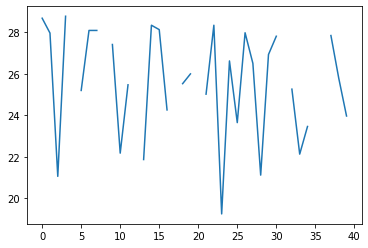

In [594]:
f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis].shape

ValueError: operands could not be broadcast together with shapes (66,39) (2,) 

In [ ]:
f0_list = []
for session_i in np.arange(len(multi_session_dict['threshold_dict'])):
    f0 = multi_session_dict['threshold_dict'][session_i]['f0_integral_trialwise'][:39]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:39]
    f0_list.append(f0)
    
f0_list = np.asarray(f0_list)
#f0_list = f0_list[delta_hit_rate>.1,:]
f0matrix = (f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis]).T

plt.plot(rollingfun(f0matrix.T,5).T,'k-',alpha = .5)
x = np.arange(39)
y = np.nanmean(f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis],0)
n = np.sum(np.isnan(f0_list),0)
yerror = np.nanstd(f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis],0)
plt.errorbar(x,y,yerror/np.sqrt(n),color = 'red')
plt.xlabel('trial#')
plt.ylabel('normalized F0')

In [634]:
plt.style.use(['default'])

In [337]:
trialwise_average_dff = multi_session_dict['trialwise_tuning_baseline'][session_i][multi_session_dict['cn'][session_i][0]-1,:] + multi_session_dict['trialwise_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1,:]
trialwise_average_dff.shape

(178,)

In [70]:
rvals = []
offsets = []
thresholds_dff = []
thresholds_dff_binned = []
starting_hit_rate = []
steady_hit_rate = []
starting_tuning = []
steady_tuning = []
starting_tuning_baseline = []
steady_tuning_baseline = []
starting_dff_per_frame = []
steady_dff_per_frame = []
starting_F_per_frame = []
steady_F_per_frame = []
starting_F0_per_frame = []
steady_F0_per_frame = []

starting_dff_per_frame_above_threshold = [] #integrated
steady_dff_per_frame_above_threshold = []#integrated
starting_F_per_frame_above_threshold = []#integrated
steady_F_per_frame_above_threshold = []#integrated
starting_F0_per_frame_above_threshold = []#integrated
steady_F0_per_frame_above_threshold = []#integrated

starting_zscored_average_dff = []
steady_zscored_average_dff = []

starting_std_F = []
steady_std_F = []
starting_std_dff = []
steady_std_dff = []
scalar_F0s = []

previous_session_tuning = []
delta_tuning_overnight  = []

cn_sds = []

for session_i in np.arange(len(multi_session_dict['threshold_dict'])):
    rvals.append(multi_session_dict['threshold_dict'][session_i]['lickport_F_pearsonR'])
    offsets.append(multi_session_dict['threshold_dict'][session_i]['lickport_F_offset'])
    thresholds_dff.append(multi_session_dict['threshold_dict'][session_i]['thresholds_dff'])
    thresholds_dff_binned.append(multi_session_dict['threshold_dict'][session_i]['thresholds_dff_binned'])
    starting_hit_rate.append(np.nanmean(multi_session_dict['hits'][session_i][:10]))
    steady_hit_rate.append(np.nanmean(multi_session_dict['hits'][session_i][20:40]))
    starting_tuning.append(np.nanmean(multi_session_dict['trialwise_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1,:10]))
    steady_tuning.append(np.nanmean(multi_session_dict['trialwise_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1,20:40]))
    starting_tuning_baseline.append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][session_i][multi_session_dict['cn'][session_i][0]-1,:10]))
    steady_tuning_baseline.append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][session_i][multi_session_dict['cn'][session_i][0]-1,20:40]))
    starting_F_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_integral_trialwise'][:10]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_F_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_integral_trialwise'][20:40]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))
    starting_F0_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['f0_integral_trialwise'][:10]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_F0_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['f0_integral_trialwise'][20:40]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))
    starting_dff_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_integral_trialwise'][:10]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_dff_per_frame.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_integral_trialwise'][20:40]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))
    
    trialwise_average_dff = multi_session_dict['trialwise_tuning_baseline'][session_i][multi_session_dict['cn'][session_i][0]-1,:] + multi_session_dict['trialwise_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1,:]
    trialwise_average_dff = trialwise_average_dff-np.nanmean(trialwise_average_dff)
    trialwise_average_dff = trialwise_average_dff/np.nanstd(trialwise_average_dff)
    starting_zscored_average_dff.append(np.nanmean(trialwise_average_dff[:10]))
    steady_zscored_average_dff.append(np.nanmean(trialwise_average_dff[20:40]))
    
    
    
    starting_F_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_integral_above_threshold_trialwise'][:10]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_F_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_integral_above_threshold_trialwise'][20:40]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))
    starting_F0_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['f0_integral_above_threshold_trialwise'][:10]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_F0_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['f0_integral_above_threshold_trialwise'][20:40]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))
    starting_dff_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_integral_above_threshold_trialwise'][:10]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:10]))
    steady_dff_per_frame_above_threshold.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_integral_above_threshold_trialwise'][20:40]))#/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][20:40]))

    starting_std_F.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_std_trialwise'][:10]))
    steady_std_F.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['F_std_trialwise'][20:40]))
    starting_std_dff.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_std_trialwise'][:10]))
    steady_std_dff.append(np.nanmean(multi_session_dict['threshold_dict'][session_i]['dff_std_trialwise'][20:40]))
    scalar_F0s.append(multi_session_dict['F0'][session_i][multi_session_dict['cn'][session_i]][0]-1)
    previous_session_tuning.append(multi_session_dict['previous_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1])
    delta_tuning_overnight.append(multi_session_dict['delta_tuning'][session_i][multi_session_dict['cn'][session_i][0]-1])
    
    cn_sds.append(multi_session_dict['sd_dff_closed_loop'][session_i][multi_session_dict['cn'][session_i][0]-1])

rvals = np.asarray(rvals)
offsets = np.asarray(offsets) - time_offset_error*20
thresholds_dff = np.asarray(thresholds_dff)
thresholds_dff_binned = np.asarray(thresholds_dff_binned)
starting_hit_rate = np.asarray(starting_hit_rate)
steady_hit_rate = np.asarray(steady_hit_rate)
delta_hit_rate = steady_hit_rate - starting_hit_rate
starting_tuning = np.asarray(starting_tuning)
steady_tuning = np.asarray(steady_tuning)
delta_tuning = steady_tuning - starting_tuning
starting_tuning_baseline = np.asarray(starting_tuning_baseline)
steady_tuning_baseline = np.asarray(steady_tuning_baseline)
delta_tuning_baseline = steady_tuning_baseline - starting_tuning_baseline
starting_dff_per_frame = np.asarray(starting_dff_per_frame)
steady_dff_per_frame = np.asarray(steady_dff_per_frame)
delta_dff_per_frame = steady_dff_per_frame - starting_dff_per_frame
starting_F_per_frame = np.asarray(starting_F_per_frame)
steady_F_per_frame = np.asarray(steady_F_per_frame)
delta_F_per_frame = steady_F_per_frame - starting_F_per_frame
starting_F0_per_frame = np.asarray(starting_F0_per_frame)
steady_F0_per_frame = np.asarray(steady_F0_per_frame)
delta_F0_per_frame = (steady_F0_per_frame - starting_F0_per_frame)/starting_F0_per_frame

starting_zscored_average_dff = np.asarray(starting_zscored_average_dff)
steady_zscored_average_dff = np.asarray(steady_zscored_average_dff)
delta_zscored_average_dff = steady_zscored_average_dff-starting_zscored_average_dff

starting_dff_per_frame_above_threshold = np.asarray(starting_dff_per_frame_above_threshold)
steady_dff_per_frame_above_threshold = np.asarray(steady_dff_per_frame_above_threshold)
delta_dff_per_frame_above_threshold = steady_dff_per_frame_above_threshold - starting_dff_per_frame_above_threshold
starting_F_per_frame_above_threshold = np.asarray(starting_F_per_frame_above_threshold)
steady_F_per_frame_above_threshold = np.asarray(steady_F_per_frame_above_threshold)
delta_F_per_frame_above_threshold = steady_F_per_frame_above_threshold - starting_F_per_frame_above_threshold
starting_F0_per_frame_above_threshold = np.asarray(starting_F0_per_frame_above_threshold)
steady_F0_per_frame_above_threshold = np.asarray(steady_F0_per_frame_above_threshold)
delta_F0_per_frame_above_threshold = steady_F0_per_frame_above_threshold - starting_F0_per_frame_above_threshold
scalar_F0s  = np.asarray(scalar_F0s )
previous_session_tuning = np.asarray(previous_session_tuning)
delta_tuning_overnight = np.asarray(delta_tuning_overnight)

starting_std_dff = np.asarray(starting_std_dff)
steady_std_dff = np.asarray(steady_std_dff)
delta_std_dff = steady_std_dff - starting_std_dff
starting_std_F = np.asarray(starting_std_F)
steady_std_F = np.asarray(steady_std_F)
delta_std_F = steady_std_F - starting_std_F

cn_sds = np.asarray(cn_sds)

min_starting_hit_rate = 0#.1
max_starting_hit_rate = 1#.9
min_lickport_F_rval = .4
min_F0 = 10
only_above_threshold = False
needed_sessions = (starting_hit_rate>=min_starting_hit_rate)&(starting_hit_rate<=max_starting_hit_rate)&(rvals>=min_lickport_F_rval) & (scalar_F0s>=min_F0) &(np.asarray(multi_session_dict['light_session']) ==False) & (np.asarray(multi_session_dict['post_light_session']) == False)#(((starting_hit_rate<.7)&((previous_session_tuning>-.4)&
needed_light_sessions = (starting_hit_rate>=min_starting_hit_rate)&(starting_hit_rate<=max_starting_hit_rate)&(rvals>=min_lickport_F_rval) & (scalar_F0s>=min_F0) &np.asarray(multi_session_dict['light_session'])

fig = plt.figure(figsize = [10,45])
ax = fig.add_subplot(8,2,1)
ax.hist(rvals,np.arange(0,1.05,.05))
ax.set_xlabel('lickport speed to CN activity correlation')
ax.set_ylabel('# of sessions')
ax = fig.add_subplot(8,2,2)
ax.hist(offsets[needed_sessions]/20,np.arange(-.5,2,.1))
ax.set_xlabel('Fluorescence to speed delay (s)')
ax.set_ylabel('# of sessions')

ax = fig.add_subplot(8,2,3)
x = delta_tuning[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

if sum(needed_light_sessions)>3:
    x = delta_tuning[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('within session delta tuning (df/f)')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,4)
if only_above_threshold:
    x = delta_F_per_frame_above_threshold[needed_sessions]
else:
    x = delta_F_per_frame[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    if only_above_threshold:
        x = delta_F_per_frame_above_threshold[needed_light_sessions]
    else:
        x = delta_F_per_frame[needed_light_sessions]
    #x = delta_F_per_frame[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta mean activity (pre-reward F)')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,5)
if only_above_threshold:
    x = delta_dff_per_frame_above_threshold[needed_sessions]
else:
    x = delta_dff_per_frame[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    if only_above_threshold:
        x = delta_dff_per_frame_above_threshold[needed_light_sessions]
    else:
        x = delta_dff_per_frame[needed_light_sessions]
    #x = delta_dff_per_frame[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta mean activity (pre-reward df/f - moving F0 )')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,6)
if only_above_threshold:
    x = delta_F_per_frame_above_threshold[needed_sessions]/scalar_F0s[needed_sessions]
else:
    x = delta_F_per_frame[needed_sessions]/scalar_F0s[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    if only_above_threshold:
        x = delta_F_per_frame_above_threshold[needed_light_sessions]/scalar_F0s[needed_light_sessions]
    else:
        x = delta_F_per_frame[needed_light_sessions]/scalar_F0s[needed_light_sessions]
    #x = delta_F_per_frame[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta mean activity (pre-reward df/f - fixed F0 )')
ax.set_ylabel('delta hit rate')
ax.legend()



ax = fig.add_subplot(8,2,7)
if only_above_threshold:
    x = delta_F0_per_frame_above_threshold[needed_sessions]
else:
    x = delta_F0_per_frame[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    if only_above_threshold:
        x = delta_F0_per_frame_above_threshold[needed_light_sessions]
    else:
        x = delta_F0_per_frame[needed_light_sessions]
    #x = delta_F0_per_frame[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta mean activity (moving F0)')
ax.set_ylabel('delta hit rate')
ax.legend()



ax = fig.add_subplot(8,2,8)
if only_above_threshold:
    x = delta_F0_per_frame_above_threshold[needed_sessions]
else:
    x = delta_F0_per_frame[needed_sessions]
y = delta_tuning[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    if only_above_threshold:
        x = delta_F0_per_frame_above_threshold[needed_light_sessions]
    else:
        x = delta_F0_per_frame[needed_light_sessions]
    #x = delta_F0_per_frame[needed_light_sessions]
    y = delta_tuning[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta mean activity (moving F0)')
ax.set_ylabel('within session delta tuning')
ax.legend()








ax = fig.add_subplot(8,2,9)
x = delta_std_F[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = delta_std_F[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta std(F) (pre-reward)')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,11)
x = delta_std_F[needed_sessions]/scalar_F0s[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = delta_std_F[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta std(dff) (pre-reward,fixed F0)')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,12)
x = delta_std_dff[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = delta_std_dff[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('delta std(dff) (pre-reward - moving F0)')
ax.set_ylabel('delta hit rate')
ax.legend()




ax = fig.add_subplot(8,2,13)
x = delta_tuning_baseline[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

if sum(needed_light_sessions)>3:
    x = delta_tuning_baseline[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('within session delta tuning baseline (df/f)')
ax.set_ylabel('delta hit rate')
ax.legend()


ax = fig.add_subplot(8,2,14)
x = delta_tuning_baseline[needed_sessions]  + delta_tuning[needed_sessions]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

if sum(needed_light_sessions)>3:
    x = delta_tuning_baseline[needed_light_sessions] + delta_tuning[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_xlabel('within session delta tuning peak value (df/f)')
ax.set_ylabel('delta hit rate')
ax.legend()




ax = fig.add_subplot(8,2,15)
y = delta_zscored_average_dff[needed_sessions]  + delta_tuning[needed_sessions]
x = starting_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

if sum(needed_light_sessions)>3:
    y = delta_zscored_average_dff[needed_light_sessions] + delta_tuning[needed_light_sessions]
    x = starting_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_ylabel('within session zscored delta tuning peak value (df/f)')
ax.set_xlabel('starting hit rate')
ax.legend()



ax = fig.add_subplot(8,2,16)
y = delta_tuning_baseline[needed_sessions]  + delta_tuning[needed_sessions]
x = starting_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'k.',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

if sum(needed_light_sessions)>3:
    y = delta_tuning_baseline[needed_light_sessions] + delta_tuning[needed_light_sessions]
    x = starting_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax.set_ylabel('within session delta tuning peak value (df/f)')
ax.set_xlabel('starting hit rate')
ax.legend()



fig = plt.figure(figsize = [15,10])
ax = fig.add_subplot(2,3,1)
ax.hist(thresholds_dff[needed_sessions,1],np.arange(-.5,10,.2),label = 'high threshold',color = 'red',alpha = .5)
ax.hist(thresholds_dff[needed_sessions,0],np.arange(-.5,10,.1),label = 'low threshold',color = 'green',alpha = .5)
ax.set_xlabel('threshold (dF/F)')
ax.set_ylabel('# of sessions')
ax.legend()



ax = fig.add_subplot(2,3,2)
ax.plot(thresholds_dff[needed_sessions,1],starting_hit_rate[needed_sessions],'r.',label = 'high threshold')
ax.plot(thresholds_dff[needed_sessions,0],starting_hit_rate[needed_sessions],'g.',label = 'low threshold')
ax.set_xlabel('threshold (dF/F)')
ax.set_ylabel('starting hit rate')
ax.legend()

ax = fig.add_subplot(2,3,3)
x = thresholds_dff[needed_sessions,1]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'r.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'r--',label = 'high th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))

x = thresholds_dff[needed_sessions,0]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'g.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'g--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax.set_xlabel('threshold (dF/F)')
ax.set_ylabel('delta hit rate')
ax.legend()




ax = fig.add_subplot(2,3,4)
ax.hist(thresholds_dff_binned[needed_sessions,1],np.arange(-.5,10,.2),label = 'high threshold',color = 'red',alpha = .5)
ax.hist(thresholds_dff_binned[needed_sessions,0],np.arange(-.5,10,.1),label = 'low threshold',color = 'green',alpha = .5)
ax.set_xlabel('threshold (binned fit, dF/F)')
ax.set_ylabel('# of sessions')
ax.legend()

ax = fig.add_subplot(2,3,5)
ax.plot(thresholds_dff_binned[needed_sessions,1],starting_hit_rate[needed_sessions],'r.',label = 'high threshold')
ax.plot(thresholds_dff_binned[needed_sessions,0],starting_hit_rate[needed_sessions],'g.',label = 'low threshold')
ax.set_xlabel('threshold (binned, dF/F)')
ax.set_ylabel('starting hit rate')
ax.legend()

ax = fig.add_subplot(2,3,6)
x = thresholds_dff_binned[needed_sessions,1]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'r.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'r--',label = 'high th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))

x = thresholds_dff[needed_sessions,0]
y = delta_hit_rate[needed_sessions]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'g.')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'g--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax.set_xlabel('threshold (binned, dF/F)')
ax.set_ylabel('delta hit rate')
ax.legend()



# x = np.diff(thresholds_dff[needed_sessions,:]).squeeze()
# y = delta_hit_rate[needed_sessions]
# nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
# ax.plot(x,y,'k.')
# r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
# p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
# xrange = np.percentile(x[nan_indices == False],[0,100])
# ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'delta th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))


#ax.plot(thresholds_dff[needed_sessions,1],delta_hit_rate[needed_sessions],'r.')

fig = plt.figure(figsize = [12,24])
ax1 = fig.add_subplot(4,2,1)
ax1.plot(thresholds_dff_binned[needed_sessions,0],thresholds_dff[needed_sessions,0],'ro',label = 'low threshold')
ax1.plot(thresholds_dff_binned[needed_sessions,1],thresholds_dff[needed_sessions,1],'go',label = 'high threshold')
ax1.set_xlabel('threshold dff binned')
ax1.set_ylabel('threshold dff')

ax2 = fig.add_subplot(4,2,2)
x = offsets[needed_sessions]/20
y = delta_hit_rate[needed_sessions]#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax2.plot(x,y,'ko',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax2.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = offsets[needed_light_sessions]/20
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax2.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax2.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
    
#ax2.plot(offsets[needed_sessions]/20,delta_hit_rate[needed_sessions],'k.')
ax2.set_xlabel('lickport delay (s)')
ax2.set_ylabel('delta hit rate')
ax2.legend()

ax3 = fig.add_subplot(4,2,3)
x = previous_session_tuning[needed_sessions]#starting_tuning
y = delta_hit_rate[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'ko',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))


if sum(needed_light_sessions)>3:
    x = previous_session_tuning[needed_light_sessions]
    y = delta_hit_rate[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax3.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax3.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
    
    
ax3.set_xlabel('mean tuning on previous session')
ax3.set_ylabel('delta hit rate')
ax3.legend()


ax3 = fig.add_subplot(4,2,4)
x = previous_session_tuning[needed_sessions]#starting_tuning
y = delta_tuning[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'ko',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = previous_session_tuning[needed_light_sessions]
    y = delta_tuning[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax3.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax3.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax3.set_xlabel('mean tuning on previous session')
ax3.set_ylabel('delta tuning (within session)')
ax3.legend()


ax3 = fig.add_subplot(4,2,5)
x = previous_session_tuning[needed_sessions]#starting_tuning
if only_above_threshold:
    y = delta_dff_per_frame_above_threshold[needed_sessions]
else:
    y = delta_dff_per_frame[needed_sessions]
#y = delta_dff_per_frame[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'ko',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = previous_session_tuning[needed_light_sessions]
    if only_above_threshold:
        y = delta_dff_per_frame_above_threshold[needed_light_sessions]
    else:
        y = delta_dff_per_frame[needed_light_sessions]
    #y = delta_dff_per_frame[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax3.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax3.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax3.set_xlabel('mean tuning on previous session')
ax3.set_ylabel('delta mean dff (within session before reward)')
ax3.legend()

ax3 = fig.add_subplot(4,2,6)
x = previous_session_tuning[needed_sessions]#starting_tuning
y = delta_std_dff[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'ko',label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'k--',label = 'low th - PearsonR: {:.3f}, p: {:.3f}'.format(*r))
if sum(needed_light_sessions)>3:
    x = previous_session_tuning[needed_light_sessions]
    y = delta_std_dff[needed_light_sessions]
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax3.plot(x,y,'b.',label = 'light sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax3.plot(xrange,np.polyval(p,xrange),'b--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax3.set_xlabel('mean tuning on previous session')
ax3.set_ylabel('delta std dff (within session before reward)')
ax3.legend()

fig= plt.figure(figsize = [15,15])
ax_hist = fig.add_subplot(2,2,1)
ax_hist.hist(cn_sds[needed_sessions],np.arange(0,3,.2),color = 'black',alpha = .5)
ax_hist.set_xlabel('std(dff) of CN')
ax_tuningchange = fig.add_subplot(2,2,2)

x = cn_sds[needed_sessions]#starting_tuning
y = delta_tuning_overnight[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax_tuningchange.plot(x,y,'ko')#,label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax_tuningchange.plot(xrange,np.polyval(p,xrange),'k--',label = 'ctrl: PearsonR: {:.3f}, p: {:.3f}'.format(*r))

try:
    x = cn_sds[needed_light_sessions]#starting_tuning
    y = delta_tuning_overnight[needed_light_sessions]#delta_tuning#delta_hit_rate
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax_tuningchange.plot(x,y,'bo')#,label = 'ctrl sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax_tuningchange.plot(xrange,np.polyval(p,xrange),'b--',label = 'light: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass


ax_tuningchange.legend()
#ax_tuningchange.plot(cn_sds[needed_sessions],delta_tuning_overnight[needed_sessions],'ko')
ax_tuningchange.set_xlabel('std(dff) of CN')
ax_tuningchange.set_ylabel('delta tuning between days')

ax_tuningchange = fig.add_subplot(2,2,4)
x = cn_sds[needed_sessions]#starting_tuning
y = delta_zscored_average_dff[needed_sessions]#delta_tuning#delta_hit_rate
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax_tuningchange.plot(x,y,'ko')#,label = 'ctrl sessions')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax_tuningchange.plot(xrange,np.polyval(p,xrange),'k--',label = 'ctrl: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
try:
    x = cn_sds[needed_light_sessions]#starting_tuning
    y = delta_zscored_average_dff[needed_light_sessions]#delta_tuning#delta_hit_rate
    nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
    ax_tuningchange.plot(x,y,'bo')#,label = 'ctrl sessions')
    r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
    p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
    xrange = np.percentile(x[nan_indices == False],[0,100])
    ax_tuningchange.plot(xrange,np.polyval(p,xrange),'b--',label = 'light: PearsonR: {:.3f}, p: {:.3f}'.format(*r))
except:
    pass


ax_tuningchange.legend()
#ax_tuningchange.plot(cn_sds[needed_sessions],delta_zscored_average_dff[needed_sessions],'ko')
ax_tuningchange.set_xlabel('std(dff) of CN')
ax_tuningchange.set_ylabel('delta tuning within day')




KeyError: 'previous_tuning'

Text(0, 0.5, 'delta tuning within day')

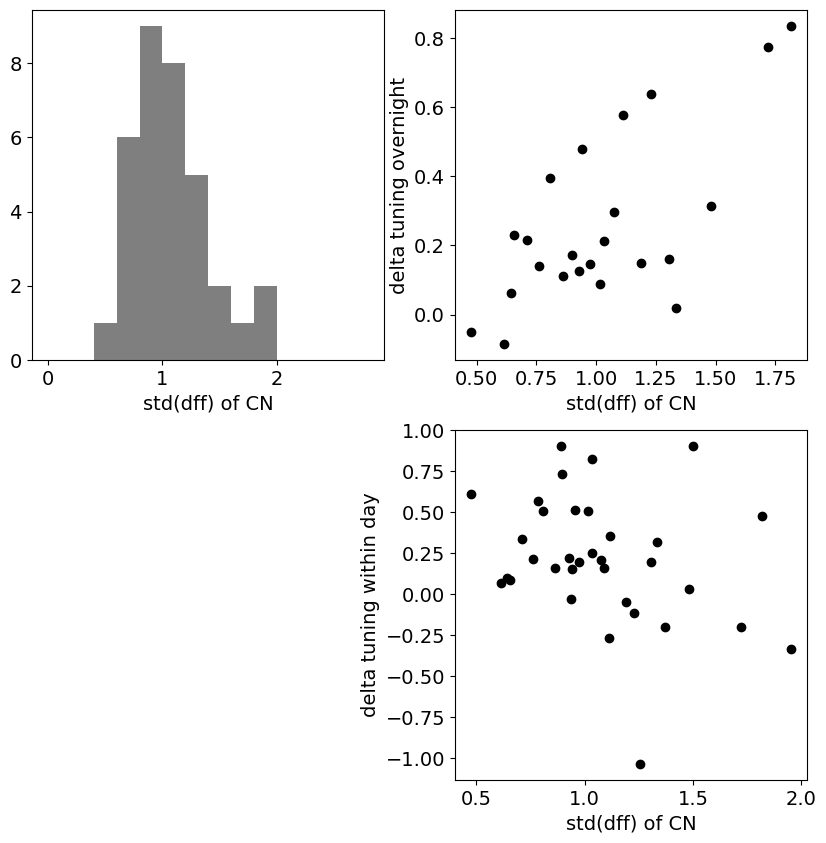

In [371]:
fig= plt.figure(figsize = [10,10])
ax_hist = fig.add_subplot(2,2,1)
ax_hist.hist(cn_sds[needed_sessions],np.arange(0,3,.2),color = 'black',alpha = .5)
ax_hist.set_xlabel('std(dff) of CN')
ax_tuningchange = fig.add_subplot(2,2,2)
ax_tuningchange.plot(cn_sds[needed_sessions],delta_tuning_overnight[needed_sessions],'ko')
ax_tuningchange.set_xlabel('std(dff) of CN')
ax_tuningchange.set_ylabel('delta tuning overnight')

ax_tuningchange = fig.add_subplot(2,2,4)
ax_tuningchange.plot(cn_sds[needed_sessions],delta_zscored_average_dff[needed_sessions],'ko')
ax_tuningchange.set_xlabel('std(dff) of CN')
ax_tuningchange.set_ylabel('delta tuning within day')



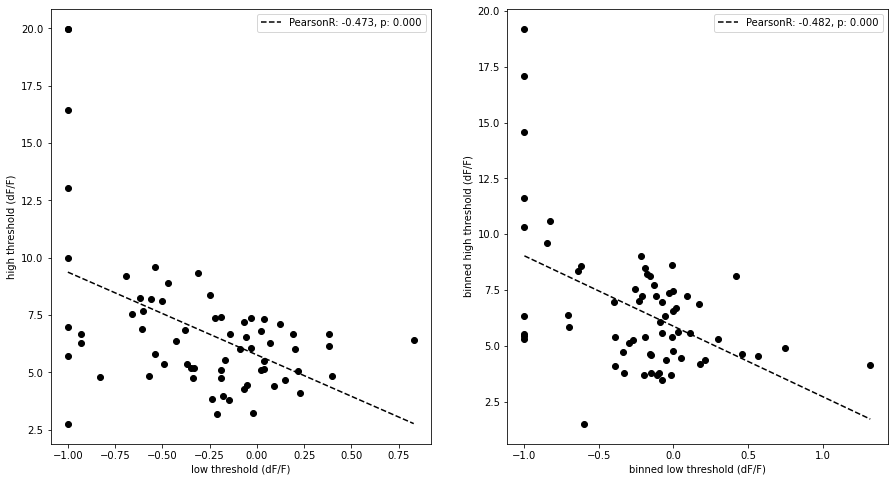

In [54]:
fig = plt.figure(figsize = [15,8])
ax=fig.add_subplot(1,2,1)
x = thresholds_dff[:,0]
y = thresholds_dff[:,1]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'ko')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

plt.xlabel('low threshold (dF/F)')
plt.ylabel('high threshold (dF/F)')
ax.legend()

ax=fig.add_subplot(1,2,2)
x = thresholds_dff_binned[:,0]
y = thresholds_dff_binned[:,1]
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'ko')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))

plt.xlabel('binned low threshold (dF/F)')
plt.ylabel('binned high threshold (dF/F)')
ax.legend()

In [476]:
multi_session_dict.keys()

dict_keys(['mouse', 'session', 'cn', 'rew', 'trial_start', 'vel', 'reward_indices', 'dFF_closed_loop', 'F0_closed_loop', 'trial_start_indices', 'lickport_move_indices', 'averaged_lickport_speed', 'hits', 'tuning', 'trialwise_tuning', 'trialwise_tuning_baseline', 'std_tuning', 'n_trials', 'sd_dff_closed_loop', 'F0', 'decay_p', 'mean_activity_closed_loop', 'mean_activity_closed_loop_selected', 'threshold_dict', 'light_session', 'post_light_session', 'masking_flash', 'FOV_mean_red_level', 'FOV_max_red_level', 'cn_red_level', 'vel_real'])

In [ ]:
f0_list = []
for session_i in np.arange(len(multi_session_dict['threshold_dict'])):
    # if multi_session_dict['light_session'][session_i]==False:
    #     continue
    f0 = multi_session_dict['threshold_dict'][session_i]['f0_integral_trialwise'][:39]/multi_session_dict['threshold_dict'][session_i]['trial_length_trialwise'][:39]
    f0_list.append(f0)
    
f0_list = np.asarray(f0_list)
#f0_list = f0_list[delta_hit_rate>.1,:]
f0matrix = (f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis]).T

plt.plot(rollingfun(f0matrix.T,5).T,'k-',alpha = .5)
x = np.arange(39)
y = np.nanmean(f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis],0)
n = np.sum(np.isnan(f0_list),0)
yerror = np.nanstd(f0_list/np.nanmean(f0_list[:,:10],1)[:,np.newaxis],0)
plt.errorbar(x,y,yerror/np.sqrt(n),color = 'red')
plt.xlabel('trial#')
plt.ylabel('normalized F0')

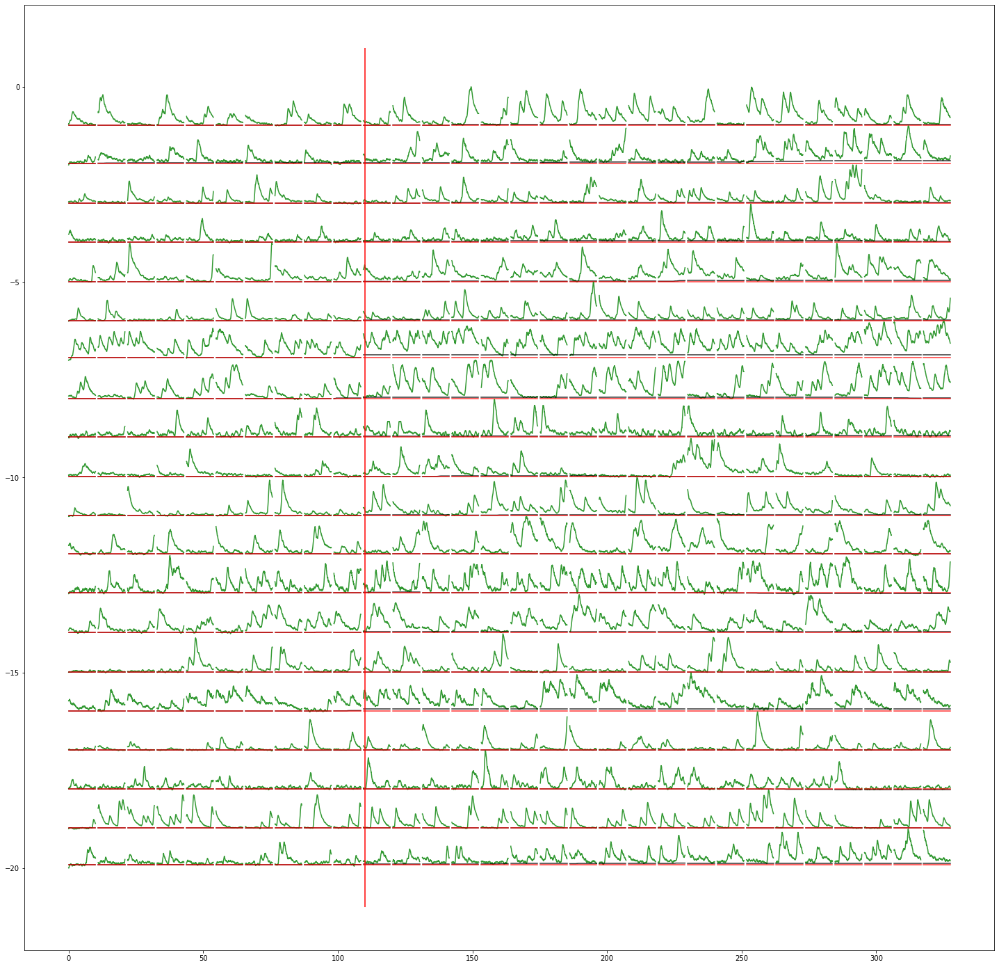

In [305]:
fig = plt.figure(figsize = [25,25])
ax =fig.add_subplot(111)
# f_by_trial_scaled=f_by_trial- np.nanmin(f_by_trial.flatten())
# f_by_trial_scaled = f_by_trial_scaled/np.nanmax(f_by_trial_scaled.flatten())

step_back = 0
step_forward = 200
time_vector = np.arange(-step_back,step_forward)/20
offset_so_far = 0
moving_average = 10 # nframes for rolling average
for session_i in np.argsort(delta_hit_rate)[::-1][:20]:#np.arange(5):#len(multi_session_dict['threshold_dict'])):
    cn = multi_session_dict['cn'][session_i][0]-1
    dff = rollingfun(multi_session_dict['dFF_closed_loop'][session_i][cn,:].squeeze(),moving_average)
    f0 = multi_session_dict['F0_closed_loop'][session_i][cn,:].squeeze()
    f = dff*f0 +f0
    f_by_trial = []
    f0_by_trial = []
    trial_start =  multi_session_dict['trial_start'][session_i]
    reward =  multi_session_dict['rew'][session_i]
    time_matrix = []
    for tsi in np.where(trial_start)[0]:
        try:
            next_ts = np.argmax(trial_start[tsi+1:])
        except:
            next_ts = 0
        if next_ts==0:
            next_rew = step_forward
        else:
            next_rew = np.argmax(reward[tsi:tsi+next_ts])
            if next_rew == 0:
                next_rew = step_forward
        next_rew = step_forward

        indices = [np.max([0,tsi-step_back]),np.min([len(f)-1,tsi+step_forward,tsi+next_rew])]
        trace_now = np.arange(-step_back,step_forward)*np.nan
        trace_now[step_back-(tsi-indices[0]):indices[1]-tsi+step_back] = f[indices[0]:indices[1]]
        f_by_trial.append(trace_now)
        time_matrix.append(time_vector)
        trace_now = np.arange(-step_back,step_forward)*np.nan
        trace_now[step_back-(tsi-indices[0]):indices[1]-tsi+step_back] = f0[indices[0]:indices[1]]
        f0_by_trial.append(trace_now)
    f_by_trial=np.asarray(f_by_trial)
    f0_by_trial=np.asarray(f0_by_trial)
    time_matrix=np.asarray(time_matrix)
    
    f_by_trial = np.concatenate([f_by_trial[:10,:],f_by_trial[20:40,:]],0)
    #f_by_trial = np.concatenate([f0_by_trial[:10,:],f0_by_trial[20:40,:]],0)
    f0_by_trial = np.concatenate([f0_by_trial[:10,:],f0_by_trial[20:40,:]],0)
    time_matrix = np.concatenate([time_matrix[:10,:],time_matrix[20:40,:]+10],0)
    
    maxval = np.nanmax(f_by_trial)
    minval = np.nanmin(f_by_trial)
    f_by_trial = f_by_trial-minval
    f_by_trial = f_by_trial/(maxval-minval)
    f0_by_trial = f0_by_trial-minval
    f0_by_trial = f0_by_trial/(maxval-minval)
    
    t_so_far = 0
    offset_so_far-=np.nanmax(f_by_trial)
    f0_ = f0_by_trial[0][np.argmin(np.isnan(f0_by_trial[0]))]
    for f,f0,t in zip(f_by_trial,f0_by_trial,time_matrix):
        f0_base =f0_*np.ones_like(f0)
        x = np.arange(len(f))/20+t_so_far#t
        plt.plot(x,f+offset_so_far,'g-',alpha = .8)
        plt.plot(x,f0+offset_so_far,'k-',alpha = .8)
        plt.plot(x,f0_base+offset_so_far,'r-',alpha = .8)
        t_so_far = x[-1]+1
    
    
    
ax.vlines(10*(len(x)/20+1),ax.get_ylim()[0],ax.get_ylim()[1],color = 'red')
    #asd
    


# f_by_trial.shape

In [189]:
f_by_trial.shape

(84, 220)

(array([1.7000e+01, 2.5220e+03, 1.9636e+04, 8.5900e+03, 1.6900e+03,
        5.0300e+02, 1.9900e+02, 6.3000e+01, 4.0000e+00, 4.0000e+00]),
 array([-1.30237361e+00, -1.15753492e+00, -1.01269623e+00, -8.67857539e-01,
        -7.23018848e-01, -5.78180156e-01, -4.33341465e-01, -2.88502773e-01,
        -1.43664082e-01,  1.17461003e-03,  1.46013302e-01]),
 <BarContainer object of 10 artists>)

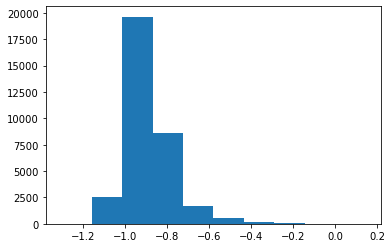

In [10]:
decay_ps  =np.concatenate(multi_session_dict['decay_p'])
decay_slopes = decay_ps[:,0]
needed  = (np.isnan(decay_slopes)|np.isinf(decay_slopes))==False
median_decay_slope = np.nanmedian(decay_slopes)
plt.hist(decay_slopes)

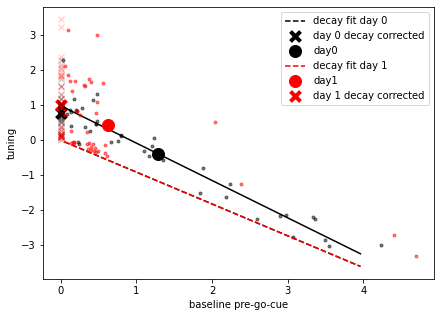

In [13]:
fig = plt.figure(figsize = [7,5])

use_median_slope = True

session_id = 2
mean_tunings = np.asarray(multi_session_dict['tuning'][session_id])
mean_tunings[np.isnan(mean_tunings)]=0
neuron_id =np.argsort(mean_tunings)[-6]# 5
neuron_id = multi_session_dict['cn'][session_id+1][0]-1


if use_median_slope:
    decay_ps  =np.concatenate(multi_session_dict['decay_p'])
    decay_slopes = decay_ps[:,0]
    needed  = (np.isnan(decay_slopes)|np.isinf(decay_slopes))==False
    median_decay_slope = np.nanmedian(decay_slopes)
    previous_decay_p = current_decay_p = [median_decay_slope,0]
else:
    previous_decay_p = multi_session_dict['decay_p'][session_id][neuron_id,:]
    current_decay_p = multi_session_dict['decay_p'][session_id+1][neuron_id,:]


baselines = multi_session_dict['trialwise_tuning_baseline'][session_id][neuron_id,:]
tunings = multi_session_dict['trialwise_tuning'][session_id][neuron_id,:]
nonnan = np.isnan(baselines+tunings) == False
p = np.polyfit(baselines[nonnan],tunings[nonnan],1)
x = np.percentile(baselines[nonnan],[1,99])
plt.plot(x,np.polyval(p,x),'k-')
try:
    plt.plot(x,np.polyval(previous_decay_p,x),'k--',label = 'decay fit day 0')
except:
    pass
tunings_decay_corrected = tunings-previous_decay_p[0]*baselines
plt.plot(tunings_decay_corrected*0,tunings_decay_corrected,'kx',alpha = .25)
plt.scatter(0,np.nanmean(tunings_decay_corrected),s = 100,marker = 'x',linewidths = 4,color= 'black',label = 'day 0 decay corrected')

plt.plot(baselines,tunings,'k.',alpha = .5)
plt.plot(np.nanmean(baselines),np.nanmean(tunings),'ko',markersize = 12,label = 'day0')
baselines = multi_session_dict['trialwise_tuning_baseline'][session_id+1][neuron_id,:]
tunings = multi_session_dict['trialwise_tuning'][session_id+1][neuron_id,:]
nonnan = np.isnan(baselines+tunings) == False
expected_tuning = np.polyval(p,np.nanmean(baselines))
plt.plot(baselines,tunings,'r.',alpha = .5)
try:
    plt.plot(x,np.polyval(current_decay_p,x),'r--',label = 'decay fit day 1')
except:
    pass
plt.plot(np.nanmean(baselines),np.nanmean(tunings),'ro',markersize = 12,label = 'day1')


tunings_decay_corrected = tunings-current_decay_p[0]*baselines
plt.plot(tunings_decay_corrected*0,tunings_decay_corrected,'rx',alpha = .25)
plt.scatter(0,np.nanmean(tunings_decay_corrected),s = 100,marker = 'x',linewidths = 4,color= 'red',label = 'day 1 decay corrected')

plt.xlabel('baseline pre-go-cue')
plt.ylabel('tuning')



plt.legend()

array([ True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True, False,  True, False,  True,  True, False,
        True,  True, False,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True, False,
       False, False,  True,  True,  True, False,  True,  True,  True,
        True, False, False,  True,  True, False, False,  True, False,
       False,  True,  True, False, False, False,  True, False,  True,
        True,  True,  True, False,  True,  True,  True, False,  True,
        True,  True, False,  True, False, False,  True,  True, False,
       False,  True, False, False,  True, False, False, False,  True,
       False, False, False, False,  True, False,  True, False,  True,
       False,  True,  True,  True,  True, False, False,  True, False,
        True, False, False,  True, False, False,  True, False,  True,
        True, False,  True,  True,  True,  True,  True, False,  True,
       False, False,

In [115]:
import matplotlib
font = {'family' : 'Arial',
        #'weight' : 'bold',
        'size'   : 14}
 
#figsavepath = '/home/jupyter/bucket/plots/dlc_matlab_cns_ridge_all_sessions/'
matplotlib.rc('font', **font)

In [130]:
multi_session_dict.keys()

dict_keys(['mouse', 'session', 'cn', 'rew', 'trial_start', 'vel', 'reward_indices', 'dFF_closed_loop', 'F0_closed_loop', 'trial_start_indices', 'lickport_move_indices', 'averaged_lickport_speed', 'hits', 'tuning', 'trialwise_tuning', 'trialwise_tuning_baseline', 'std_tuning', 'n_trials', 'sd_dff_closed_loop', 'F0', 'decay_p', 'mean_activity_closed_loop', 'mean_activity_closed_loop_selected', 'light_session', 'post_light_session', 'masking_flash', 'FOV_mean_red_level', 'FOV_max_red_level', 'cn_red_level', 'vel_real', 'delta_tuning', 'previous_delta_tuning', 'delta_tuning_2sessions', 'previous_tuning', 'previous_tuning_at_baseline_0', 'tuning_at_baseline_0', 'delta_tuning_at_baseline_0', 'baseline_matched_previous_tuning', 'previous_tuning_back_2_sessions', 'days_since_last_session', 'days_since_last_2sessions', 'bootstrapped_delta_tuning', 'previous_cn', 'baseline_corrected_delta_tuning', 'previous_day_baseline_tuning_slope', 'training_day_baseline_tuning_slope', 'tuning_baseline', 'pre

/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/tmp/ipykernel_27079/3661373635.py:176: RuntimeWarning: Mean of empty slice
  y = np.nanmean(tuning_change_list,0)
/tmp/ipykernel_27079/3661373635.py:251: RuntimeWarning: divide by zero encountered in true_divide
  trace_now = (trace_now-min_val)/(max_val-min_val)
/tmp/ipykernel_27079/3661373635.py:251: RuntimeWarning: invalid value encountered in true_divide
  trace_now = (trace_now-min_val)/(max_val-min_val)
/tmp/ipykernel_27079/3661373635.py:273: RuntimeWarning: Mean of empty slice
  ax_activityovertime.plot(np.nanmean(traces,0),'k-',linewidth = 4)
/tmp/ipykernel_27079/3661373635.py:274: RuntimeWarning: Mean of empty slice
  ax_activityovertime.errorbar(np.arange(traces.shape[1]),np.nanmean(traces,0),np.nanstd(traces,0),color='black')
/opt/conda/envs/bci_with_suite2p/lib/python3.8/sit

(0.0, 5.0)

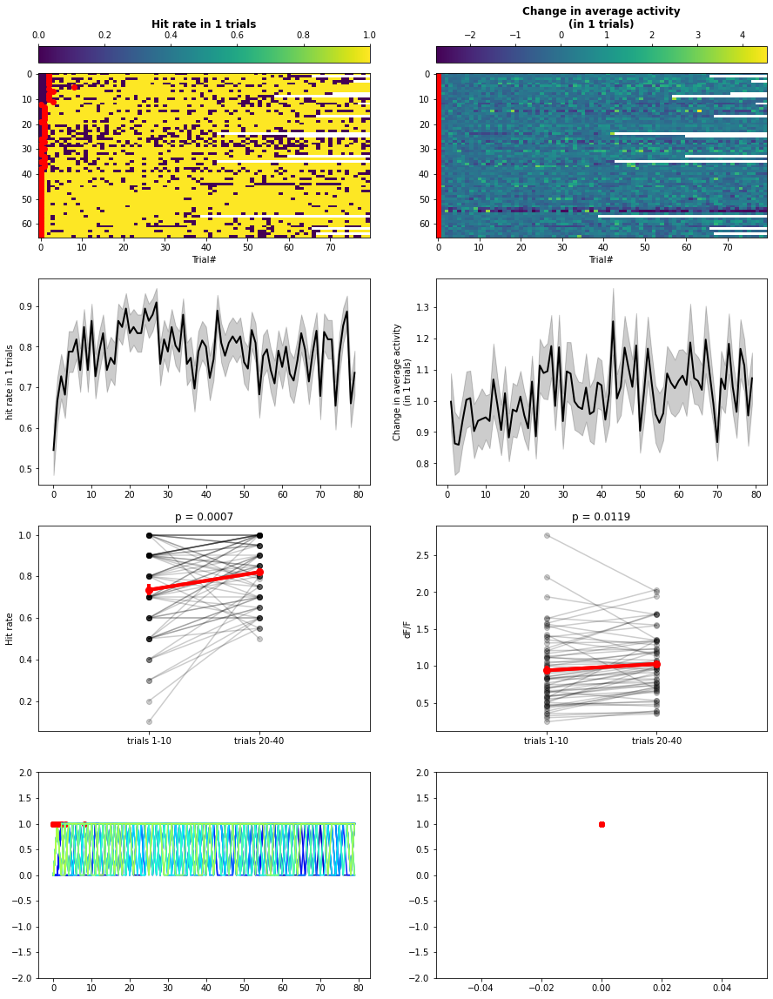

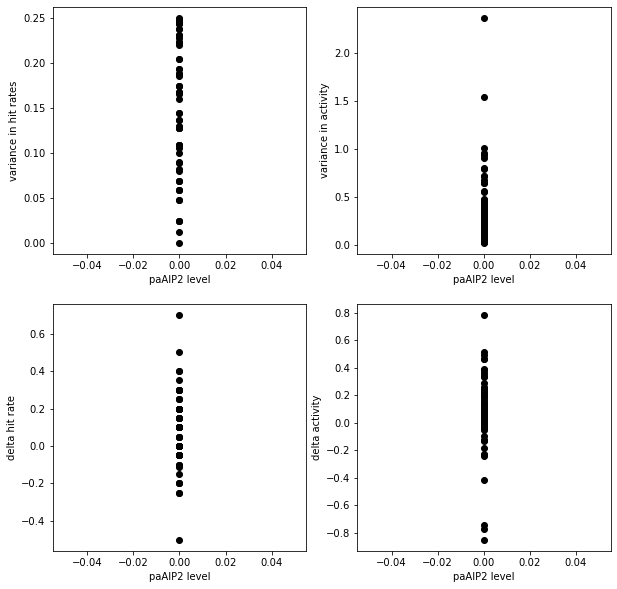

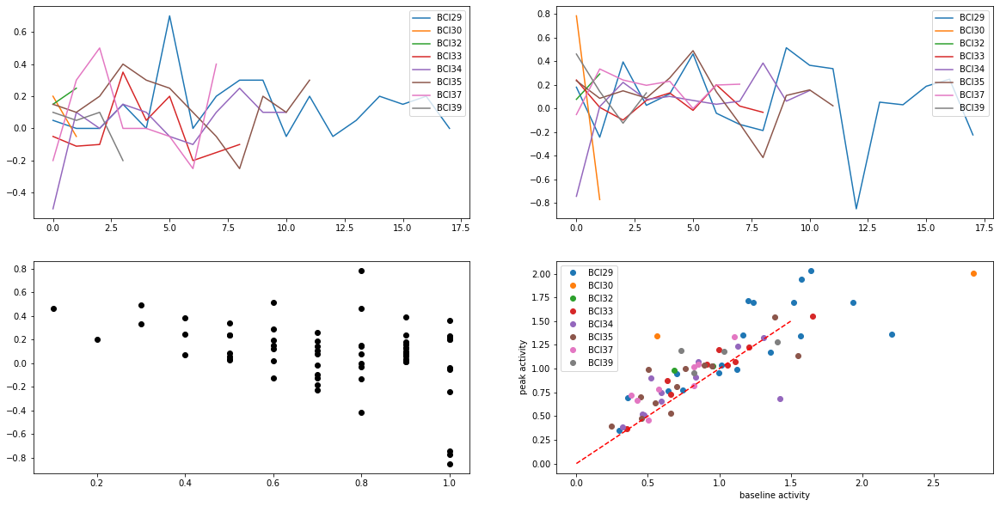

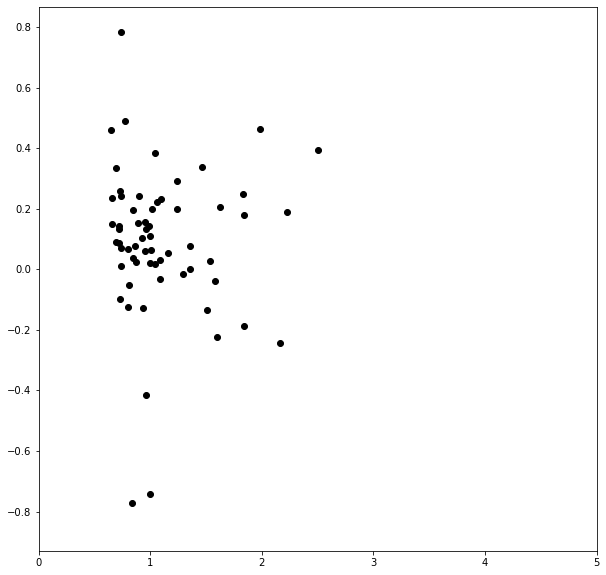

In [131]:
max_trial_num = 80
running_average = 1
min_lickport_r = .3
max_starting_hit_rate = 11
min_starting_hit_rate = -.6
starting_hit_rate_window = 10
tuning_change_list = []
hit_change_list = []
starting_hitrates = []
baseline_hits = []
steady_hits = []
baseline_dff = []
steady_dff = []
paAIP2_level = []
mouse_names  =[]
ninetieth_perc_std = []
cn_std_closed_loop = []
cn_mean_closed_loop = []
cn_mean_closed_loop_previous_session = []
zscore_amplitudes = False
import matplotlib.cm as cm
rollingfun = BCI_analysis.plot_utils.rollingfun

plot_type = 'all ctrl'
#plot_type = 'low light'
#plot_type = 'high ctrl'
# plot_type = 'high light'
for session_i in np.arange(len(multi_session_dict['trialwise_tuning'])):
    if 'ctrl' in plot_type.lower():
        if (multi_session_dict['light_session'][session_i] == True) or ( multi_session_dict['post_light_session'][session_i] == True):
            continue
    elif 'post light' in plot_type.lower():
        if  multi_session_dict['post_light_session'][session_i] == False:
            continue
    elif 'light' in plot_type.lower():
        if  multi_session_dict['light_session'][session_i] == False:#
            continue
        
    if 'low' in plot_type.lower():
        if multi_session_dict['mouse'][session_i] not in lowexpressing_mice:#lowexpressing_mice:
            continue
    elif 'high' in plot_type.lower():
        if multi_session_dict['mouse'][session_i] not in highexpressing_mice:#lowexpressing_mice:
            continue
    
    
    
    
    # if multi_session_dict['threshold_dict'][session_i]['lickport_F_pearsonR']<min_lickport_r:
    #     #print('skipped')
    #     continue
    cn = multi_session_dict['cn'][session_i][0]-1
    cn_std_closed_loop.append(np.nanstd(multi_session_dict['dFF_closed_loop'][session_i][[multi_session_dict['cn'][session_i][0]],:]))
    cn_mean_closed_loop_previous_session.append(multi_session_dict['previous_mean_activity_closed_loop'][session_i][multi_session_dict['cn'][session_i][0]])
    
    cn_mean_closed_loop.append(np.nanmean(multi_session_dict['dFF_closed_loop'][session_i][[multi_session_dict['cn'][session_i][0]],:]))
    paAIP2_level.append(multi_session_dict['cn_red_level'][session_i])
    mouse_names.append(multi_session_dict['mouse'][session_i])
    ninetieth_perc_std.append(multi_session_dict['ninetieth_std'][session_i])
    try:
        cn_original = multi_session_dict['cn_original'][session_i][0]
    except:
        cn_original = cn
    
    
    # if multi_session_dict['cn_light_dose'][session_i]<100:
    #     #print('skipped')
    #     continue
    # print(multi_session_dict['cn_light_dose'][session_i])
    # if multi_session_dict['light_dose'][session_i-1][cn_original]<50:
    #     continue
    #print(multi_session_dict['light_dose'][session_i-1][cn_original])
    
    trialwise_tuning = multi_session_dict['trialwise_tuning'][session_i][cn,:] + multi_session_dict['trialwise_tuning_baseline'][session_i][cn,:]
    
    trialwise_tuning_zscored = trialwise_tuning-np.nanmean(trialwise_tuning)
    trialwise_tuning_zscored = trialwise_tuning_zscored/np.nanstd(trialwise_tuning)
    if zscore_amplitudes: 
        baseline_dff.append(np.nanmean(trialwise_tuning_zscored[0:10]))
        steady_dff.append(np.nanmean(trialwise_tuning_zscored[20:40]))
    else:
        baseline_dff.append(np.nanmean(trialwise_tuning[0:10]))
        steady_dff.append(np.nanmean(trialwise_tuning[20:40]))
    

    
    trialnum_now = np.min([max_trial_num,multi_session_dict['trialwise_tuning'][session_i].shape[1]])
    trialwise_tuning_now = np.ones(max_trial_num)*np.nan
    trialwise_tuning_now[:trialnum_now]=trialwise_tuning[:trialnum_now]
    
    
    if zscore_amplitudes:   
        trialwise_tuning_now = (trialwise_tuning_now-np.nanmean(trialwise_tuning_now))/np.nanstd(trialwise_tuning_now)
        
    if running_average>1:
        trialwise_tuning_now = rollingfun(trialwise_tuning_now,running_average)
        trialwise_tuning_now = trialwise_tuning_now[int(running_average/2):]
    
    
    tuning_change_list.append(trialwise_tuning_now)
    
    hits = multi_session_dict['hits'][session_i]
    trialnum_now = np.min([max_trial_num,len(multi_session_dict['hits'][session_i])])
    hits_now = np.ones(max_trial_num)*np.nan
    hits_now[:trialnum_now]=hits[:trialnum_now]
    
    baseline_hits.append(np.nanmean(hits[0:10]))
    steady_hits.append(np.nanmean(hits[20:40]))
    
    starting_hitrates.append(np.nanmean(hits[:starting_hit_rate_window]))
    if running_average>1:
        hits_now = rollingfun(hits_now,running_average)
        hits_now = hits_now[int(running_average/2):]
    hit_change_list.append(hits_now)

cn_mean_closed_loop_previous_session = np.asarray(cn_mean_closed_loop_previous_session)
cn_std_closed_loop = np.asarray(cn_std_closed_loop)
cn_mean_closed_loop= np.asarray(cn_mean_closed_loop)
starting_hitrates = np.asarray(starting_hitrates)
mouse_names = np.asarray(mouse_names)
paAIP2_level  = np.asarray(paAIP2_level)
baseline_dff  = np.asarray(baseline_dff)
steady_dff  = np.asarray(steady_dff)
baseline_hits  = np.asarray(baseline_hits)
steady_hits  = np.asarray(steady_hits)
ninetieth_perc_std = np.asarray(ninetieth_perc_std)

tuning_change_list = np.asarray(tuning_change_list)
tuning_baseline = np.nanmean(tuning_change_list[:,:10],1)
tuning_change_list_norm = (tuning_change_list-tuning_baseline[:,np.newaxis])#/np.abs(tuning_baseline[:,np.newaxis])
hit_change_list = np.asarray(hit_change_list)
hit_change_list_norm = hit_change_list-np.nanmean(hit_change_list[:,:10],1)[:,np.newaxis]

#needed_sessions = (np.nanmean(hit_change_list[:,:1],1)<=max_starting_hit_rate) &(np.nanmean(hit_change_list[:,:1],1)>=min_starting_hit_rate)
needed_sessions = (starting_hitrates<=max_starting_hit_rate) &(starting_hitrates>=min_starting_hit_rate)
#needed_sessions = np.any(hit_change_list[:,:20] == 1,1)==False
tuning_change_list = tuning_change_list[needed_sessions,:]
tuning_change_list_norm = tuning_change_list_norm[needed_sessions,:]
hit_change_list = hit_change_list[needed_sessions,:]
hit_change_list_norm = hit_change_list_norm[needed_sessions,:]

cn_mean_closed_loop_previous_session = cn_mean_closed_loop_previous_session[needed_sessions]
cn_std_closed_loop = cn_std_closed_loop[needed_sessions]
cn_mean_closed_loop = cn_mean_closed_loop[needed_sessions]
starting_hitrates = starting_hitrates[needed_sessions]
steady_hits = steady_hits[needed_sessions]
steady_dff = steady_dff[needed_sessions]
baseline_hits = baseline_hits[needed_sessions]
baseline_dff = baseline_dff[needed_sessions]
paAIP2_level = paAIP2_level[needed_sessions]
mouse_names = mouse_names[needed_sessions]
ninetieth_perc_std = ninetieth_perc_std[needed_sessions]
# order = np.argsort(np.nanmean(tuning_change_list[:,:10],1))
# order = np.argsort(np.nanmean(tuning_change_list_norm[:,20:40],1))
# order = np.argsort(np.nanmean(hit_change_list_norm[:,20:40],1))
order = np.argsort(np.nanmean(hit_change_list[:,:2],1))



fig = plt.figure(figsize = [15,20])
ax_tuning = fig.add_subplot(4,2,2)
im = ax_tuning.imshow(tuning_change_list_norm[order,:],aspect='auto',interpolation='none')
if zscore_amplitudes:
    im.set_clim([-1,1])

cb = plt.colorbar(im,orientation='horizontal',location = 'top')
if zscore_amplitudes:
    cb.set_label(label = 'Change in z-scored average activity\n(in {} trials)'.format(running_average),size='large', weight='bold')
else:
    cb.set_label(label = 'Change in average activity\n(in {} trials)'.format(running_average),size='large', weight='bold')
ax_tuning.set_xlabel('Trial#')
ax_tuning_mean = fig.add_subplot(4,2,4)
#ax_tuning_mean.plot(np.nanmean(tuning_change_list_norm,0),'k-',linewidth = 2)

x = np.arange(tuning_change_list.shape[1])
y = np.nanmean(tuning_change_list,0)
yerr = np.nanstd(tuning_change_list,0)/np.sqrt(tuning_change_list.shape[0])
ax_tuning_mean.plot(x,y,'k-',linewidth = 2)
ax_tuning_mean.fill_between(x, y-yerr, y+yerr,color = 'black',alpha = .2)

if zscore_amplitudes:
    ax_tuning_mean.set_ylabel('Change in z-scored average activity\n(in {} trials)'.format(running_average))
else:
    ax_tuning_mean.set_ylabel('Change in average activity\n(in {} trials)'.format(running_average))





ax_hitrate = fig.add_subplot(4,2,1)
im = ax_hitrate.imshow(hit_change_list[order,:],aspect='auto',interpolation='none')
im.set_clim([-.8,.8])
im.set_clim([0,1])
cb = plt.colorbar(im,orientation='horizontal',location = 'top')
cb.set_label(label = 'Hit rate in {} trials'.format(running_average),size='large', weight='bold')
ax_hitrate.set_xlabel('Trial#')

ax_hit_mean = fig.add_subplot(4,2,3)

x = np.arange(hit_change_list.shape[1])
y = np.nanmean(hit_change_list,0)
yerr = np.nanstd(hit_change_list,0)/np.sqrt(hit_change_list.shape[0])
ax_hit_mean.plot(x,y,'k-',linewidth = 2)
ax_hit_mean.fill_between(x, y-yerr, y+yerr,color = 'black',alpha = .2)
    
    

ax_hit_mean.set_ylabel('hit rate in {} trials'.format(running_average))


ax_hit_2timepoints = fig.add_subplot(4,2,5)
ax_hit_2timepoints.plot(['trials 1-10','trials 20-40'],np.asarray([baseline_hits,steady_hits]),'ko-',alpha = .2)
ax_hit_2timepoints.plot(['trials 1-10','trials 20-40'],np.nanmean(np.asarray([baseline_hits,steady_hits]),1),'ro-',alpha = 1,markersize =8,linewidth =4)
ax_hit_2timepoints.errorbar(['trials 1-10','trials 20-40'],
                            np.nanmean(np.asarray([baseline_hits,steady_hits]),1),
                            np.nanstd(np.asarray([baseline_hits,steady_hits]),1)/np.sqrt(len(steady_hits)),
                            color = 'red',
                            linewidth = 4)
ax_hit_2timepoints.set_xlim([-1,2])
ax_hit_2timepoints.set_ylabel('Hit rate')
ttest = scipy.stats.ttest_rel(baseline_hits,steady_hits)
ax_hit_2timepoints.set_title('p = {:.4f}'.format(ttest.pvalue))


ax_hit_2timepoints = fig.add_subplot(4,2,6)
ax_hit_2timepoints.plot(['trials 1-10','trials 20-40'],np.asarray([baseline_dff,steady_dff]),'ko-',alpha = .2)
ax_hit_2timepoints.plot(['trials 1-10','trials 20-40'],np.nanmean(np.asarray([baseline_dff,steady_dff]),1),'ro-',alpha = 1,markersize =8,linewidth =4)
ax_hit_2timepoints.errorbar(['trials 1-10','trials 20-40'],
                            np.nanmean(np.asarray([baseline_dff,steady_dff]),1),
                            np.nanstd(np.asarray([baseline_dff,steady_dff]),1)/np.sqrt(len(steady_hits)),
                            color = 'red',
                            linewidth = 4)
ax_hit_2timepoints.set_xlim([-1,2])
if zscore_amplitudes:   
    ax_hit_2timepoints.set_ylabel('Zscored dF/F')
else:
    ax_hit_2timepoints.set_ylabel('dF/F')
ttest = scipy.stats.ttest_rel(baseline_dff,steady_dff)
ax_hit_2timepoints.set_title('p = {:.4f}'.format(ttest.pvalue))


cmap = cm.jet(np.linspace(0,1,len(order)))
end_peak_idx = 30
ax_hitovertime = fig.add_subplot(4,2,7)
for trace_i,trace_now in enumerate(hit_change_list[order,:]):
    min_val = trace_now[0]
    min_val = min(trace_now[:end_peak_idx])
    min_val = trace_now[0]
    max_val = max(trace_now[:end_peak_idx])
    max_idx = np.argmax(trace_now[:end_peak_idx])
    trace_now = (trace_now-min_val)/(max_val-min_val)
    ax_hitovertime.plot(trace_now,'-',color=cmap[trace_i,:])
    ax_hitovertime.plot(max_idx,1,'ro')
    ax_hitrate.plot(max_idx,trace_i,'ro')
ax_hitovertime.set_ylim([-2,2])    

ax_activityovertime = fig.add_subplot(4,2,8)
traces = []
for trace_i,trace_now in enumerate(tuning_change_list[order,:]):
    min_val = min(trace_now[:end_peak_idx])
    min_val = trace_now[0]
    max_val = max(trace_now[:end_peak_idx])
    max_idx = np.argmax(trace_now[:end_peak_idx])
    trace_now = (trace_now-min_val)/(max_val-min_val)
    trace_now[trace_now<-1.5] = -1.5
    trace_now[trace_now>1.5] = 1.5
    ax_activityovertime.plot(trace_now,'-',color=cmap[trace_i,:])
    if any(np.isinf(trace_now))==False:
        traces.append(trace_now)
    ax_activityovertime.plot(max_idx,1,'ro')
    ax_tuning.plot(max_idx,trace_i,'ro')
traces = np.asarray(traces)
ax_activityovertime.plot(np.nanmean(traces,0),'k-',linewidth = 4)
ax_activityovertime.errorbar(np.arange(traces.shape[1]),np.nanmean(traces,0),np.nanstd(traces,0),color='black')
ax_activityovertime.set_ylim([-2,2])


# fig = plt.figure(figsize = [10,10])
# variances_hit_rate = np.var(hit_change_list,0)
# variances_activity = np.var(tuning_change_list,0)
# ax1 = fig.add_subplot(2,2,1)
# ax1.hist(variances_hit_rate)
# ax2 = fig.add_subplot(2,2,2)
# ax2.hist(variances_activity)

fig = plt.figure(figsize = [10,10])
variances_hit_rate = np.nanvar(hit_change_list,1)
variances_activity = np.nanvar(tuning_change_list,1)
ax1 = fig.add_subplot(2,2,1)
ax1.plot(paAIP2_level,variances_hit_rate,'ko')
ax1.set_xlabel('paAIP2 level')
ax1.set_ylabel('variance in hit rates')
ax2 = fig.add_subplot(2,2,2)
ax2.plot(paAIP2_level,variances_activity,'ko')
ax2.set_xlabel('paAIP2 level')
ax2.set_ylabel('variance in activity')
ax3 = fig.add_subplot(2,2,3)
ax3.plot(paAIP2_level,steady_hits-baseline_hits,'ko')
ax3.set_xlabel('paAIP2 level')
ax3.set_ylabel('delta hit rate')
ax4 = fig.add_subplot(2,2,4)
ax4.plot(paAIP2_level,steady_dff-baseline_dff,'ko')
ax4.set_xlabel('paAIP2 level')
ax4.set_ylabel('delta activity')


fig = plt.figure(figsize = [20,10])
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
for mouse in np.unique(mouse_names):
    indices_now  =mouse_names==mouse
    ax1.plot((steady_hits-baseline_hits)[indices_now],label = mouse)
    ax2.plot((steady_dff-baseline_dff)[indices_now],label = mouse)
ax1.legend()
ax2.legend()
ax3 = fig.add_subplot(2,2,3)
ax3.plot(baseline_hits,steady_dff-baseline_dff,'ko')

ax4 = fig.add_subplot(2,2,4)
for mouse in np.unique(mouse_names):
    indices_now  =mouse_names==mouse
    ax4.plot(baseline_dff[indices_now],steady_dff[indices_now],'o',label = mouse)
ax4.legend()
ax4.set_xlabel('baseline activity')
ax4.set_ylabel('peak activity')
ax4.plot([0,1.5],[0,1.5],'r--')


fig = plt.figure(figsize = [10,10])
ax1 = fig.add_subplot(1,1,1)
ax1.plot(ninetieth_perc_std,(steady_dff-baseline_dff),'ko')
#ax1.set_xscale('log')
ax1.set_xlim([0,5])

In [133]:
cn_mean_closed_loop_previous_session

array([        nan,         nan,  0.45713864,  0.66487047,  0.65069381,
        2.0937042 ,  0.21679169,         nan,         nan,  0.50616834,
       -1.5080478 ,         nan,         nan,         nan,         nan,
        0.34882493,  1.90580917,  0.61961608,         nan,         nan,
               nan,         nan,         nan,         nan,  0.71323234,
        0.6467342 ,  0.59731211,         nan,         nan,         nan,
        0.70365693,         nan,         nan,  0.88708838,  0.50050403,
               nan,         nan,  0.75294275,         nan,         nan,
        0.78809181,  0.39050663,         nan,         nan,  0.61077522,
               nan,         nan,  1.06306123,         nan,         nan,
               nan,         nan,  0.37429886,  0.39062504,         nan,
               nan,  0.55587735,  0.2742206 ,         nan,         nan,
        0.89057883,  1.22478003,         nan,         nan,         nan,
               nan])

(array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 1., 1., 3., 3., 1., 5., 3., 2., 0., 2.,
        0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1.]),
 array([-1.5080478 , -1.43601276, -1.36397772, -1.29194268, -1.21990764,
        -1.1478726 , -1.07583756, -1.00380252, -0.93176748, -0.85973244,
        -0.7876974 , -0.71566236, -0.64362732, -0.57159228, -0.49955724,
        -0.4275222 , -0.35548716, -0.28345212, -0.21141708, -0.13938204,
        -0.067347  ,  0.00468804,  0.07672308,  0.14875812,  0.22079316,
         0.2928282 ,  0.36486324,  0.43689828,  0.50893332,  0.58096836,
         0.6530034 ,  0.72503844,  0.79707348,  0.86910852,  0.94114356,
         1.0131786 ,  1.08521364,  1.15724868,  1.22928372,  1.30131876,
         1.3733538 ,  1.44538884,  1.51742388,  1.58945892,  1.66149396,
         1.733529  ,  1.80556404,  1.87759908,  1.94963412,  2.02166916,
         2.0937042 ]),
 <BarContainer object

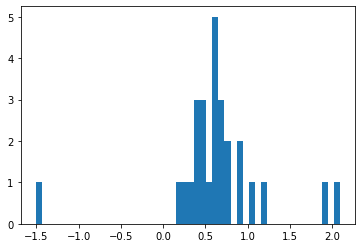

In [132]:
plt.hist(cn_mean_closed_loop_previous_session[np.isnan(cn_mean_closed_loop_previous_session)==False],50)

Text(0, 0.5, 'Average hit rate \n(moving averaging of 2 trials)')

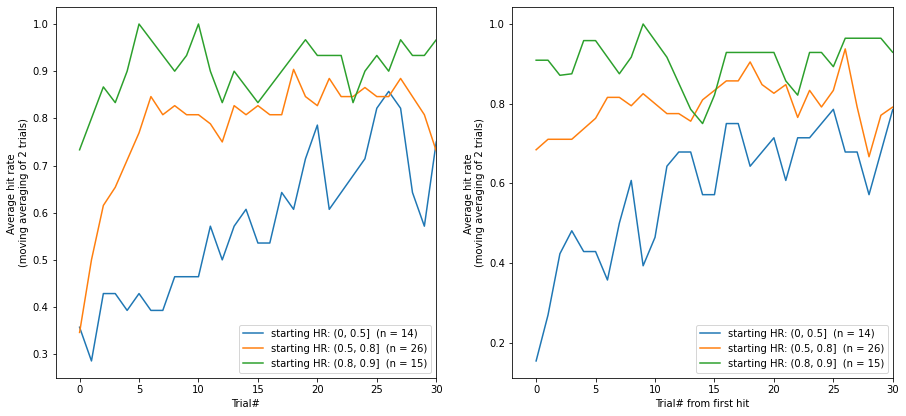

In [124]:
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2,sharex = ax1)
starting_hr_starts = [0,.2,.4,.6,.8,.9]
starting_hr_ends = [.2,.4,.6,.8,.9,1]
starting_hr_starts = [0,.5,.8]
starting_hr_ends = [.5,.8,.9]
movingwin = 2
for s_,e_ in zip(starting_hr_starts,starting_hr_ends):
    needed = (starting_hitrates > s_) & (starting_hitrates <= e_)
    hrtrace = np.nanmean(hit_change_list[needed,:],0)
    
    hrtraces_aligned = []
    for hrtrace_now in hit_change_list[needed,:]:
        hrtraces_aligned.append(np.roll(hrtrace_now,np.argmax(hrtrace_now)*-1-1))
    hrtraces_aligned = np.asarray(hrtraces_aligned)
    hrtrace_aligned = np.nanmean(hrtraces_aligned,0)
    if movingwin>1:
        hrtrace = rollingfun(hrtrace,movingwin)
        hrtrace_aligned = rollingfun(hrtrace_aligned,movingwin)
    ax1.plot(hrtrace,label = 'starting HR: ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)
    ax2.plot(hrtrace_aligned,label = 'starting HR: ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)
    
ax1.legend()
ax1.set_xlim([-2,30])
ax1.set_xlabel('Trial#')
ax1.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))

ax2.legend()
ax2.set_xlabel('Trial# from first hit')
ax2.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))



Text(0, 0.5, 'Average hit rate \n(moving averaging of 2 trials)')

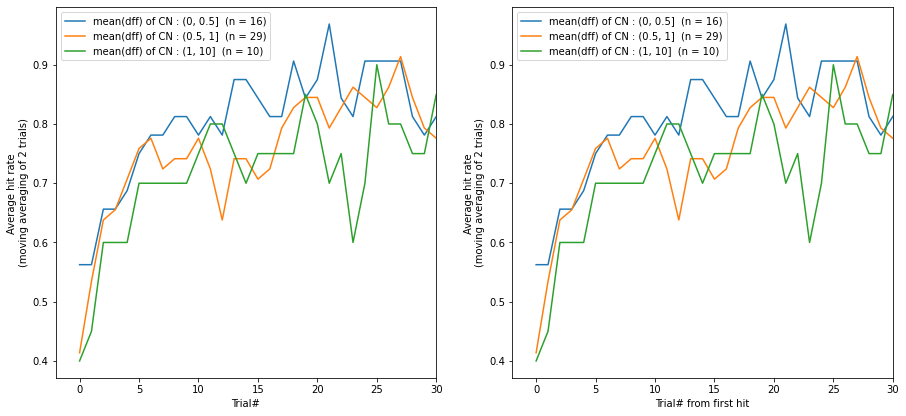

In [128]:
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2,sharex = ax1)
starting_mean_starts = [0,.5,1]
starting_mean_ends = [.5,1,10]
max_starting_hit_rate = .9
movingwin = 2
for s_,e_ in zip(starting_mean_starts,starting_mean_ends):
    needed = (cn_mean_closed_loop > s_) & (cn_mean_closed_loop <= e_) & (starting_hitrates<=max_starting_hit_rate)
    if sum(needed)==0:
        continue
    hrtrace = np.nanmean(hit_change_list[needed,:],0)
    
    hrtraces_aligned = []
    for hrtrace_now in hit_change_list[needed,:]:
        hrtraces_aligned.append(np.roll(hrtrace_now,np.argmax(hrtrace_now)*-1-1))
    hrtraces_aligned = np.asarray(hrtraces_aligned)
    hrtrace_aligned = np.nanmean(hrtraces_aligned,0)
    if movingwin>1:
        hrtrace = rollingfun(hrtrace,movingwin)
        hrtrace_aligned = rollingfun(hrtrace_aligned,movingwin)
    ax1.plot(hrtrace,label = 'mean(dff) of CN : ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)
    ax2.plot(hrtrace,label = 'mean(dff) of CN : ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)
    
ax1.legend()
ax1.set_xlim([-2,30])
ax1.set_xlabel('Trial#')
ax1.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))

ax2.legend()
ax2.set_xlabel('Trial# from first hit')
ax2.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))



Text(0, 0.5, 'Average hit rate \n(moving averaging of 2 trials)')

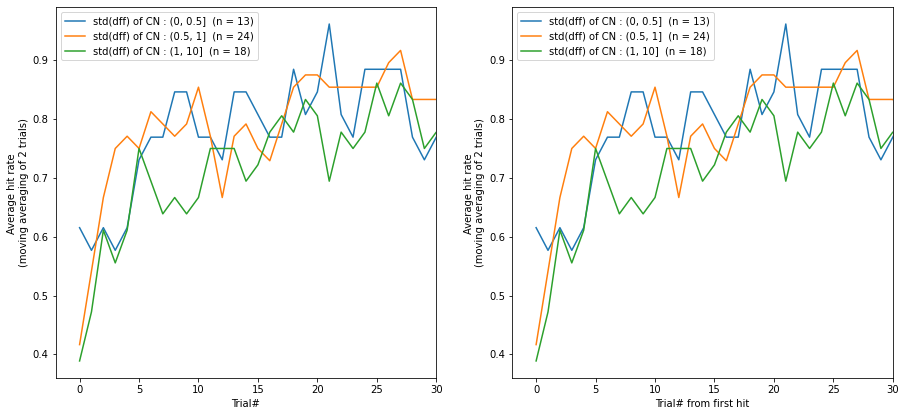

In [129]:
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2,sharex = ax1)
starting_std_starts = [0,.5,1]
starting_std_ends = [.5,1,10]
max_starting_hit_rate = .9

movingwin = 2
for s_,e_ in zip(starting_std_starts,starting_std_ends):
    needed = (cn_std_closed_loop > s_) & (cn_std_closed_loop <= e_)& (starting_hitrates<=max_starting_hit_rate)
    if sum(needed)==0:
        continue
    hrtrace = np.nanmean(hit_change_list[needed,:],0)
    
    hrtraces_aligned = []
    for hrtrace_now in hit_change_list[needed,:]:
        hrtraces_aligned.append(np.roll(hrtrace_now,np.argmax(hrtrace_now)*-1-1))
    hrtraces_aligned = np.asarray(hrtraces_aligned)
    hrtrace_aligned = np.nanmean(hrtraces_aligned,0)
    if movingwin>1:
        hrtrace = rollingfun(hrtrace,movingwin)
        hrtrace_aligned = rollingfun(hrtrace_aligned,movingwin)
    ax1.plot(hrtrace,label = 'std(dff) of CN : ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)
    ax2.plot(hrtrace,label = 'std(dff) of CN : ({}, {}]  (n = {})'.format(s_,e_,sum(needed)),alpha = 1)

    
ax1.legend()
ax1.set_xlim([-2,30])
ax1.set_xlabel('Trial#')
ax1.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))

ax2.legend()
ax2.set_xlabel('Trial# from first hit')
ax2.set_ylabel('Average hit rate \n(moving averaging of {} trials)'.format(movingwin))



In [83]:
plt.style.use(['default'])

(-0.2, 1.2)

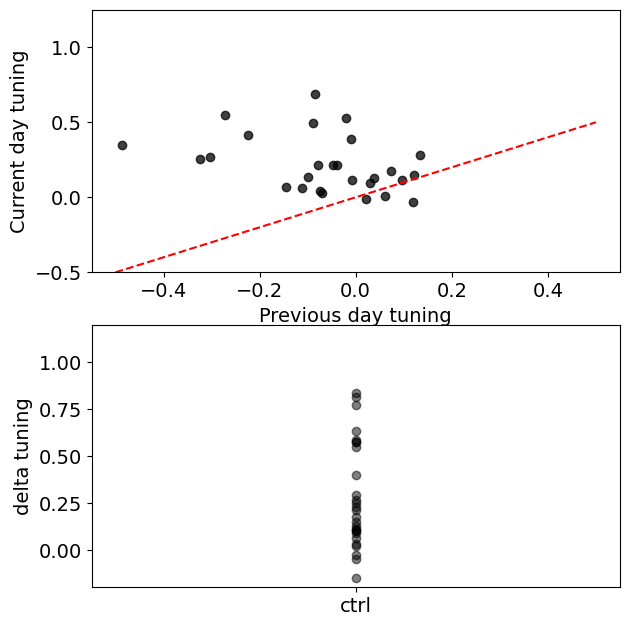

In [180]:
plot_type = 'all'
max_starting_hit_rate = .85

previous_day_tuning_ctrl = []
current_day_tuning_ctrl = []

previous_day_tuning_light = []
current_day_tuning_light = []

previous_day_tuning_post_light = []
current_day_tuning_post_light = []

for session_i in np.arange(len(multi_session_dict['trialwise_tuning'])):   
    cn = multi_session_dict['cn'][session_i][0]-1
    try:
        cn_original = multi_session_dict['cn_original'][session_i][0]
    except:
        cn_original = cn
    hits = multi_session_dict['hits'][session_i]

    if np.nanmean(hits[:10])>max_starting_hit_rate:
        continue
        
    if 'low' in plot_type.lower():
        if multi_session_dict['mouse'][session_i] not in lowexpressing_mice:#lowexpressing_mice:
            continue
    elif 'high' in plot_type.lower():
        if multi_session_dict['mouse'][session_i] not in highexpressing_mice:#lowexpressing_mice:
            continue
    if multi_session_dict['light_session'][session_i] == True:
        previous_day_tuning_light.append(multi_session_dict['previous_tuning'][session_i][cn])
        current_day_tuning_light.append(multi_session_dict['tuning'][session_i][cn])
    elif multi_session_dict['post_light_session'][session_i] == True:
        previous_day_tuning_post_light.append(multi_session_dict['previous_tuning'][session_i][cn])
        current_day_tuning_post_light.append(multi_session_dict['tuning'][session_i][cn])
    else:
        previous_day_tuning_ctrl.append(multi_session_dict['previous_tuning'][session_i][cn])
        current_day_tuning_ctrl.append(multi_session_dict['tuning'][session_i][cn])
        
        
previous_day_tuning_ctrl =np.asarray(previous_day_tuning_ctrl)
current_day_tuning_ctrl =np.asarray(current_day_tuning_ctrl)
previous_day_tuning_light = np.asarray(previous_day_tuning_light)
current_day_tuning_light = np.asarray(current_day_tuning_light)
previous_day_tuning_post_light = np.asarray(previous_day_tuning_post_light)
current_day_tuning_post_light = np.asarray(current_day_tuning_post_light)

fig = plt.figure(figsize = [15,7.5])
ax1 = fig.add_subplot(2,2,1)
ax1.plot(previous_day_tuning_ctrl,current_day_tuning_ctrl,'ko',alpha = .75)
ax1.plot(previous_day_tuning_light,current_day_tuning_light,'co',alpha = .75)
ax1.plot(previous_day_tuning_post_light,current_day_tuning_post_light,'yo',alpha = .75)
ax1.plot([-.5,.5],[-.5,.5],'r--')
ax1.set_xlabel('Previous day tuning')
ax1.set_ylabel('Current day tuning')
ax1.set_ylim([-.5,1.25])
ax2 = fig.add_subplot(2,2,3)
histrange = np.arange(-1,1,.05)
ax2.plot(['ctrl']*len(current_day_tuning_ctrl),current_day_tuning_ctrl-previous_day_tuning_ctrl,'ko',alpha = .5)
ax2.plot(['light']*len(current_day_tuning_light),current_day_tuning_light-previous_day_tuning_light,'co',alpha = .5)
ax2.plot(['post light']*len(current_day_tuning_post_light),current_day_tuning_post_light-previous_day_tuning_post_light,'yo',alpha = .5)
ax2.set_ylabel('delta tuning')
#ax2.set_xlim([-.5,2.5])
ax2.set_ylim([-.2,1.2])
#ax1.set_xlim([-.5,.5])

True

/tmp/ipykernel_13946/2470107723.py:26: RuntimeWarning: Mean of empty slice
  baselines = np.nanmean(trialwise_tuning[:,:10],1)
/tmp/ipykernel_13946/2470107723.py:27: RuntimeWarning: Mean of empty slice
  peaks = np.nanmean(trialwise_tuning[:,20:40],1)
/tmp/ipykernel_13946/2470107723.py:25: RuntimeWarning: invalid value encountered in add
  trialwise_tuning = multi_session_dict['trialwise_tuning'][session_i] + multi_session_dict['trialwise_tuning_baseline'][session_i]
/tmp/ipykernel_13946/2470107723.py:34: RuntimeWarning: invalid value encountered in true_divide
  all_deltas_fractional.append((peaks-baselines)/baselines)


Text(0, 0.5, 'Within session delta activity of CN')

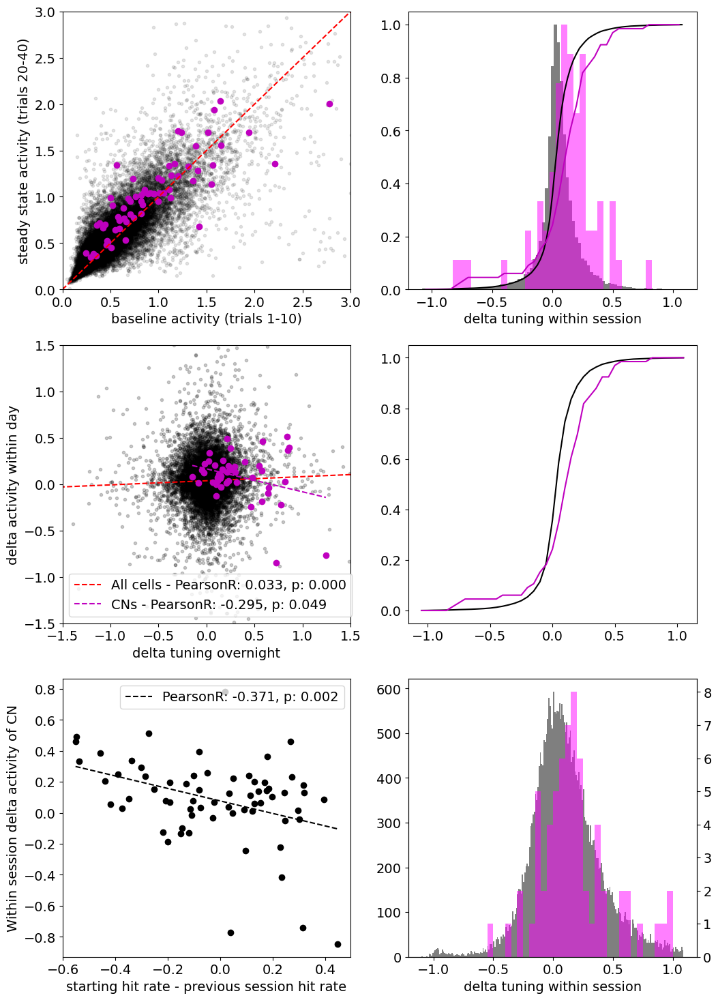

In [397]:
# look at sparsity
max_starting_hit_rate = 1.85
cn_baselines = []
cn_peaks = []
all_deltas = []
all_deltas_fractional = []
fig = plt.figure(figsize = [12,18])
ax1 = fig.add_subplot(3,2,1)
cn_tunings = []
cn_previous_tunings = []
cn_delta_tuning_overnight = []
all_deltas_overnight = []
starting_hit_rates = []
delta_hit_rates = []
for session_i in np.arange(len(multi_session_dict['session'])):
    #session_i = 6
    hits = multi_session_dict['hits'][session_i]
    if np.nanmean(hits[:10])>max_starting_hit_rate:
        continue
    # if multi_session_dict['mouse'][session_i] != multi_session_dict['mouse'][session_i-1]:
    #     continue
    starting_hit_rates.append(np.nanmean(hits[:10])-np.nanmean( multi_session_dict['hits'][session_i-1]))
    delta_hit_rates.append(np.nanmean(hits[20:40])-np.nanmean(hits[:10]))
    cn = multi_session_dict['cn'][session_i][0]-1
    trialwise_tuning = multi_session_dict['trialwise_tuning'][session_i] + multi_session_dict['trialwise_tuning_baseline'][session_i]
    baselines = np.nanmean(trialwise_tuning[:,:10],1)
    peaks = np.nanmean(trialwise_tuning[:,20:40],1)
    amplitudes = peaks-baselines
    plt.plot(baselines,peaks,'k.',alpha = .1)
    
    cn_baselines.append(baselines[cn])
    cn_peaks.append(peaks[cn])
    all_deltas.append(peaks-baselines)
    all_deltas_fractional.append((peaks-baselines)/baselines)
    cn_tunings.append(multi_session_dict['tuning'][session_i][cn])
    cn_previous_tunings.append(multi_session_dict['previous_tuning'][session_i][cn])
    cn_delta_tuning_overnight.append(multi_session_dict['delta_tuning'][session_i][cn])
    all_deltas_overnight.append(multi_session_dict['delta_tuning'][session_i])
    
    #break
all_deltas = np.concatenate(all_deltas)
all_deltas_overnight = np.concatenate(all_deltas_overnight)
all_deltas_fractional = np.concatenate(all_deltas_fractional)
cn_baselines = np.asarray(cn_baselines)
cn_peaks = np.asarray(cn_peaks)
cn_deltas = cn_peaks-cn_baselines
cn_tunings = np.asarray(cn_tunings)
cn_previous_tunings = np.asarray(cn_previous_tunings)
cn_delta_tuning_overnight = np.asarray(cn_delta_tuning_overnight)
starting_hit_rates = np.asarray(starting_hit_rates)
delta_hit_rates = np.asarray(delta_hit_rates)

plt.plot(cn_baselines,cn_peaks,'mo')  
plt.plot([0,5],[0,5],'r--')
plt.xlim([0,3])
plt.ylim([0,3])
ax1.set_xlabel('baseline activity (trials 1-10)')
ax1.set_ylabel('steady state activity (trials 20-40)')

ax2 = fig.add_subplot(3,2,2)
y_all,x_all = np.histogram(all_deltas,np.arange(-1.1,1.1,.025))
x_all = x_all[1:]
y_cn,x_cn = np.histogram(cn_deltas,np.arange(-1.1,1.1,.05))
x_cn = x_cn[1:]


#ax2.hist(all_deltas,np.arange(-1.1,1.1,.01),color= 'black',alpha = .5)
ax2.bar(x_all,y_all/np.max(y_all),.025,color= 'black',alpha = .5,linewidth = 4)
ax2.bar(x_cn,y_cn/np.max(y_cn),.05,color= 'magenta',alpha = .5,linewidth = 4)
ax2.plot(x_all,np.cumsum(y_all)/sum(y_all),'k-')
ax2.plot(x_cn,np.cumsum(y_cn)/sum(y_cn),'m-')

# ax22 = ax2.twinx()
# cn_deltas = cn_peaks-cn_baselines
# cn_deltas_fractional = (cn_peaks-cn_baselines)/cn_baselines
# cn_deltas[cn_deltas>1] = 1
# cn_deltas[cn_deltas<-1] = -1
# ax22.hist(cn_deltas,np.arange(-1.1,1.1,.025),color= 'magenta',alpha = .5)
ax2.set_xlabel('delta tuning within session')



ax2_cumhist = fig.add_subplot(3,2,4)
y_all,x_all = np.histogram(all_deltas,np.arange(-1.1,1.1,.05))
x_all = x_all[1:]
y_cn,x_cn = np.histogram(cn_deltas,np.arange(-1.1,1.1,.05))
x_cn = x_cn[1:]
ax2_cumhist.plot(x_all,np.cumsum(y_all)/sum(y_all),'k-')
ax2_cumhist.plot(x_cn,np.cumsum(y_cn)/sum(y_cn),'m-')


ax3 = fig.add_subplot(3,2,3)



x = all_deltas_overnight
y = all_deltas

x[x>3] = np.nan
y[y>3] = np.nan
x[x<-3] = np.nan
y[y<-3] = np.nan
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'k.',alpha = .2)
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'r--',label = 'All cells - PearsonR: {:.3f}, p: {:.3f}'.format(*r))



x = cn_delta_tuning_overnight
y = cn_deltas
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax3.plot(x,y,'mo')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax3.plot(xrange,np.polyval(p,xrange),'m--',label = 'CNs - PearsonR: {:.3f}, p: {:.3f}'.format(*r))

ax3.set_xlabel('delta tuning overnight')
ax3.set_ylabel('delta activity within day')
ax3.set_xlim([-1.5,1.5])
ax3.legend()
ax3.set_ylim([-1.5,1.5])


ax2 = fig.add_subplot(3,2,6)
ax2.hist(all_deltas_fractional,np.arange(-1.1,1.1,.01),color= 'black',alpha = .5)
ax22 = ax2.twinx()
cn_deltas = cn_peaks-cn_baselines
cn_deltas_fractional = (cn_peaks-cn_baselines)/cn_baselines
cn_deltas_fractional[cn_deltas_fractional>1] = 1
cn_deltas_fractional[cn_deltas_fractional<-1] = -1
ax22.hist(cn_deltas_fractional,np.arange(-1.1,1.1,.05),color= 'magenta',alpha = .5)
ax2.set_xlabel('delta tuning within session')

ax = fig.add_subplot(3,2,5)

x = starting_hit_rates
y = cn_deltas#delta_hit_rates#cn_deltas
nan_indices = np.isnan(x) |np.isnan(y)# | (y==0)
ax.plot(x,y,'ko')
r = scipy.stats.pearsonr(x[nan_indices == False],y[nan_indices == False])
p = np.polyfit(x[nan_indices == False],y[nan_indices == False],1)
xrange = np.percentile(x[nan_indices == False],[0,100])
ax.plot(xrange,np.polyval(p,xrange),'k--',label = 'PearsonR: {:.3f}, p: {:.3f}'.format(*r))
ax.legend()
ax.set_xlabel('starting hit rate - previous session hit rate')
ax.set_ylabel('Within session delta hit rate')
ax.set_ylabel('Within session delta activity of CN')

In [5]:
import random
multi_session_dict['delta_tuning'] = []
multi_session_dict['previous_delta_tuning'] = []
multi_session_dict['delta_tuning_2sessions'] = []
multi_session_dict['previous_tuning'] = []
multi_session_dict['previous_tuning_at_baseline_0'] = [] # decay corrected
multi_session_dict['tuning_at_baseline_0'] = []
multi_session_dict['delta_tuning_at_baseline_0'] = [] # decay corrected
multi_session_dict['baseline_matched_previous_tuning'] = []
multi_session_dict['previous_tuning_back_2_sessions'] = []
multi_session_dict['days_since_last_session'] = []
multi_session_dict['days_since_last_2sessions'] = []
multi_session_dict['bootstrapped_delta_tuning'] = []
multi_session_dict['previous_cn'] = []

multi_session_dict['baseline_corrected_delta_tuning'] = []
multi_session_dict['previous_day_baseline_tuning_slope'] = []
multi_session_dict['training_day_baseline_tuning_slope'] = []

multi_session_dict['tuning_baseline'] = []
multi_session_dict['previous_tuning_baseline'] = []
multi_session_dict['delta_tuning_baseline'] = []
multi_session_dict['previous_mean_activity_closed_loop'] = []
multi_session_dict['delta_mean_activity_closed_loop'] = []
multi_session_dict['previous_mean_activity_closed_loop_selected'] = []
multi_session_dict['delta_mean_activity_closed_loop_selected'] = []

multi_session_dict['tuning_peak'] = []
multi_session_dict['previous_tuning_peak'] = []

multi_session_dict['mean_calculated_tuning'] = []
multi_session_dict['previous_mean_calculated_tuning'] = []
multi_session_dict['delta_mean_calculated_tuning'] = []

multi_session_dict['delta_hit_rate_within_session'] = []

bootstrap_repeats = 1000
use_median_decay_slope = False

prev_mouse = ''
prev_session = ''
prev_prev_session = ''
prev_prev_mouse = ''
prev_cellnum = 0
prev_prev_cellnum = 0
prev_tunings = []
prev_prev_tunings = []
prev_baselines_trialwise = []
prev_tunings_trialwise = []
prev_slope_list = []
prev_cn = np.nan
if use_median_decay_slope:
    decay_ps  =np.concatenate(multi_session_dict['decay_p'])
    decay_slopes = decay_ps[:,0]
    needed  = (np.isnan(decay_slopes)|np.isinf(decay_slopes))==False
    median_decay_slope = np.nanmedian(decay_slopes)
    print('slope used for decay correction: {:.3f}'.format(median_decay_slope))
for mat_i in np.arange(len(multi_session_dict['tuning'])):
    new_fov = False
    if multi_session_dict['mouse'][mat_i] != prev_mouse:
        days_since_last_session = np.nan
        days_since_last_2session = np.nan
    else:
        days_since_last_session = (datetime.strptime(multi_session_dict['session'][mat_i],'%m%d%y')-datetime.strptime(prev_session,'%m%d%y')).days
        if multi_session_dict['mouse'][mat_i] != prev_prev_mouse:
            days_since_last_2session = np.nan
        else:
            days_since_last_2session = (datetime.strptime(multi_session_dict['session'][mat_i],'%m%d%y')-datetime.strptime(prev_prev_session,'%m%d%y')).days
            
        
    multi_session_dict['days_since_last_session'].append(days_since_last_session)
    multi_session_dict['days_since_last_2sessions'].append(days_since_last_2session)
    
    # calculate slopes of baseline and tuning
    tunings_trialwise = multi_session_dict['trialwise_tuning'][mat_i]  
    baselines_trialwise = multi_session_dict['trialwise_tuning_baseline'][mat_i]  
    slope_list = []
    tunings_at_0_list = []
    for neuron_i,(baselines_,tunings_) in enumerate(zip(baselines_trialwise,tunings_trialwise)):
        if use_median_decay_slope:
            tunings_decay_corrected = tunings_-median_decay_slope*baselines_
        else:
            decay_p = multi_session_dict['decay_p'][mat_i][neuron_i,:]
            tunings_decay_corrected = tunings_-decay_p[0]*baselines_

        nonnan = np.isnan(baselines_+tunings_) == False
        if sum(nonnan)>10:
            try:
                p = np.polyfit(baselines_[nonnan],tunings_[nonnan],1)
                tuning_at_0 = np.polyval(p,0)
            except:
                p = [np.nan,np.nan]
                tuning_at_0 = np.nan
        else:
            p = [np.nan,np.nan]
            tuning_at_0 = np.nan
        slope_list.append(p)
        
        #tunings_at_0_list.append(tuning_at_0)
        tunings_at_0_list.append(np.nanmean(tunings_decay_corrected))
        
    slope_list = np.asarray(slope_list)
    tunings_at_0_list = np.asarray(tunings_at_0_list)
    
    
    if multi_session_dict['mouse'][mat_i] != prev_mouse or prev_cellnum != len(multi_session_dict['tuning'][mat_i]): # new mouse or new FOV
        delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
        baseline_corrected_delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
        baseline_matched_previous_tunings= np.nan*multi_session_dict['tuning'][mat_i]
        prev_tunings = np.nan*multi_session_dict['tuning'][mat_i]
        prev_baselines_trialwise = np.nan*multi_session_dict['trialwise_tuning'][mat_i]
        prev_tunings_trialwise = np.nan*multi_session_dict['trialwise_tuning'][mat_i]
        delta_delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
        previous_delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
        prev_mouse = multi_session_dict['mouse'][mat_i]
        prev_cellnum = len(multi_session_dict['tuning'][mat_i])
        prev_slope_list = np.asarray([np.nan*multi_session_dict['tuning'][mat_i]]*2).T
        prev_tunings_at_0_list = np.nan*multi_session_dict['tuning'][mat_i]
        ampl_list = np.nan
        prev_cn = np.nan
        
        
        mean_activity = prev_mean_activity = np.nan*multi_session_dict['tuning'][mat_i]
        mean_activity_selected = prev_mean_activity_selected = np.nan*multi_session_dict['tuning'][mat_i]
        prev_tuning_peak = tuning_peak = np.nan*multi_session_dict['tuning'][mat_i]
        
        mean_calc_tuning = prev_mean_calc_tuning = diff_mean_calc_tuning = np.nan*multi_session_dict['tuning'][mat_i]
        
        
        
    else:
        
        expected_tunings = []
        for p,baselines in zip(prev_slope_list, multi_session_dict['trialwise_tuning_baseline'][mat_i]):
            exp_tuns = np.polyval(p,baselines)
            expected_tunings.append(np.nanmean(exp_tuns))
        expected_tunings = np.asarray(expected_tunings)
        delta_tunings  = multi_session_dict['tuning'][mat_i]-prev_tunings
        baseline_corrected_delta_tunings  = multi_session_dict['tuning'][mat_i]-expected_tunings
        baseline_matched_previous_tunings = expected_tunings
        
        
        ampl_list = []
        for boot_i in np.arange(bootstrap_repeats):
            amp_prev = np.nanmean(multi_session_dict['trialwise_tuning'][mat_i-1][:,np.random.choice(np.arange(multi_session_dict['trialwise_tuning'][mat_i-1].shape[1]),multi_session_dict['trialwise_tuning'][mat_i-1].shape[1])],1) 
            amp_now = np.nanmean(multi_session_dict['trialwise_tuning'][mat_i][:,np.random.choice(np.arange(multi_session_dict['trialwise_tuning'][mat_i].shape[1]),multi_session_dict['trialwise_tuning'][mat_i].shape[1])],1)
            diff_now = amp_now-amp_prev
            ampl_list.append(diff_now)
        ampl_list = np.asarray(ampl_list)
        
        mean_activity = multi_session_dict['mean_activity_closed_loop'][mat_i]
        mean_activity_selected = multi_session_dict['mean_activity_closed_loop_selected'][mat_i]
        tuning_peak = np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1)+multi_session_dict['tuning'][mat_i]
        
        mean_calc_tuning = tuning_peak-mean_activity_selected
        diff_mean_calc_tuning = mean_calc_tuning-prev_mean_calc_tuning
        # calculate slope for each cell
        
    
        if multi_session_dict['mouse'][mat_i] != prev_prev_mouse or prev_prev_cellnum != len(multi_session_dict['tuning'][mat_i]):
            delta_delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
            previous_delta_tunings = np.nan*multi_session_dict['tuning'][mat_i]
            prev_prev_mouse = prev_mouse
            prev_prev_cellnum = prev_cellnum
        else:
            delta_delta_tunings  = multi_session_dict['tuning'][mat_i]-prev_prev_tunings
        
    
    
    multi_session_dict['bootstrapped_delta_tuning'].append( ampl_list)
    multi_session_dict['previous_tuning'].append(prev_tunings)
    multi_session_dict['previous_tuning_back_2_sessions'].append(prev_prev_tunings)
    multi_session_dict['delta_tuning'].append(delta_tunings)
    multi_session_dict['delta_tuning_2sessions'].append(delta_delta_tunings)
    multi_session_dict['previous_delta_tuning'].append(previous_delta_tunings)
    multi_session_dict['previous_cn'].append(prev_cn)
    multi_session_dict['previous_day_baseline_tuning_slope'].append(prev_slope_list)
    multi_session_dict['training_day_baseline_tuning_slope'].append(slope_list)
    multi_session_dict['baseline_corrected_delta_tuning'].append(baseline_corrected_delta_tunings)
    multi_session_dict['baseline_matched_previous_tuning'].append(baseline_matched_previous_tunings)
    multi_session_dict['previous_tuning_at_baseline_0'].append(prev_tunings_at_0_list)
    multi_session_dict['tuning_at_baseline_0'].append(tunings_at_0_list)
    multi_session_dict['delta_tuning_at_baseline_0'].append(tunings_at_0_list-prev_tunings_at_0_list)
    
    
    multi_session_dict['tuning_baseline'].append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1))
    multi_session_dict['previous_tuning_baseline'].append( np.nanmean(prev_baselines_trialwise,1))
    multi_session_dict['delta_tuning_baseline'].append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1)- np.nanmean(prev_baselines_trialwise,1))
    multi_session_dict['previous_mean_activity_closed_loop'].append(prev_mean_activity)
    multi_session_dict['delta_mean_activity_closed_loop'].append(mean_activity-prev_mean_activity)
    multi_session_dict['previous_mean_activity_closed_loop_selected'].append(prev_mean_activity_selected)
    multi_session_dict['delta_mean_activity_closed_loop_selected'].append(mean_activity_selected-prev_mean_activity_selected)
    
    multi_session_dict['tuning_peak'].append(tuning_peak)
    multi_session_dict['previous_tuning_peak'].append(prev_tuning_peak)
    
    multi_session_dict['mean_calculated_tuning'].append(mean_calc_tuning)
    multi_session_dict['previous_mean_calculated_tuning'].append(prev_mean_calc_tuning)
    multi_session_dict['delta_mean_calculated_tuning'].append(diff_mean_calc_tuning)
    
    previous_delta_tunings = delta_tunings
    prev_prev_session = prev_session
    prev_session = multi_session_dict['session'][mat_i]
    prev_prev_tunings = prev_tunings
    prev_tunings = multi_session_dict['tuning'][mat_i]  
    prev_tunings_trialwise = multi_session_dict['trialwise_tuning'][mat_i]  
    prev_baselines_trialwise = multi_session_dict['trialwise_tuning_baseline'][mat_i]  
    prev_cn = multi_session_dict['cn'][mat_i][0] -1
    prev_slope_list = slope_list
    prev_tunings_at_0_list = tunings_at_0_list
    
    
    prev_mean_activity = mean_activity
    prev_mean_activity_selected = mean_activity_selected
    prev_tuning_peak = tuning_peak
    
    prev_mean_calc_tuning = mean_calc_tuning
    

/tmp/ipykernel_27079/448367044.py:100: RuntimeWarning: Mean of empty slice
  tunings_at_0_list.append(np.nanmean(tunings_decay_corrected))
/tmp/ipykernel_27079/448367044.py:186: RuntimeWarning: Mean of empty slice
  multi_session_dict['tuning_baseline'].append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1))
/tmp/ipykernel_27079/448367044.py:187: RuntimeWarning: Mean of empty slice
  multi_session_dict['previous_tuning_baseline'].append( np.nanmean(prev_baselines_trialwise,1))
/tmp/ipykernel_27079/448367044.py:188: RuntimeWarning: Mean of empty slice
  multi_session_dict['delta_tuning_baseline'].append(np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1)- np.nanmean(prev_baselines_trialwise,1))
/tmp/ipykernel_27079/448367044.py:136: RuntimeWarning: Mean of empty slice
  expected_tunings.append(np.nanmean(exp_tuns))
/tmp/ipykernel_27079/448367044.py:145: RuntimeWarning: Mean of empty slice
  amp_prev = np.nanmean(multi_session_dict['trialwise_tuning'

In [34]:
# I found some correlation between previous session mean / std activity and delta tuning/hit rate
# is this present in the big dataset?



/tmp/ipykernel_11935/2093437301.py:1: RuntimeWarning: Mean of empty slice
  np.nanmean(multi_session_dict['trialwise_tuning_baseline'][mat_i],1).shape


(544,)

# How stable is mean activity?, peak tuning, baseline tuning?
A claim is that delta tuning is good because it's stable.  I think mean activity should be more stable than pre-go-cue activity. Let's check.

In [56]:
x

array([1.31144067, 0.33384104, 1.27326658, ..., 0.47715348, 0.37733907,
       0.50601649])

/tmp/ipykernel_13946/386894276.py:43: RuntimeWarning: Mean of empty slice
  x_cn = (x_cn-np.nanmean(x))/np.nanstd(x)
/tmp/ipykernel_13946/386894276.py:45: RuntimeWarning: Mean of empty slice
  y_cn = (y_cn-np.nanmean(y))/np.nanstd(y)
/tmp/ipykernel_13946/386894276.py:47: RuntimeWarning: Mean of empty slice
  x = (x-np.nanmean(x))/np.nanstd(x)
/tmp/ipykernel_13946/386894276.py:48: RuntimeWarning: Mean of empty slice
  y = (y-np.nanmean(y))/np.nanstd(y)
/tmp/ipykernel_13946/386894276.py:92: RuntimeWarning: Mean of empty slice
  x_cn = (x_cn-np.nanmean(x))/np.nanstd(x)
/tmp/ipykernel_13946/386894276.py:94: RuntimeWarning: Mean of empty slice
  y_cn = (y_cn-np.nanmean(y))/np.nanstd(y)
/tmp/ipykernel_13946/386894276.py:95: RuntimeWarning: Mean of empty slice
  x = (x-np.nanmean(x))/np.nanstd(x)
/tmp/ipykernel_13946/386894276.py:96: RuntimeWarning: Mean of empty slice
  y = (y-np.nanmean(y))/np.nanstd(y)


Text(0.5, 0, 'delta z-scored tuning')

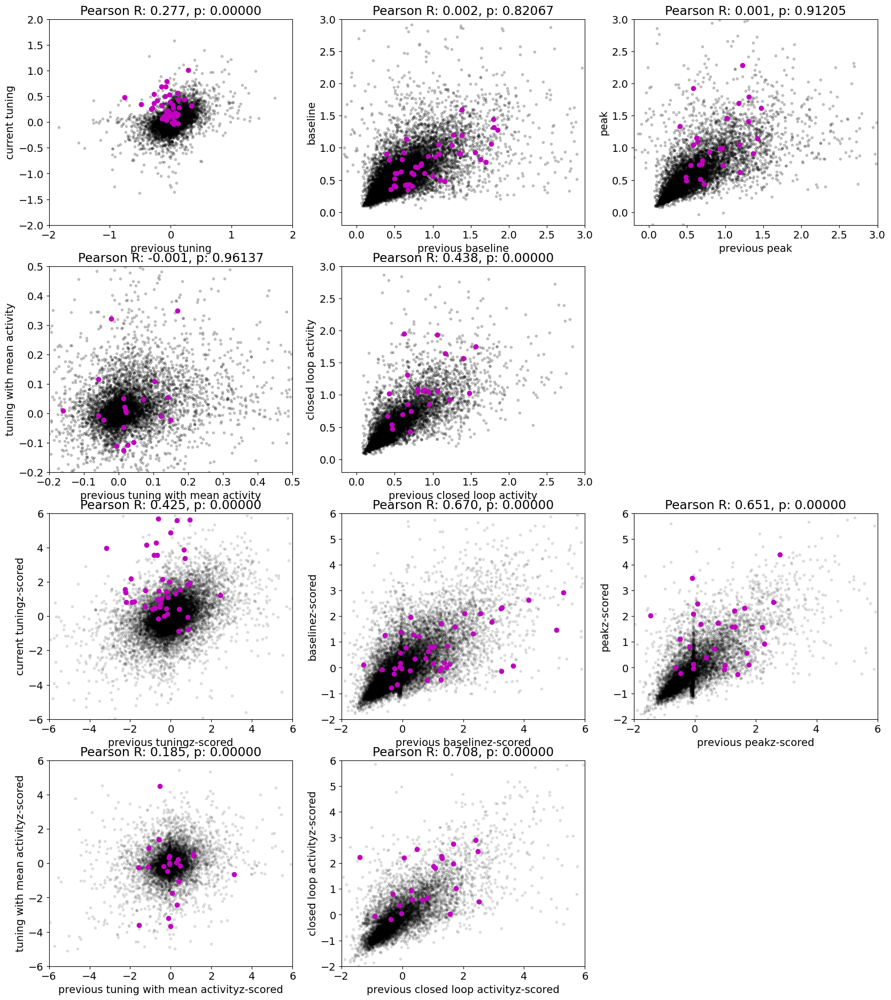

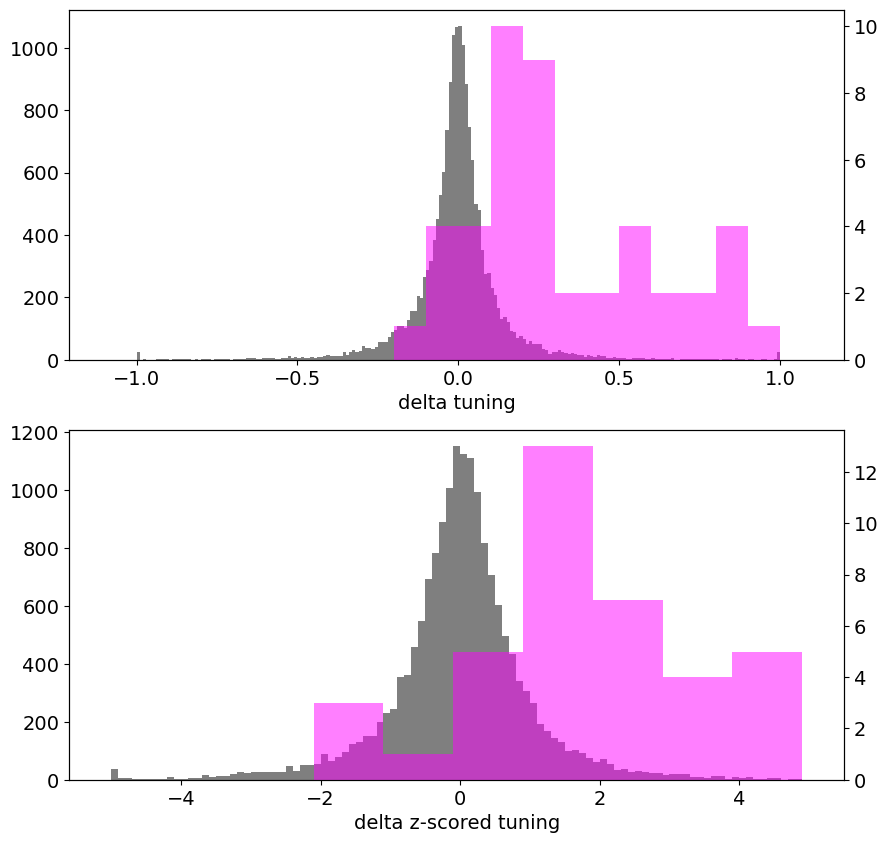

In [160]:
min_f0= 5
needed = np.concatenate(multi_session_dict['F0'])>min_f0

fig = plt.figure(figsize = [20,35])
lims = [[-2,2],[-.2,3],[-.2,3],[-.2,.5],[-.2,3]]
zscore_lims = [[-6,6],[-2,6],[-2,6],[-6,6],[-2,6]]
zscore_lim = [-6,6]
xnames = ['previous_tuning','previous_tuning_baseline','previous_tuning_peak','previous_mean_calculated_tuning','previous_mean_activity_closed_loop_selected']
ynames = ['tuning','tuning_baseline','tuning_peak','mean_calculated_tuning','mean_activity_closed_loop_selected']
xlabels = ['previous tuning','previous baseline','previous peak','previous tuning with mean activity','previous closed loop activity']
ylabels = ['current tuning','baseline','peak','tuning with mean activity','closed loop activity']
for i,(xname,yname,xlabel,ylabel,lim,zscore_lim) in enumerate(zip(xnames,
                                                                   ynames,
                                                                   xlabels,
                                                                   ylabels,
                                                                   lims,
                                                                 zscore_lims)):
    ax_tunings = fig.add_subplot(6,3,i+1)
    ax_tunings_zscored = fig.add_subplot(6,3,i+7)
    
    x = np.concatenate(multi_session_dict[yname])[needed]
    y = np.concatenate(multi_session_dict[xname])[needed]
    needed_now = (np.isnan(x) | np.isnan(y) | np.isinf(x) | np.isinf(y)) == False
    x = x[needed_now]
    y = y[needed_now]
    r_tuning  = scipy.stats.pearsonr(x,y)
    
    ax_tunings.plot(x,y,'k.',alpha = .2)
    cn_val_list = []
    x_all = []
    y_all = []
    for mat_idx in np.arange(len(multi_session_dict['delta_tuning'])):
        cn = multi_session_dict['cn'][mat_idx][0]-1
        ax_tunings.plot(multi_session_dict[xname][mat_idx][cn],multi_session_dict[yname][mat_idx][cn],'mo')
        
        needed_ = multi_session_dict['F0'][mat_idx]>min_f0
        x = multi_session_dict[yname][mat_idx][needed_]
        y = multi_session_dict[xname][mat_idx][needed_]
        needed_now = (np.isnan(x) | np.isnan(y) | np.isinf(x) | np.isinf(y)) == False
        x = x[needed_now]
        y = y[needed_now]
        x_cn = multi_session_dict[xname][mat_idx][cn]
        x_cn = (x_cn-np.nanmean(x))/np.nanstd(x)
        y_cn = multi_session_dict[yname][mat_idx][cn]
        y_cn = (y_cn-np.nanmean(y))/np.nanstd(y)
        
        x = (x-np.nanmean(x))/np.nanstd(x)
        y = (y-np.nanmean(y))/np.nanstd(y)
        ax_tunings_zscored.plot(x,y,'k.',alpha = .1)
        cn_val_list.append([x_cn,y_cn])
        x_all.append(x)
        y_all.append(y)
    r_tuning_zscore  = scipy.stats.pearsonr(np.concatenate(x_all),np.concatenate(y_all))
    cn_val_list = np.asarray(cn_val_list)
    ax_tunings_zscored.plot(cn_val_list[:,0],cn_val_list[:,1],'mo')
        
        
    ax_tunings.set_xlabel(xlabel)
    ax_tunings.set_ylabel(ylabel)
    ax_tunings.set_xlim(lim)
    ax_tunings.set_ylim(lim)
    ax_tunings.set_title('Pearson R: {:.3f}, p: {:.5f}'.format(*r_tuning))
    
    ax_tunings_zscored.set_xlabel(xlabel + 'z-scored')
    ax_tunings_zscored.set_ylabel(ylabel + 'z-scored')
    ax_tunings_zscored.set_xlim(zscore_lim)
    ax_tunings_zscored.set_ylim(zscore_lim)
    ax_tunings_zscored.set_title('Pearson R: {:.3f}, p: {:.5f}'.format(*r_tuning_zscore))

# calculate z-score delta tunings compare to delta tunings

delta_all_zscored = []
delta_cn_zscored = []
delta_all = []
delta_cn = []
xname  =  'previous_tuning'
yname  =  'tuning'
for mat_idx in np.arange(len(multi_session_dict['delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    needed_ = multi_session_dict['F0'][mat_idx]>min_f0
    x = multi_session_dict[yname][mat_idx][needed_]
    y = multi_session_dict[xname][mat_idx][needed_]
    needed_now = (np.isnan(x) | np.isnan(y) | np.isinf(x) | np.isinf(y)) == False
    x = x[needed_now]
    y = y[needed_now]
    x_cn = multi_session_dict[xname][mat_idx][cn]
    y_cn = multi_session_dict[yname][mat_idx][cn]
    
    delta_all.append(y-x)
    delta_cn.append(y_cn-x_cn)
    
    x_cn = (x_cn-np.nanmean(x))/np.nanstd(x)
    
    y_cn = (y_cn-np.nanmean(y))/np.nanstd(y)
    x = (x-np.nanmean(x))/np.nanstd(x)
    y = (y-np.nanmean(y))/np.nanstd(y)
    delta_all_zscored.append(y-x)
    delta_cn_zscored.append(y_cn-x_cn)

fig = plt.figure(figsize = [10,10])
ax1 = fig.add_subplot(2,1,1)

delta_all = np.concatenate(delta_all)
delta_all[delta_all>1] = 1
delta_all[delta_all<-1] = -1


ax1.hist(delta_all,np.arange(-1.1,1.1,.01),color = 'black',alpha = .5)
ax2 = ax1.twinx()
delta_cn = np.asarray(delta_cn)
delta_cn[delta_cn>1] = 1
delta_cn[delta_cn<-1] = -1
ax2.hist(delta_cn,np.arange(-1.1,1.1,.1),color = 'magenta',alpha = .5)
ax1.set_xlabel('delta tuning')


ax1 = fig.add_subplot(2,1,2)


delta_all_zscored = np.concatenate(delta_all_zscored)
delta_all_zscored[delta_all_zscored>5] = 5
delta_all_zscored[delta_all_zscored<-5] = -5
delta_cn_zscored = np.asarray(delta_cn_zscored)
delta_cn_zscored[delta_cn_zscored>5] = 5
delta_cn_zscored[delta_cn_zscored<-5] = -5
ax1.hist(delta_all_zscored,np.arange(-5.1,5.1,.1),color = 'black',alpha = .5)
ax2 = ax1.twinx()
ax2.hist(delta_cn_zscored,np.arange(-5.1,5.1,1),color = 'magenta',alpha = .5)
ax1.set_xlabel('delta z-scored tuning')



# how does delta baseline and delta peak correlate? - 




NameError: name 'cn_ps_prev' is not defined

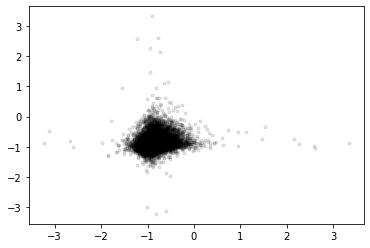

In [16]:
plt.plot(np.concatenate(multi_session_dict['previous_day_baseline_tuning_slope'])[:,0],np.concatenate(multi_session_dict['training_day_baseline_tuning_slope'])[:,0],'k.',alpha = .1)
plt.plot(cn_ps_prev,cn_ps_current,'mo')
plt.xlim([-2,.5])
plt.ylim([-2,.5])
plt.xlabel('baseline to tuning slope previous session')
plt.ylabel('baseline to tuning slope current session')
plt.plot([-1.5,0],[-1.5,0],'r--')

# 

Text(0.5, 0, 'baseline to tuning slopes')

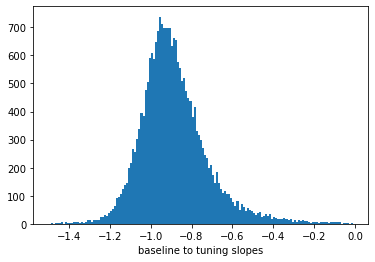

In [17]:
cn_ps_prev = []
cn_ps_current = []
for mat_idx  in np.arange(len(multi_session_dict['baseline_corrected_delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    if not np.isnan(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn]):
        cn_ps_prev.append(multi_session_dict['previous_day_baseline_tuning_slope'][mat_idx][cn][0])
        cn_ps_current.append(multi_session_dict['training_day_baseline_tuning_slope'][mat_idx][cn][0])

plt.hist(np.concatenate(multi_session_dict['previous_day_baseline_tuning_slope'])[:,0],np.arange(-1.5,0,.01))

plt.xlabel('baseline to tuning slopes')
#plt.yscale('log')

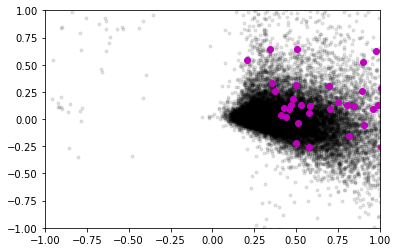

In [18]:
plt.plot(np.concatenate(multi_session_dict['previous_tuning_at_baseline_0']),
         np.concatenate(multi_session_dict['baseline_corrected_delta_tuning']),'k.',alpha = .1)
plt.xlim([-1,1])
plt.ylim([-1,1])

previous_tunings_list = []
delta_tunings = []
for mat_idx  in np.arange(len(multi_session_dict['baseline_corrected_delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    if not np.isnan(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn]):
        
        
        previous_tunings_list.append(multi_session_dict['previous_tuning_at_baseline_0'][mat_idx][cn])
        delta_tunings.append(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn])
previous_tunings_list = np.asarray(previous_tunings_list)
delta_tunings = np.asarray(delta_tunings)

plt.plot(previous_tunings_list,delta_tunings,'mo')




# TODO:
instead of fitting trial starts, try fitting just decay randomly for each cell for each day, or for the whole population

# Baseline fluctuations?
There are examples where:
based on the pre-go-cue activity, you can predict if the cell is going to be positively tuned in a given trial or not (excitability or membrane potential)
How much of the delta tuning can be explained by the changes in the pre-go-cue activity ??

Impressions: 
- if the duration where we calculate the amplitude is big (several seconds), then there is no relation between before-trial and within-trial activity, meaning that correction for that makes no sense (there is no decay whatsoever on that timescale) if we go shorter, the results don't look good anymore
- decay correction thus makes little sense in this setup.
- deconvolution should be the way to go, then.. but then what's the role of delta tuning?

Text(0.5, 0, 'F0')

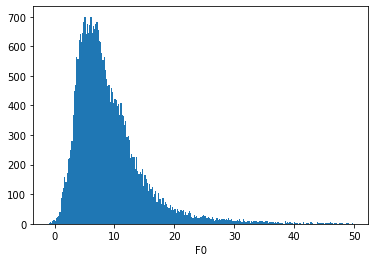

In [408]:
F0s = np.concatenate(multi_session_dict['F0'])
#F0s[F0s<=3]=3
needed = (np.isnan(F0s)|np.isinf(F0s))==False
plt.hist(F0s[needed],np.arange(-1,50,.2))
plt.xlabel('F0')

Text(0, 0.5, 'corrected delta tuning')

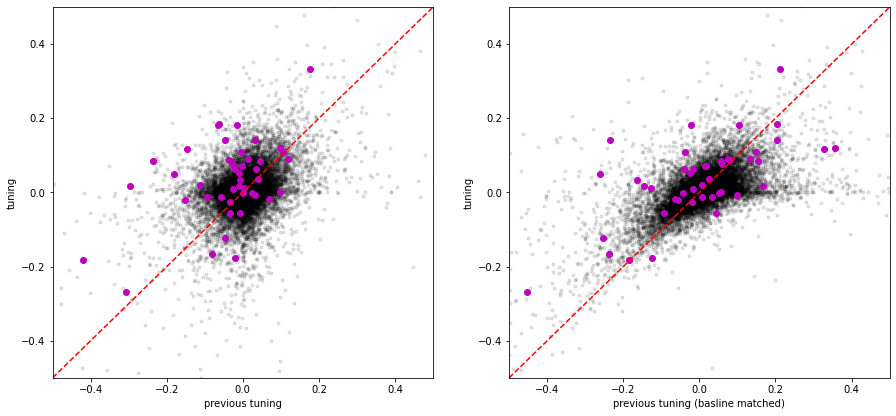

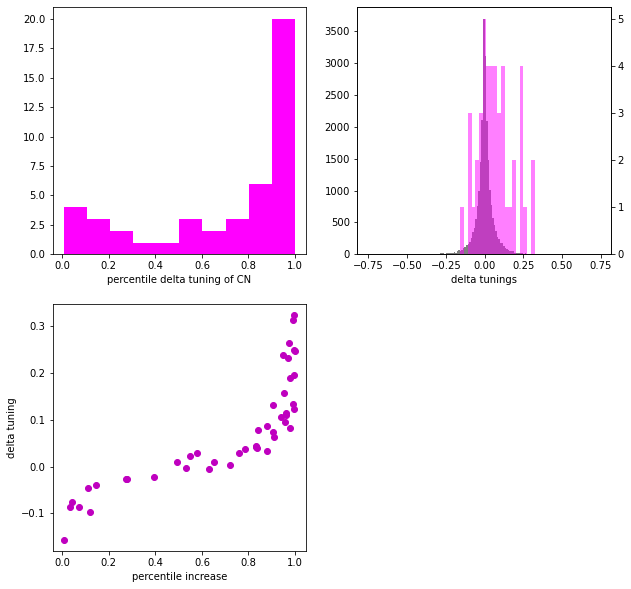

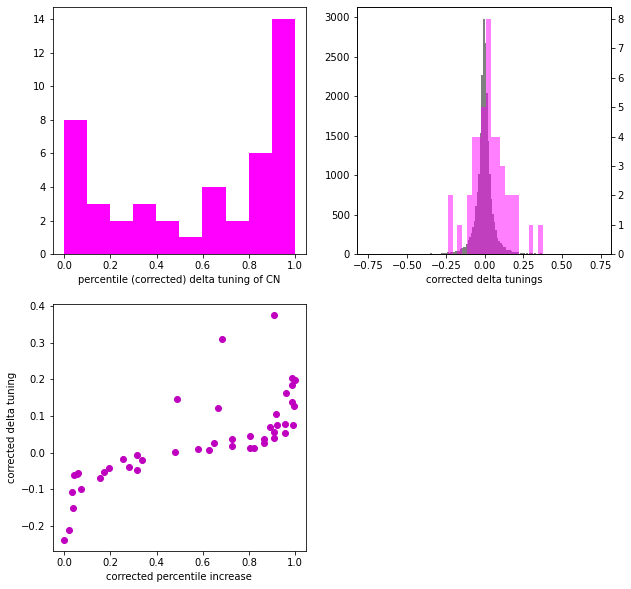

In [5]:
min_f0= 3
needed = np.concatenate(multi_session_dict['F0'])>min_f0
lims = [-.5,.5]
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax1.plot(np.concatenate(multi_session_dict['previous_tuning'])[needed],np.concatenate(multi_session_dict['tuning'])[needed],'k.',alpha = .1)
ax1.set_xlim(lims)
ax1.set_ylim(lims)
ax2 = fig.add_subplot(2,2,2)

ax2.plot(np.concatenate(multi_session_dict['baseline_matched_previous_tuning'])[needed],np.concatenate(multi_session_dict['tuning'])[needed],'k.',alpha = .1)
ax2.set_xlim(lims)
ax2.set_ylim(lims)

for mat_idx in np.arange(len(multi_session_dict['delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    ax1.plot(multi_session_dict['previous_tuning'][mat_idx][cn],multi_session_dict['tuning'][mat_idx][cn],'mo')
    ax2.plot(multi_session_dict['baseline_matched_previous_tuning'][mat_idx][cn],multi_session_dict['tuning'][mat_idx][cn],'mo')
ax1.plot(lims,lims,'r--')
ax2.plot(lims,lims,'r--')
ax1.set_xlabel('previous tuning')
ax1.set_ylabel('tuning')
ax2.set_xlabel('previous tuning (basline matched)')
ax2.set_ylabel('tuning')

percentile_list = []
delta_tunings = []
for mat_idx  in np.arange(len(multi_session_dict['delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    if not np.isnan(multi_session_dict['delta_tuning'][mat_idx][cn]):
        percentile = np.argmax(multi_session_dict['delta_tuning'][mat_idx][cn]<=np.sort(multi_session_dict['delta_tuning'][mat_idx]))/len(multi_session_dict['delta_tuning'][mat_idx])
        percentile_list.append(percentile)
        delta_tunings.append(multi_session_dict['delta_tuning'][mat_idx][cn])
fig = plt.figure(figsize = [10,10])
ax = fig.add_subplot(2,2,1)
ax.hist(percentile_list,color = 'magenta')
ax.set_xlabel('percentile delta tuning of CN')

all_delta_tunings = np.concatenate(multi_session_dict['delta_tuning'])
all_delta_tunings = all_delta_tunings[np.isnan(all_delta_tunings)==False]
ax2 = fig.add_subplot(2,2,2)
ax2cn = ax2.twinx()
ax2.hist(all_delta_tunings,np.arange(-.75,.75,.01),color = 'black',alpha = .5)
ax2cn.hist(delta_tunings,20,color = 'magenta',alpha = .5)
ax2.set_xlabel('delta tunings')

ax222 = fig.add_subplot(2,2,3)
ax222.plot(percentile_list,delta_tunings,'mo')
ax222.set_xlabel('percentile increase')
ax222.set_ylabel('delta tuning')


percentile_list = []
delta_tunings = []
for mat_idx  in np.arange(len(multi_session_dict['baseline_corrected_delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    if not np.isnan(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn]):
        percentile = np.argmax(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn]<=np.sort(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx]))/len(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx])
        percentile_list.append(percentile)
        delta_tunings.append(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn])
fig = plt.figure(figsize = [10,10])
ax = fig.add_subplot(2,2,1)
ax.hist(percentile_list,color = 'magenta')
ax.set_xlabel('percentile (corrected) delta tuning of CN')

all_delta_tunings = np.concatenate(multi_session_dict['baseline_corrected_delta_tuning'])
all_delta_tunings = all_delta_tunings[np.isnan(all_delta_tunings)==False]
ax2 = fig.add_subplot(2,2,2)
ax2cn = ax2.twinx()
ax2.hist(all_delta_tunings,np.arange(-.75,.75,.01),color = 'black',alpha = .5)
ax2cn.hist(delta_tunings,20,color = 'magenta',alpha = .5)
ax2.set_xlabel('corrected delta tunings')

ax222 = fig.add_subplot(2,2,3)
ax222.plot(percentile_list,delta_tunings,'mo')
ax222.set_xlabel('corrected percentile increase')
ax222.set_ylabel('corrected delta tuning')

Text(0, 0.5, 'decay corrected delta tuning')

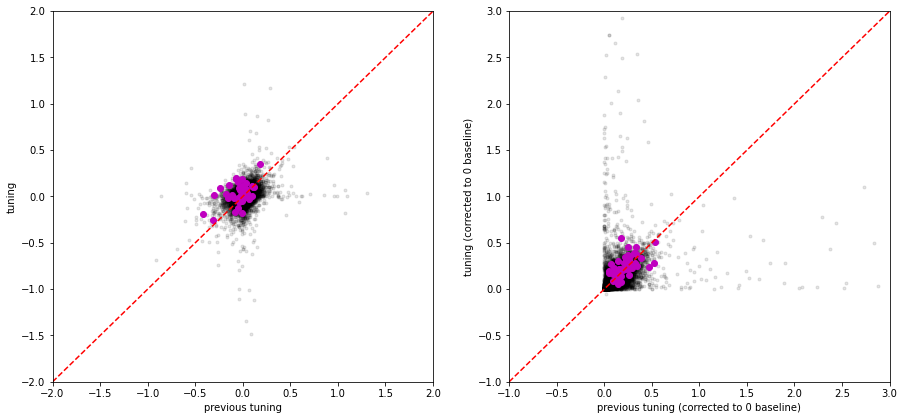

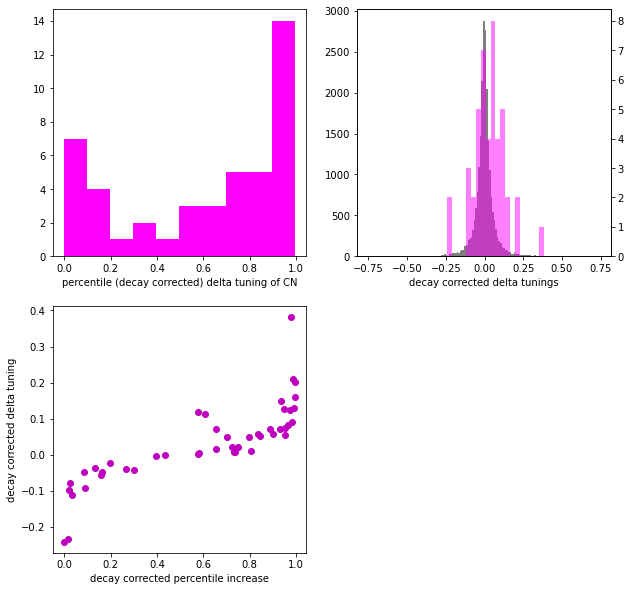

In [397]:
#same but at 0 baseline calculated for both sessions separately

min_f0= 3
needed = np.concatenate(multi_session_dict['F0'])>min_f0


lims = [-2,2]
lims2 = [-1,3]
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax1.plot(np.concatenate(multi_session_dict['previous_tuning'])[needed],np.concatenate(multi_session_dict['tuning'])[needed],'k.',alpha = .1)
ax1.set_xlim(lims)
ax1.set_ylim(lims)
ax2 = fig.add_subplot(2,2,2)
ax2.plot(np.concatenate(multi_session_dict['previous_tuning_at_baseline_0'])[needed],np.concatenate(multi_session_dict['tuning_at_baseline_0'])[needed],'k.',alpha = .1)
ax2.set_xlim(lims2)
ax2.set_ylim(lims2)

for mat_idx in np.arange(len(multi_session_dict['delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    ax1.plot(multi_session_dict['previous_tuning'][mat_idx][cn],multi_session_dict['tuning'][mat_idx][cn],'mo')
    ax2.plot(multi_session_dict['previous_tuning_at_baseline_0'][mat_idx][cn],multi_session_dict['tuning_at_baseline_0'][mat_idx][cn],'mo')
ax1.plot(lims,lims,'r--')
ax2.plot(lims2,lims2,'r--')
ax1.set_xlabel('previous tuning')
ax1.set_ylabel('tuning')
ax2.set_xlabel('previous tuning (corrected to 0 baseline)')
ax2.set_ylabel('tuning (corrected to 0 baseline)')


percentile_list = []
delta_tunings = []
for mat_idx  in np.arange(len(multi_session_dict['delta_tuning_at_baseline_0'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    if not np.isnan(multi_session_dict['delta_tuning_at_baseline_0'][mat_idx][cn]):
        percentile = np.argmax(multi_session_dict['delta_tuning_at_baseline_0'][mat_idx][cn]<=np.sort(multi_session_dict['delta_tuning_at_baseline_0'][mat_idx]))/len(multi_session_dict['delta_tuning_at_baseline_0'][mat_idx])
        percentile_list.append(percentile)
        delta_tunings.append(multi_session_dict['delta_tuning_at_baseline_0'][mat_idx][cn])
fig = plt.figure(figsize = [10,10])
ax = fig.add_subplot(2,2,1)
ax.hist(percentile_list,color = 'magenta')
ax.set_xlabel('percentile (decay corrected) delta tuning of CN')

all_delta_tunings = np.concatenate(multi_session_dict['delta_tuning_at_baseline_0'])
all_delta_tunings = all_delta_tunings[np.isnan(all_delta_tunings)==False]
ax2 = fig.add_subplot(2,2,2)
ax2cn = ax2.twinx()
ax2.hist(all_delta_tunings,np.arange(-.75,.75,.01),color = 'black',alpha = .5)
ax2cn.hist(delta_tunings,20,color = 'magenta',alpha = .5)
ax2.set_xlabel('decay corrected delta tunings')

ax222 = fig.add_subplot(2,2,3)
ax222.plot(percentile_list,delta_tunings,'mo')
ax222.set_xlabel('decay corrected percentile increase')
ax222.set_ylabel('decay corrected delta tuning')

In [288]:
mat_idx

65

(-0.25, 0.25)

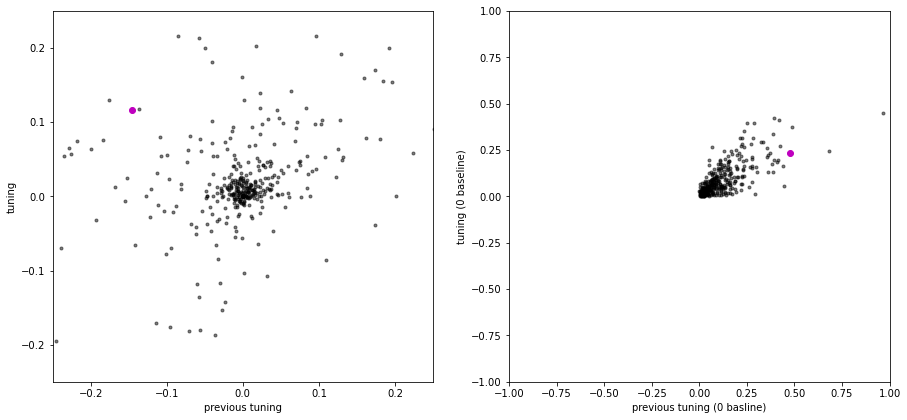

In [14]:
lims = [-.25,.25]
lims2 = [-1,1]
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)


mat_idx = 6
cn = multi_session_dict['cn'][mat_idx][0]-1
ax1.plot(multi_session_dict['previous_tuning'][mat_idx],multi_session_dict['tuning'][mat_idx],'k.',alpha =.5)
ax2.plot(multi_session_dict['previous_tuning_at_baseline_0'][mat_idx],multi_session_dict['tuning_at_baseline_0'][mat_idx],'k.',alpha = .5)

ax1.plot(multi_session_dict['previous_tuning'][mat_idx][cn],multi_session_dict['tuning'][mat_idx][cn],'mo')
ax2.plot(multi_session_dict['previous_tuning_at_baseline_0'][mat_idx][cn],multi_session_dict['tuning_at_baseline_0'][mat_idx][cn],'mo')
ax1.set_xlabel('previous tuning')
ax1.set_ylabel('tuning')
ax2.set_xlabel('previous tuning (0 basline)')
ax2.set_ylabel('tuning (0 baseline)')


ax2.set_xlim(lims2)
ax2.set_ylim(lims2)
ax1.set_xlim(lims)
ax1.set_ylim(lims)

(-1.0, 1.0)

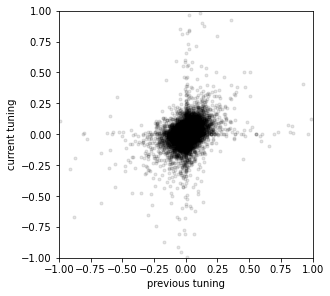

In [15]:
fig = plt.figure(figsize = [10,10])
ax1 = fig.add_subplot(2,2,1)
ax1.plot(np.concatenate(multi_session_dict['previous_tuning']),np.concatenate(multi_session_dict['tuning']),'k.',alpha = .1)
ax1.set_xlabel('previous tuning')
ax1.set_ylabel('current tuning')
ax1.set_xlim([-1,1])
ax1.set_ylim([-1,1])

(-1.0, 1.0)

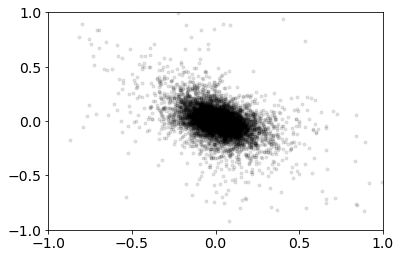

In [584]:
plt.plot(np.concatenate(multi_session_dict['previous_delta_tuning']),np.concatenate(multi_session_dict['delta_tuning']),'k.',alpha = .1)
plt.xlim([-1,1])
plt.ylim([-1,1])

In [585]:
import matplotlib
font = {'family' : 'normal',
        #'weight' : 'bold',
        'size'   : 14}
 
#figsavepath = '/home/jupyter/bucket/plots/dlc_matlab_cns_ridge_all_sessions/'
matplotlib.rc('font', **font)


In [586]:
#plt.plot(previous_delta_tuning_cn,delta_tuning_cn,'mo')

''

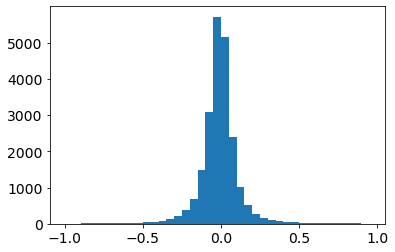

In [587]:
plt.hist(delta_tuning_matrix.flatten(),np.arange(-1,1,.05))
''

rew# long-term tuning changes
cells have stable tuning (except for the first few sessions)
But are there changes that stay long-term? - this is an important question that could be interesting form paAIP2 experiments
Check what happens after a delta-tuning change of a given magnitude from a given baseline

''

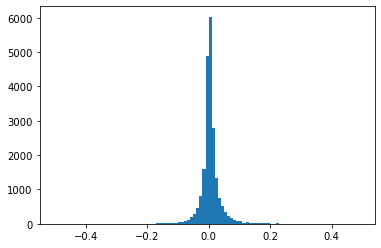

In [46]:
a_ = np.concatenate(multi_session_dict['mean_calculated_tuning'])
a_ = a_[np.isnan(a_)==False]
plt.hist(a_,np.arange(-.5,.5,.01))
''

In [47]:
delta_tuning_name_to_use = 'delta_tuning'
tuning_name_to_use = 'tuning'#delta_tuning_at_baseline_0

# delta_tuning_name_to_use = 'delta_tuning_at_baseline_0'
# tuning_name_to_use = 'tuning_at_baseline_0'#delta_tuning_at_baseline_0

# delta_tuning_name_to_use = 'delta_mean_calculated_tuning'
# tuning_name_to_use = 'mean_calculated_tuning'#delta_tuning_at_baseline_0



# create a tuning matrix (session x neuron) for all FOVs
new_start = False
tunings_megalist = []
tunings_list = []
tuning_lens = []
for mat_i in np.arange(len(multi_session_dict[delta_tuning_name_to_use])):
    if np.isnan(multi_session_dict[delta_tuning_name_to_use][mat_i][0]):
        new_start = True
        if mat_i>0:
            tunings_megalist.append(tunings_list)
            tunings_list = []
    else:
        new_start = False
    tunings_list.append(multi_session_dict[tuning_name_to_use][mat_i])
tuning_matrix = np.asarray(tunings_list)
session_nums_ = []
for tunings_list in tunings_megalist:
    session_nums_.append(len(tunings_list))
max_session_num_ = np.max(session_nums_)
tunings_megalist_ = []
for tunings_list in tunings_megalist:
    tuning_matrix = np.asarray(tunings_list)
    tuning_matrix_ = np.ones([max_session_num_,tuning_matrix.shape[1]])*np.nan
    tuning_matrix_[:tuning_matrix.shape[0],:] = tuning_matrix
    tunings_megalist_.append(tuning_matrix_)
tuning_matrix = np.concatenate(tunings_megalist_,1)

## plot how tuning turns out after a given delta tuning

/tmp/ipykernel_8234/3495408728.py:43: RuntimeWarning: Mean of empty slice
  ax_now.plot(sessiontrace,np.nanmean(aligned_traces,0),'k-',linewidth = 4)
/tmp/ipykernel_8234/3495408728.py:44: RuntimeWarning: Mean of empty slice
  ax_now2.plot(sessiontrace,np.nanmean(aligned_traces,0),'k-',linewidth = 4)
/tmp/ipykernel_8234/3495408728.py:48: RuntimeWarning: Mean of empty slice
  ax_all.plot(sessiontrace,np.nanmean(aligned_traces,0),label = title)
/tmp/ipykernel_8234/3495408728.py:54: RuntimeWarning: Mean of empty slice
  ax_basline_now.plot(sessiontrace,np.nanmean(aligned_traces[needed_traces,:],0),'k-',linewidth =4)
/tmp/ipykernel_8234/3495408728.py:55: RuntimeWarning: Mean of empty slice
  ax_basline_all.plot(sessiontrace,np.nanmean(aligned_traces[needed_traces,:],0),'-',linewidth =4)


(-1.5, 2.5)

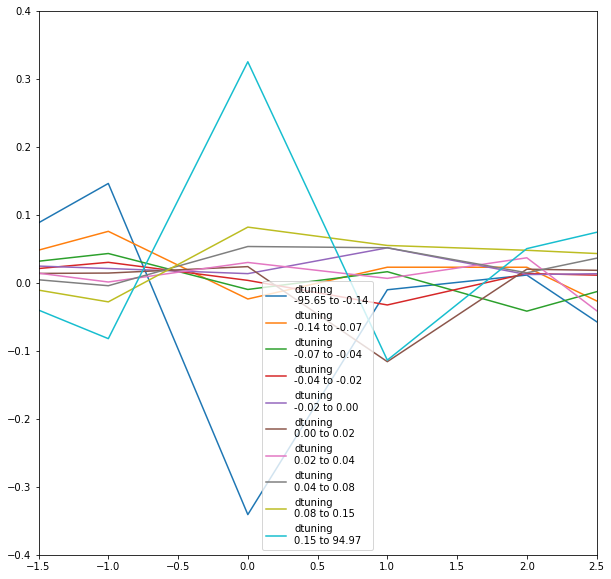

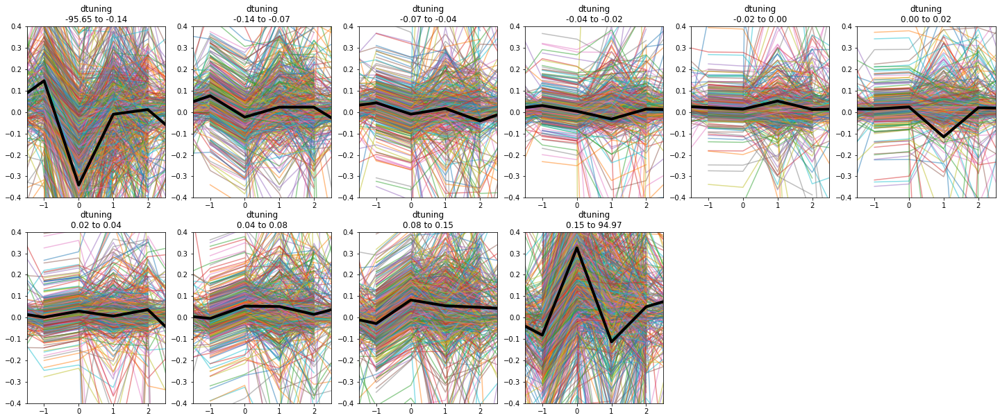

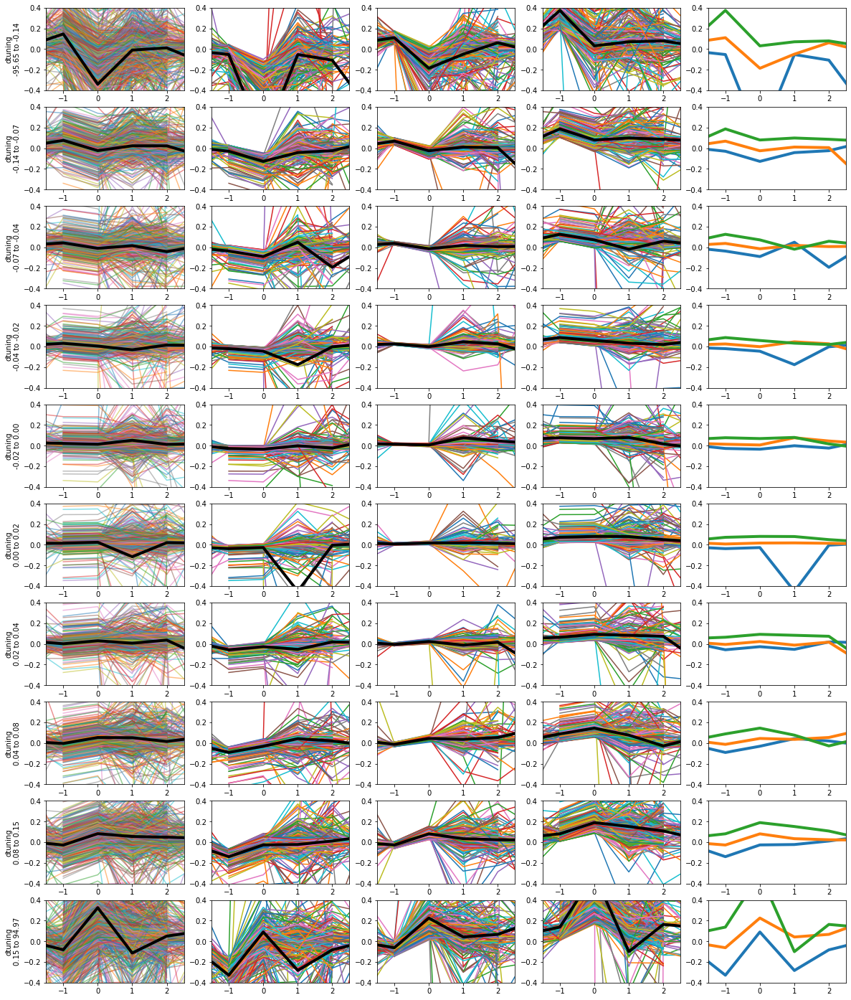

In [48]:
ylims  =[-.4,.4]
# ylims  =[-.1,.5] # for corrected tuning changes
# ylims  =[-.5,2] # for corrected tuning changes with rolling F0
# ylims  =[-.4,.4] #deconvolved?
must_have_index = 2 # 1 = a day after the changerewrew

xlims = [-1.5,must_have_index+.5]

baseline_percentile_edges = [0,33,66,100]
delta_tuning_matrix = np.diff(tuning_matrix,axis = 0)
dtm_nonan = delta_tuning_matrix[np.isnan(delta_tuning_matrix)==False]

delta_edges  = [-1,-.5,-.4,-.3,-.2,-.1,0,.1,.2,.3,.4,.5,1]
delta_edges = np.percentile(dtm_nonan,np.arange(0,101,10))

fig_all = plt.figure(figsize = [10,10])
ax_all = fig_all.add_subplot(1,1,1)
fig = plt.figure(figsize = [25,10])
fig_by_baseline = plt.figure(figsize = [20,25])
for interval_i,(edge_start,edge_end) in enumerate(zip(delta_edges[:-1],delta_edges[1:])):
    ax_now = fig.add_subplot(2,6,interval_i+1)
    ax_now2 = fig_by_baseline.add_subplot(len(delta_edges)-1,len(baseline_percentile_edges)+1,interval_i*(1+len(baseline_percentile_edges))+1)
    aligned_traces = []   
    baseline_values = []
    for tuning_row in tuning_matrix.T:#tuning_matrix
        sessiontrace = np.arange(20+len(tuning_row)) - (int(len(tuning_row)/2)+8)
        indices_to_plot = np.where((np.diff(tuning_row)>=edge_start)&(np.diff(tuning_row)<=edge_end))[0]
        for max_i in indices_to_plot:
            tuning_row_ = np.concatenate([[np.nan]*10,tuning_row,[np.nan]*10])
            aligned_trace = np.roll(tuning_row_,max_i*-1)#+10)
            if np.isnan(aligned_trace[np.argmax(sessiontrace == must_have_index)]):
                continue # this is skipped
            ax_now.plot(sessiontrace,aligned_trace,alpha = .5)
            ax_now2.plot(sessiontrace,aligned_trace,alpha = .5)
            aligned_traces.append(aligned_trace)
            baseline_values.append(aligned_trace[np.argmax(sessiontrace == -1)])
    ax_now.set_ylim(ylims)
    ax_now.set_xlim(xlims)
    ax_now2.set_ylim(ylims)
    ax_now2.set_xlim(xlims)
    aligned_traces = np.asarray(aligned_traces)
    baseline_values = np.asarray(baseline_values)
    ax_now.plot(sessiontrace,np.nanmean(aligned_traces,0),'k-',linewidth = 4)
    ax_now2.plot(sessiontrace,np.nanmean(aligned_traces,0),'k-',linewidth = 4)
    title = 'dtuning\n{:.2f} to {:.2f}'.format(edge_start,edge_end)
    ax_now.set_title(title)
    ax_now2.set_ylabel(title)
    ax_all.plot(sessiontrace,np.nanmean(aligned_traces,0),label = title)
    ax_basline_all = fig_by_baseline.add_subplot(len(delta_edges)-1,len(baseline_percentile_edges)+1,interval_i*(len(baseline_percentile_edges)+1)+len(baseline_percentile_edges)+1)
    for baseline_i,(baseline_perc_start,baseline_perc_end) in enumerate(zip(baseline_percentile_edges[:-1],baseline_percentile_edges[1:])):
        ax_basline_now = fig_by_baseline.add_subplot(len(delta_edges)-1,len(baseline_percentile_edges)+1,interval_i*(1+len(baseline_percentile_edges))+2+baseline_i)
        needed_traces = (baseline_values>=np.percentile(baseline_values,baseline_perc_start)) & (baseline_values<=np.percentile(baseline_values,baseline_perc_end))
        ax_basline_now.plot(sessiontrace,aligned_traces[needed_traces,:].T)
        ax_basline_now.plot(sessiontrace,np.nanmean(aligned_traces[needed_traces,:],0),'k-',linewidth =4)
        ax_basline_all.plot(sessiontrace,np.nanmean(aligned_traces[needed_traces,:],0),'-',linewidth =4)
        ax_basline_now.set_ylim(ylims)
        ax_basline_now.set_xlim(xlims)
    ax_basline_all.set_ylim(ylims)
    ax_basline_all.set_xlim(xlims)
        
ax_all.legend()
ax_all.set_ylim(ylims)
ax_all.set_xlim(xlims)
   # asdas

The plot above shows that a big delta tuning usually tunes down on the next day, but generally the bigger a tuning change is, the bigger it's staying effect is

# Are there tuning changes of the CN the day after conditioning?

..no

Text(0, 0.5, 'tuning post-conditioning')

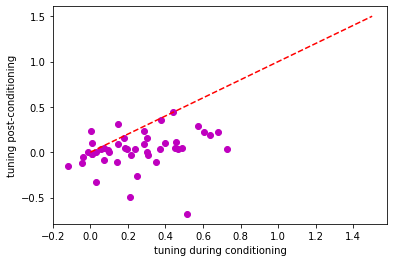

In [49]:
conditioning_cn_tuning = []
postconditioning_cn_tuning = []
for mat_idx  in np.arange(len(multi_session_dict['delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    previous_cn = multi_session_dict['previous_cn'][mat_idx]-1
    if not np.isnan(multi_session_dict['delta_tuning'][mat_idx][cn]):
        conditioning_cn_tuning.append(multi_session_dict['previous_tuning'][mat_idx][previous_cn])
        postconditioning_cn_tuning.append(multi_session_dict['tuning'][mat_idx][previous_cn])
plt.plot(conditioning_cn_tuning,postconditioning_cn_tuning,'mo')
plt.plot([0,1.5],[0,1.5],'r--')
plt.xlabel('tuning during conditioning')
plt.ylabel('tuning post-conditioning')

Text(0, 0.5, 'corrected tuning post-conditioning')

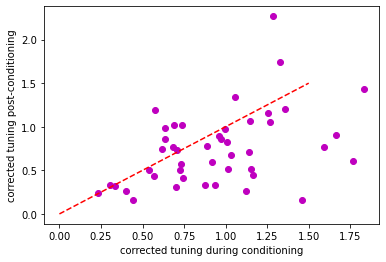

In [25]:
conditioning_cn_tuning = []
postconditioning_cn_tuning = []
for mat_idx  in np.arange(len(multi_session_dict['baseline_corrected_delta_tuning'])):
    cn = multi_session_dict['cn'][mat_idx][0]-1
    previous_cn = multi_session_dict['previous_cn'][mat_idx]-1
    if not np.isnan(multi_session_dict['baseline_corrected_delta_tuning'][mat_idx][cn]):
        conditioning_cn_tuning.append(multi_session_dict['previous_tuning_at_baseline_0'][mat_idx][previous_cn])
        postconditioning_cn_tuning.append(multi_session_dict['tuning_at_baseline_0'][mat_idx][previous_cn])
plt.plot(conditioning_cn_tuning,postconditioning_cn_tuning,'mo')
plt.plot([0,1.5],[0,1.5],'r--')
plt.xlabel('corrected tuning during conditioning')
plt.ylabel('corrected tuning post-conditioning')

/tmp/ipykernel_32581/89742793.py:2: RuntimeWarning: Mean of empty slice
  mean_tuning = np.nanmean(tuning_matrix,0)


<ErrorbarContainer object of 3 artists>

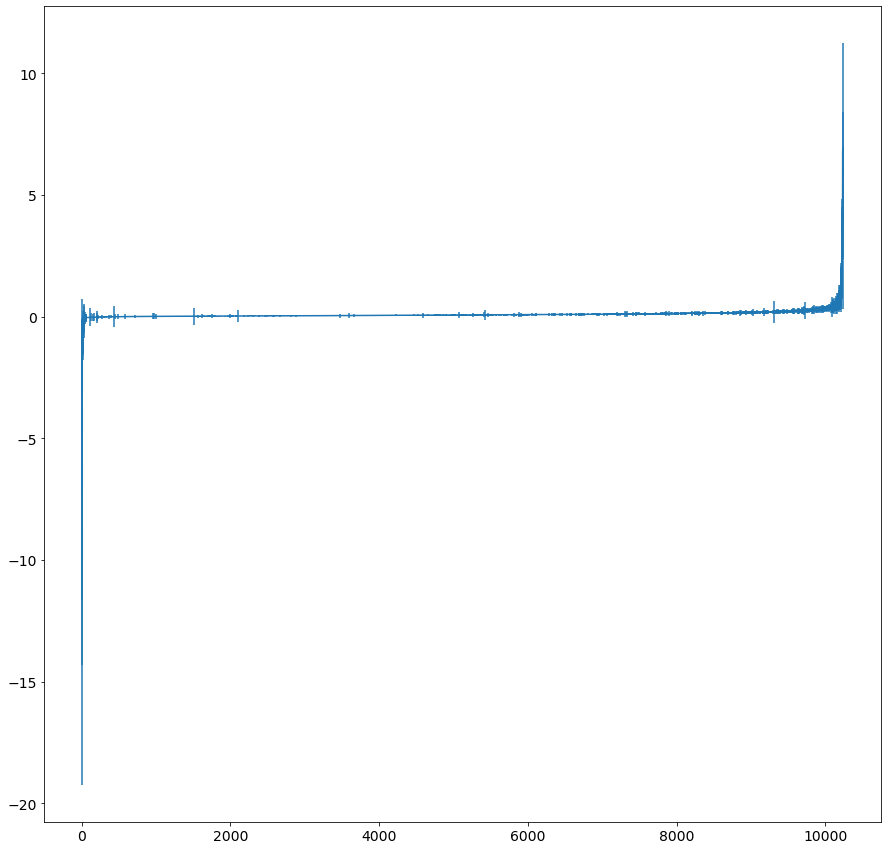

In [512]:
fig = plt.figure(figsize = [15,15])
mean_tuning = np.nanmean(tuning_matrix,0)
std_tuning = np.nanstd(tuning_matrix,0)/np.sqrt(tuning_matrix.shape[0])
order = np.argsort(mean_tuning)
plt.errorbar(np.arange(len(mean_tuning)),mean_tuning[order],std_tuning[order])


In [88]:
tuning_matrix = np.asarray(tunings_list)

In [86]:
new_start = False
tunings_list = []
for mat_i in np.arange(len(multi_session_dict['delta_tuning'])):
    if np.isnan(multi_session_dict['delta_tuning'][mat_i][0]):
        new_start = True
        if mat_i>0:
            asda
    else:
        new_start = False
    tunings_list.append(multi_session_dict['tuning'][mat_i])
tuning_matrix = np.asarray(tunings_list)

NameError: name 'asda' is not defined

(array([ 1.,  1.,  1.,  1.,  7.,  8., 15.,  4.,  4.,  3.]),
 array([-0.50815382, -0.44640803, -0.38466224, -0.32291646, -0.26117067,
        -0.19942488, -0.1376791 , -0.07593331, -0.01418752,  0.04755827,
         0.10930405]),
 <BarContainer object of 10 artists>)

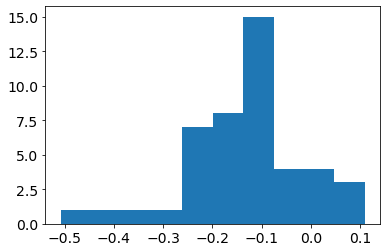

In [60]:
plt.hist(delta_tuning_previouscn)


The idea is that there is a saturatable system that gives rise to delta tunings.
If saturatable, the learning (delta tuning) on the previous session has to have a negative effect on delta tuning on the current session.
This effect has to be smaller and smaller as days go by, given that the saturation will be compensated for with time.
There are two predictions:
- you can get bigger delta tunings if the mouse wasn't trained for multiple days
- the delta tuning should depend less on previous delta tuning if the mouse wasn't trained for multiple days

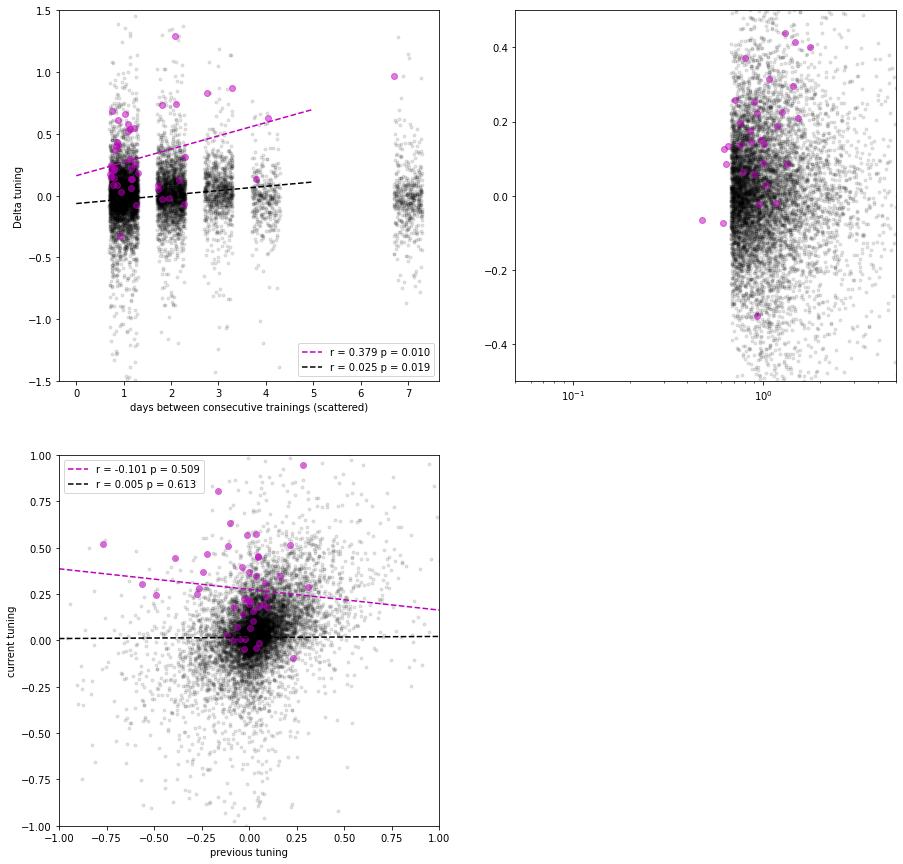

In [30]:
# 


delta_tuning_threshold_p = 1.05
only_increasing_cells = False
only_decreasing_cells = False
threshold_to_be_increasing = 0
previous_tuning_all  =[]
delta_day_all = []
delta_tuning_all = []
previous_delta_tuning_all = []
current_std_all = []
significant_tuning_all = []
delta_tuning_all_p = []

delta_day_cn = []
delta_tuning_cn = []
previous_delta_tuning_cn = []
previous_tuning_cn = []
current_std_cn = []

delta_tuning_previouscn = []
previous_tuning_previouscn = []

for delta_days,delta_tuning,cn,previous_tuning,dff_std,tuning_std,trial_n,bootstrapped_delta_tuning,previous_delta_tuning,previous_cn in zip(multi_session_dict['days_since_last_session'], #days_since_last_2sessions
                                                                                                                                           multi_session_dict['delta_tuning'],#delta_tuning#delta_tuning_at_baseline_0#delta_tuning_2sessions
                                                                                                                                           multi_session_dict['cn'],
                                                                                                                                           multi_session_dict['previous_tuning'], #previous_tuning_at_baseline_0#previous_tuning_back_2_sessions
                                                                                                                                           multi_session_dict['sd_dff_closed_loop'],
                                                                                                                                           multi_session_dict['std_tuning'],
                                                                                                                                           multi_session_dict['n_trials'],
                                                                                                                                           multi_session_dict['bootstrapped_delta_tuning'],
                                                                                                                                           multi_session_dict['previous_delta_tuning'],
                                                                                                                                           multi_session_dict['previous_cn']):
    cn = cn[0]-1
    previous_cn = previous_cn-1
    if np.isnan(delta_days) or (np.isnan(delta_tuning[0])):
        continue
    needed__ = np.isnan(delta_tuning) == False
    
    
    delta_day_all.append(np.ones(len(delta_tuning[needed__]))*delta_days)
    delta_tuning_all.append(delta_tuning[needed__])
    previous_tuning_all.append(previous_tuning[needed__])
    current_std_all.append(dff_std[needed__])
    significant_tuning_all.append(np.abs(delta_tuning[needed__]+previous_tuning[needed__]) > tuning_std[needed__]/np.sqrt(trial_n))
    previous_delta_tuning_all.append(previous_delta_tuning[needed__])
    
    
    zero_percentile = np.argmax(np.sort(bootstrapped_delta_tuning,axis = 0)>0,axis = 0)/bootstrapped_delta_tuning.shape[0]
    p_values = np.nanmin([1-zero_percentile,zero_percentile],0)

    delta_tuning_all_p.append(p_values[needed__])
    
    delta_day_cn.append(delta_days)
    delta_tuning_cn.append(delta_tuning[cn])
    previous_delta_tuning_cn.append(previous_delta_tuning[cn])
    previous_tuning_cn.append(previous_tuning[cn])
    current_std_cn.append(dff_std[cn])
    
    delta_tuning_previouscn.append(delta_tuning[previous_cn])
    previous_tuning_previouscn.append(previous_tuning[previous_cn])
    

previous_tuning_cn = np.asarray(previous_tuning_cn)
delta_day_cn = np.asarray(delta_day_cn)
delta_tuning_cn = np.asarray(delta_tuning_cn)
previous_delta_tuning_cn = np.asarray(previous_delta_tuning_cn)
current_std_cn = np.asarray(current_std_cn)
    
delta_tuning_previouscn = np.asarray(delta_tuning_previouscn)
previous_tuning_previouscn = np.asarray(previous_tuning_previouscn)    

delta_day_all = np.concatenate(delta_day_all)
delta_tuning_all = np.concatenate(delta_tuning_all)
previous_tuning_all = np.concatenate(previous_tuning_all)
current_std_all = np.concatenate(current_std_all)
significant_tuning_all = np.concatenate(significant_tuning_all)
delta_tuning_all_p = np.concatenate(delta_tuning_all_p)
previous_delta_tuning_all= np.concatenate(previous_delta_tuning_all)

needed_neurons =  (delta_tuning_all_p<delta_tuning_threshold_p) & (current_std_all >np.percentile(current_std_cn,10))
if only_increasing_cells:    
    needed_neurons = needed_neurons & (delta_tuning_all>threshold_to_be_increasing)#significant_tuning_all#delta_tuning_all>0#(current_std_all >np.percentile(current_std_cn,10)  )# & (delta_tuning_all+previous_tuning_all >0)
elif only_decreasing_cells:
    needed_neurons = needed_neurons & (delta_tuning_all<-threshold_to_be_increasing)#significant_tuning_all#delta_tuning_all>0#(current_std_all >np.percentile(current_std_cn,10)  )# & (delta_tuning_all+previous_tuning_all >0)
delta_day_all = delta_day_all[needed_neurons]
delta_tuning_all = delta_tuning_all[needed_neurons]
previous_tuning_all = previous_tuning_all[needed_neurons]
current_std_all = current_std_all[needed_neurons]
previous_delta_tuning_all= previous_delta_tuning_all[needed_neurons]



fig = plt.figure(figsize = [15,15])
ax_all_cells = fig.add_subplot(2,2,1)
ax_prev_vs_delta = fig.add_subplot(2,2,3)

ax_delta_tuning_vs_std = fig.add_subplot(2,2,2)
    
ax_all_cells.plot(delta_day_all+np.random.uniform(-.3,.3,len(delta_day_all)),delta_tuning_all,'k.',alpha = .1)
ax_all_cells.plot(delta_day_cn+np.random.uniform(-.3,.3,len(delta_day_cn)),delta_tuning_cn,'mo',alpha = .5)
ax_all_cells.set_ylim([-1.5,1.5])
ax_all_cells.set_xlabel('days between consecutive trainings (scattered)')
ax_all_cells.set_ylabel('Delta tuning')

p_cn = np.polyfit(delta_day_cn,delta_tuning_cn,1)
r_cn  = scipy.stats.pearsonr(delta_day_cn,delta_tuning_cn)
ax_all_cells.plot(np.arange(6),np.polyval(p_cn,np.arange(6)),'m--',label = 'r = {:.3f} p = {:.3f}'.format(*r_cn))

p_all = np.polyfit(delta_day_all,delta_tuning_all,1)
r_all  = scipy.stats.pearsonr(delta_day_all,delta_tuning_all)
ax_all_cells.plot(np.arange(6),np.polyval(p_all,np.arange(6)),'k--',label = 'r = {:.3f} p = {:.3f}'.format(*r_all))

ax_all_cells.legend()



ax_prev_vs_delta.plot(previous_tuning_all,previous_tuning_all+delta_tuning_all,'k.',alpha = .1)
ax_prev_vs_delta.plot(previous_tuning_cn,previous_tuning_cn+delta_tuning_cn,'mo',alpha = .5)
ax_prev_vs_delta.set_xlabel('previous tuning')
ax_prev_vs_delta.set_ylabel('current tuning')

x = previous_tuning_cn
y = previous_tuning_cn+delta_tuning_cn
p_cn = np.polyfit(x,y,1)
r_cn  = scipy.stats.pearsonr(x,y)
ax_prev_vs_delta.plot(np.arange(-1,2),np.polyval(p_cn,np.arange(-1,2)),'m--',label = 'r = {:.3f} p = {:.3f}'.format(*r_cn))

x = previous_tuning_all
y = previous_tuning_all+delta_tuning_all

p_all = np.polyfit(x,y,1)
r_all  = scipy.stats.pearsonr(x,y)
ax_prev_vs_delta.plot(np.arange(-1,2),np.polyval(p_all,np.arange(-1,2)),'k--',label = 'r = {:.3f} p = {:.3f}'.format(*r_all))


ax_prev_vs_delta.legend()

ax_prev_vs_delta.set_xlim([-1,1])
ax_prev_vs_delta.set_ylim([-1,1])

ax_delta_tuning_vs_std.plot(current_std_all,delta_tuning_all,'k.',alpha = .1)
ax_delta_tuning_vs_std.plot(current_std_cn,delta_tuning_cn,'mo',alpha = .5)

ax_delta_tuning_vs_std.set_xlim([.05,5])
ax_delta_tuning_vs_std.set_ylim([-.5,.5])
ax_delta_tuning_vs_std.set_xscale('log')

current_tuning_all = previous_tuning_all + delta_tuning_all
current_tuning_previouscn = previous_tuning_previouscn + delta_tuning_previouscn
current_tuning_cn = previous_tuning_cn + delta_tuning_cn

(-1.0, 1.0)

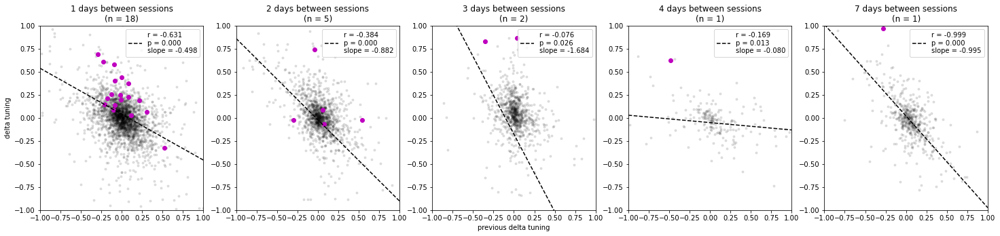

In [31]:
lims = [-1,1]

fig = plt.figure(figsize = [25,5])
for d_i,delta_day in enumerate(np.unique(delta_day_all)):
    needed = delta_day_all == delta_day
    x = previous_delta_tuning_all[needed]#
    y = delta_tuning_all[needed]
    needed = (np.isnan(x)==False) & (np.isnan(y)==False)
    x = x[needed]
    y=y[needed]
    if d_i == 0:
        ax_now = fig.add_subplot(1,5,d_i+1)
    else:
        ax_now = fig.add_subplot(1,5,d_i+1,sharex = ax_now,sharey = ax_now)
    
    ax_now.plot(x,y,'k.',alpha = .1)
    needed_cn = delta_day_cn == delta_day
    ax_now.plot(previous_delta_tuning_cn[needed_cn],delta_tuning_cn[needed_cn],'mo',alpha = 1)
    ax_now.set_title('{} days between sessions\n(n = {})'.format(int(delta_day),np.sum((delta_day_cn==delta_day) & (np.isnan(previous_delta_tuning_cn)==False))))
    p_all = np.polyfit(x,y,1)
    r_all  = scipy.stats.pearsonr(x,y)
    ax_now.plot(np.arange(-1,2),np.polyval(p_all,np.arange(-1,2)),'k--',label = 'r = {:.3f}\np = {:.3f}\nslope = {:.3f}'.format(*r_all,p_all[0]))
    ax_now.legend()
    if d_i == 0:
        ax_now.set_ylabel('delta tuning')
    elif d_i == 2:
        ax_now.set_xlabel('previous delta tuning')
ax_now.set_xlim(lims)
ax_now.set_ylim(lims)

(-0.5, 0.5)

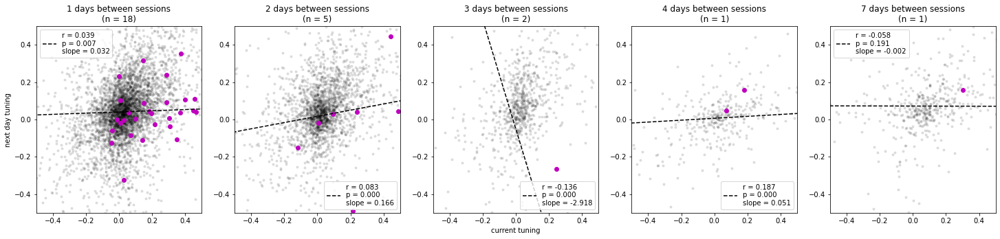

In [32]:
lims = [-.5,.5]
minimum_previous_abs_tuning  = 0
fig = plt.figure(figsize = [25,5])
for d_i,delta_day in enumerate(np.unique(delta_day_all)):
    needed = (delta_day_all == delta_day) & (minimum_previous_abs_tuning<np.abs(previous_tuning_all))#& (minimum_previous_abs_tuning<np.abs(current_tuning_all))
    x = previous_tuning_all[needed]#
    y = current_tuning_all[needed]
    needed = (np.isnan(x)==False) & (np.isnan(y)==False)
    x = x[needed]
    y=y[needed]
    if d_i == 0:
        ax_now = fig.add_subplot(1,5,d_i+1)
    else:
        ax_now = fig.add_subplot(1,5,d_i+1,sharex = ax_now,sharey = ax_now)
    
    ax_now.plot(x,y,'k.',alpha = .1)
    needed_cn = delta_day_cn == delta_day
    ax_now.plot(previous_tuning_previouscn[needed_cn],current_tuning_previouscn[needed_cn],'mo',alpha = 1)
    ax_now.set_title('{} days between sessions\n(n = {})'.format(int(delta_day),np.sum((delta_day_cn==delta_day) & (np.isnan(previous_delta_tuning_cn)==False))))
    p_all = np.polyfit(x,y,1)
    r_all  = scipy.stats.pearsonr(x,y)
    ax_now.plot(np.arange(-1,2),np.polyval(p_all,np.arange(-1,2)),'k--',label = 'r = {:.3f}\np = {:.3f}\nslope = {:.3f}'.format(*r_all,p_all[0]))
    ax_now.legend()
    if d_i == 0:
        ax_now.set_ylabel('next day tuning')
    elif d_i == 2:
        ax_now.set_xlabel('current tuning')
ax_now.set_xlim(lims)
ax_now.set_ylim(lims)

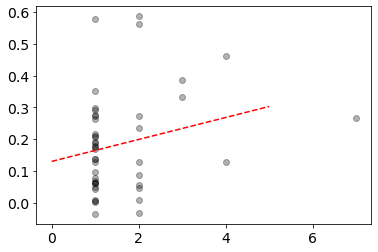

In [68]:

plt.plot(delta_day_cn,delta_tuning_cn,'ko',alpha = .3)
p = np.polyfit(delta_day_cn,delta_tuning_cn,1)
plt.plot(np.arange(6),np.polyval(p,np.arange(6)),'r--')
#plt.


(array([  2.,   1.,   9.,  44., 241., 141.,  30.,  11.,   3.,   1.]),
 array([-0.20129692, -0.1585043 , -0.11571169, -0.07291907, -0.03012645,
         0.01266617,  0.05545878,  0.0982514 ,  0.14104402,  0.18383664,
         0.22662926]),
 <BarContainer object of 10 artists>)

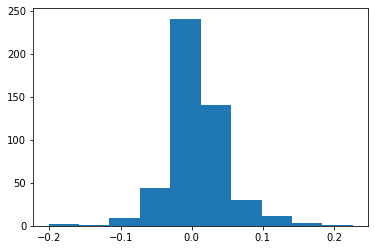

In [31]:
plt.hist(mean_amplitudes)

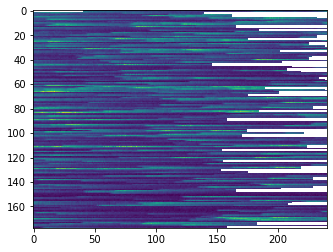

In [23]:
plt.imshow(dff_trial_locked[:,0,:].squeeze().T)

In [36]:



reward_indices = np.where(data_raw['rew'][0])[0]
trial_start_indices = np.where(data_raw['trial_start'][0])[0]
lickport_move_indices = np.where(BCI_analysis.plot_utils.rollingfun(data_raw['vel'][0],3)==1)[0]
averaged_lickport_speed = BCI_analysis.plot_utils.rollingfun(data_raw['vel'][0],20)
hits = []
hit_rate_vector = np.zeros_like(data_raw['trial_start'][0])

for i,ti in enumerate(trial_start_indices):
    if i<len(trial_start_indices)-1:
        tii = trial_start_indices[i+1]
    else:
        tii = len(data_raw['trial_start'][0])
    if any((reward_indices>ti) & (reward_indices<tii)):
        hits.append(True)
    else:
        hits.append(False)
hits = np.asarray(hits)   

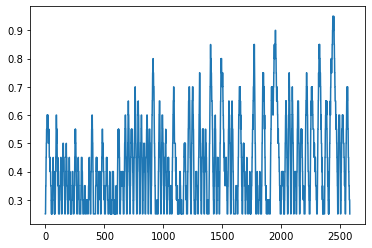

In [34]:
plt.plot(averaged_lickport_speed[averaged_lickport_speed>0.2])

In [47]:
multi_session_dict['lickport_move_indices'][0]

array([  707,   801,  1047,  1048,  2405,  3376,  4790,  5204,  5444,
        5445,  5446,  5752,  5978,  5985,  6270,  6274,  6278,  6431,
        6432,  6514,  6515,  6516,  6644,  6888,  6892,  6893,  7078,
        7082,  7083,  7084,  7085,  7239,  7240,  7241,  7245,  7246,
        7247,  7256,  7655,  7656,  7660,  7661,  7834,  7835,  7839,
        7932,  8459,  8460,  8461,  8462,  8463,  8464,  9239,  9243,
        9244,  9248,  9444,  9445,  9446,  9450,  9594,  9595,  9596,
        9733,  9734,  9741,  9745,  9749,  9977,  9981, 10194, 10195,
       10201, 10792, 10793, 10794, 10795, 10796, 10797, 10801, 10802,
       10806, 11255, 11259, 11260, 11261, 11262, 11266, 11270, 11274,
       11279, 11283, 11602, 11603, 11604, 11605, 11606, 11607, 11608,
       11609, 11818, 11825, 11826, 11827, 12039, 12040, 12177, 12181,
       12182, 12911, 12912, 12913, 12914, 12915, 12919, 12920, 12921,
       12925, 12926, 13631, 13635, 13636, 13637, 13638, 13883, 13887,
       13888, 13889,

/tmp/ipykernel_1371/752445798.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure()


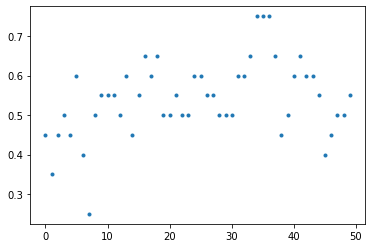

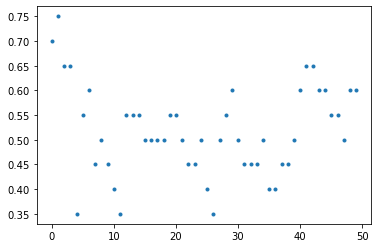

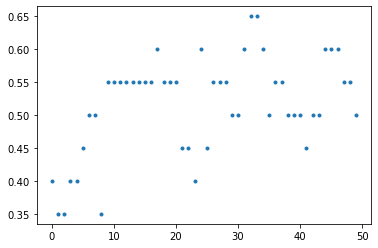

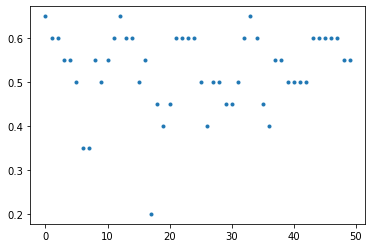

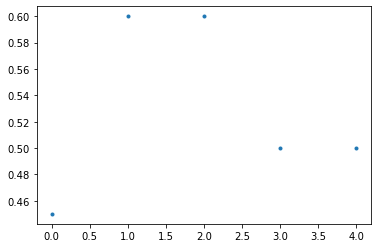

...

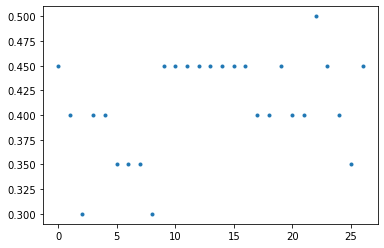

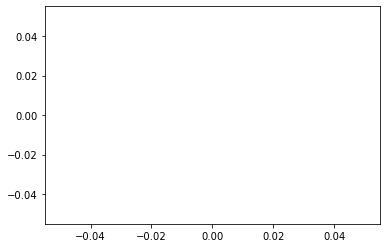

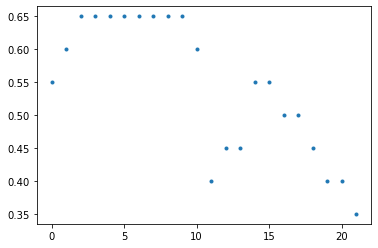

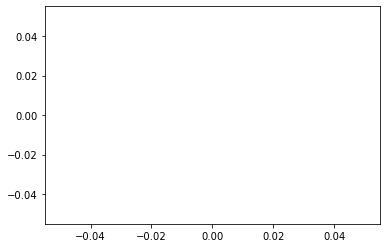

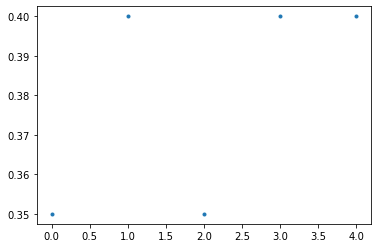

In [109]:
slope_list = []
for idx in np.arange(len(multi_session_dict['vel'])):#[:15]:
    vel = multi_session_dict['vel'][idx]
    rew= multi_session_dict['rew'][idx]
    reward_rate= BCI_analysis.plot_utils.rollingfun(rew,20*60)
    lickport_move_indices = np.where(BCI_analysis.plot_utils.rollingfun(vel,3)==1)[0]
    averaged_lickport_speed = BCI_analysis.plot_utils.rollingfun(vel,20)
    
    x = np.arange(len(averaged_lickport_speed[lickport_move_indices]))
    y = averaged_lickport_speed[lickport_move_indices]
    x = x[:50]
    y = y[:50]
    fig=plt.figure()
    plt.plot(x,y,'.')
    try:
        slope,offset = np.polyfit(x,y,1)
        slope_list.append(slope)
    except:
        pass
    #asd
#plt.xlim([0,200])

In [130]:
reward_rate

array([0.00416667, 0.00416667, 0.00416667, 0.00416667, 0.005     ,
       0.005     , 0.00416667, 0.005     , 0.005     , 0.00416667,
       0.00416667, 0.005     , 0.00416667, 0.00416667, 0.005     ,
       0.00416667, 0.00416667, 0.005     , 0.005     , 0.00416667,
       0.00416667, 0.00416667, 0.00416667, 0.00416667, 0.00416667,
       0.00583333, 0.00666667, 0.00583333, 0.00583333, 0.00583333,
       0.00666667, 0.00583333, 0.00583333, 0.00583333, 0.005     ,
       0.00666667, 0.00583333, 0.005     , 0.005     , 0.00583333,
       0.00416667, 0.00333333, 0.00416667, 0.00416667, 0.005     ,
       0.005     , 0.005     , 0.005     , 0.00333333, 0.00416667,
       0.00416667, 0.005     , 0.00416667, 0.005     , 0.00583333,
       0.005     , 0.005     , 0.00583333, 0.00583333, 0.005     ,
       0.005     , 0.005     , 0.00416667, 0.00416667, 0.00416667,
       0.00416667, 0.00416667, 0.00416667, 0.00416667, 0.00333333,
       0.00333333, 0.00333333, 0.0025    , 0.0025    , 0.00083

In [111]:
big_matrix = []
reward_rate_matrix = []
reward_rate_matrix_per_reward = []
speed_matrix_per_bigstep = []
s_len = 60 # trial number
seconds_for_averaging_reward_rate = 120
seconds_for_averaging_lickport_speed = 3
max_rewards_for_speed_analysis = 10
speed_len = 200
minimum_step_len_needed = 1
for idx in np.arange(len(multi_session_dict['vel'])):#[:15]:
    hits = multi_session_dict['hits'][idx]
    rew= multi_session_dict['rew'][idx]
    vel= multi_session_dict['vel'][idx]
    trial_start_indices = multi_session_dict['trial_start_indices'][idx]
    hit_rate = BCI_analysis.plot_utils.rollingfun(hits,10)
    if (hit_rate[0]>=.9) or(hit_rate[0]<=.1):
        continue
    reward_rate= BCI_analysis.plot_utils.rollingfun(rew,20*seconds_for_averaging_reward_rate)*20*60 #rew/minute
    lickport_speed= BCI_analysis.plot_utils.rollingfun(vel,20*seconds_for_averaging_lickport_speed)*20 #steps/sec
    #reward_rate[:20*seconds_for_averaging_reward_rate] = np.nan
    hit_indices = np.where(rew==1)[0]
    hit_indices = np.where(rew==1)[0]
    reward_rate_per_r = reward_rate[hit_indices]#
    reward_rate = reward_rate[trial_start_indices]#
    
    
    # hit_rate = hit_rate[10:]
    # hits = hits[10:]
    
    #hit_rate = hit_rate[hits == 1]
    
    # fig = plt.figure()
    # plt.plot(hit_rate)#[hits==1])
    t = np.zeros(s_len)*np.nan
    t[:np.min([s_len,len(hit_rate)])] = hit_rate[:np.min([s_len,len(hit_rate)])]
    big_matrix.append(t)
    
    t = np.zeros(s_len)*np.nan
    t[:np.min([s_len,len(reward_rate)])] = reward_rate[:np.min([s_len,len(reward_rate)])]
    reward_rate_matrix.append(t)
    t = np.zeros(s_len)*np.nan
    t[:np.min([s_len,len(reward_rate_per_r)])] = reward_rate_per_r[:np.min([s_len,len(reward_rate_per_r)])]
    reward_rate_matrix_per_reward.append(t)
    
    
    vel = np.asarray(vel,float)
    onsets = np.where(np.diff(vel)==1)[0]
    offsets = np.where(np.diff(vel)==-1)[0]
    on_lens = []
    for on in onsets:
        off = offsets[np.argmax(offsets>on)]
        on_lens.append(off-on)
    
    on_lens = np.asarray(on_lens)
    needed_on = (onsets<hit_indices[max_rewards_for_speed_analysis]) &(on_lens >=minimum_step_len_needed)
    onsets = onsets[needed_on]
    on_lens = on_lens[needed_on]
    on_speeds = lickport_speed[onsets]
    t = np.zeros(speed_len)*np.nan
    t[:np.min([speed_len,len(on_speeds)])] = on_speeds[:np.min([speed_len,len(on_speeds)])]
    speed_matrix_per_bigstep.append(t)
    
big_matrix = np.asarray(big_matrix)
reward_rate_matrix = np.asarray(reward_rate_matrix)

reward_rate_matrix_per_reward = np.asarray(reward_rate_matrix_per_reward)

speed_matrix_per_bigstep = np.asarray(speed_matrix_per_bigstep)
speed_matrix_per_bigstep_norm=speed_matrix_per_bigstep -speed_matrix_per_bigstep[:,0][:,np.newaxis]

# reward_rate_matrix-=reward_rate_matrix[:,0][:,np.newaxis]
# reward_rate_matrix_per_reward-=reward_rate_matrix_per_reward[:,0][:,np.newaxis]


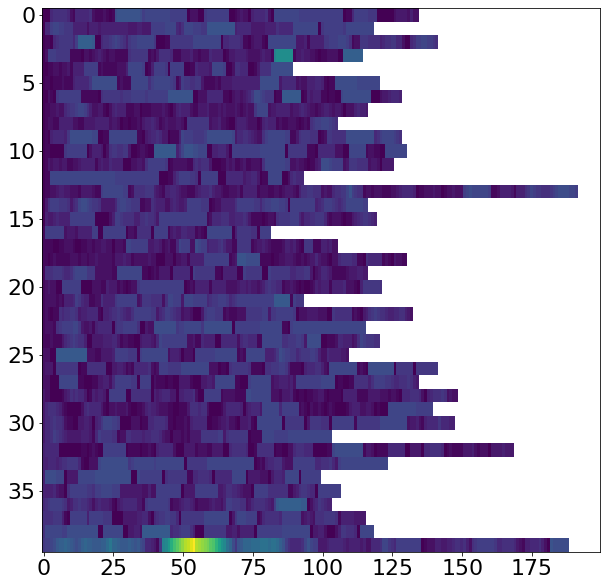

In [112]:
order = np.argsort(speed_matrix_per_bigstep[:,0])
fig = plt.figure(figsize = [10,10])
plt.imshow(speed_matrix_per_bigstep[order[:-10],:],aspect = 'auto',interpolation = 'none')

Text(0, 0.5, 'rewards/min')

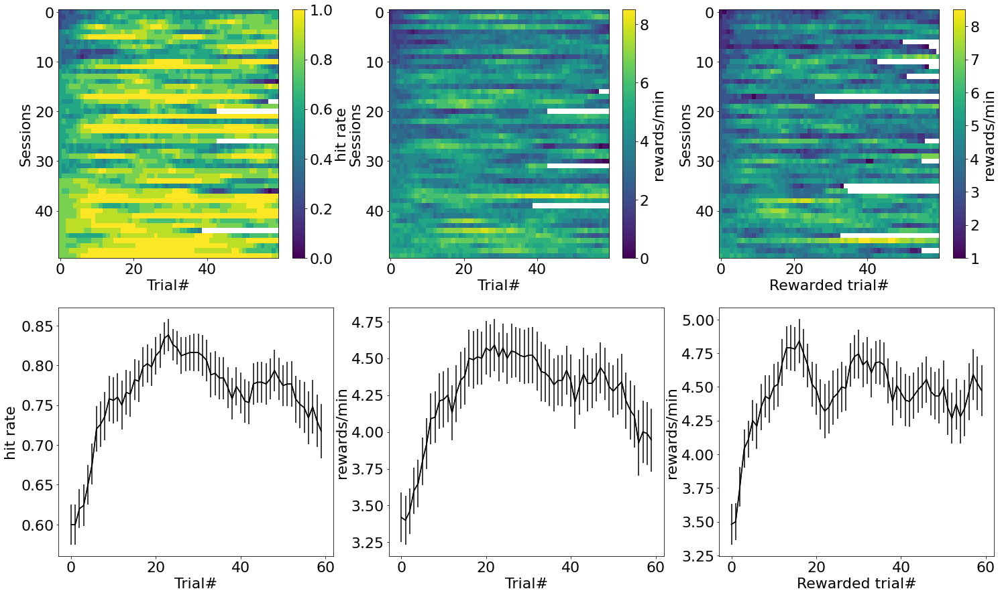

In [113]:
import matplotlib
font = {'family' : 'normal',
        #'weight' : 'bold',
        'size'   : 22}
 
#figsavepath = '/home/jupyter/bucket/plots/dlc_matlab_cns_ridge_all_sessions/'
matplotlib.rc('font', **font)


fig = plt.figure(figsize = [25,15])
ax1 = fig.add_subplot(2,3,1)
order = np.argsort(big_matrix[:,0])
im  = ax1.imshow(big_matrix[order,:],aspect = 'auto',interpolation = 'none')    
ax1.set_xlabel('Trial#')
ax1.set_ylabel('Sessions')
plt.colorbar(im,ax = ax1,label = 'hit rate')
ax2 = fig.add_subplot(2,3,4)
ax2.plot(np.nanmean(big_matrix,0),'k-')
#ax2.plot(reward_rate_matrix.T,'k-',alpha = .5)
ax2.errorbar(np.arange(s_len),np.nanmean(big_matrix,0),np.nanstd(big_matrix,0)/np.sqrt(big_matrix.shape[0]),color = 'black')
ax2.set_xlabel('Trial#')
ax2.set_ylabel('hit rate')


ax1 = fig.add_subplot(2,3,2)
order = np.argsort(reward_rate_matrix[:,0])
im  = ax1.imshow(reward_rate_matrix[order,:],aspect = 'auto',interpolation = 'none')    
ax1.set_xlabel('Trial#')
ax1.set_ylabel('Sessions')
plt.colorbar(im,ax = ax1,label = 'rewards/min')
ax2 = fig.add_subplot(2,3,5)
ax2.plot(np.nanmean(reward_rate_matrix,0),'k-')
#ax2.plot(reward_rate_matrix.T,'k-',alpha = .5)
ax2.errorbar(np.arange(s_len),np.nanmean(reward_rate_matrix,0),np.nanstd(reward_rate_matrix,0)/np.sqrt(reward_rate_matrix.shape[0]),color = 'black')
ax2.set_xlabel('Trial#')
ax2.set_ylabel('rewards/min')


ax1 = fig.add_subplot(2,3,3)
order = np.argsort(reward_rate_matrix_per_reward[:,0])
im  = ax1.imshow(reward_rate_matrix_per_reward[order,:],aspect = 'auto',interpolation = 'none')    
ax1.set_xlabel('Rewarded trial#')
ax1.set_ylabel('Sessions')
plt.colorbar(im,ax = ax1,label = 'rewards/min')
ax2 = fig.add_subplot(2,3,6)
ax2.plot(np.nanmean(reward_rate_matrix_per_reward,0),'k-')
#ax2.plot(reward_rate_matrix_per_reward.T,'k-',alpha = .5)
ax2.errorbar(np.arange(s_len),np.nanmean(reward_rate_matrix_per_reward,0),np.nanstd(reward_rate_matrix_per_reward,0)/np.sqrt(reward_rate_matrix_per_reward.shape[0]),color = 'black')
ax2.set_xlabel('Rewarded trial#')
ax2.set_ylabel('rewards/min')